##  Importación de librerías

paso por aqui 1 de 1216
paso por aqui 2 de 1216
paso por aqui 3 de 1216
paso por aqui 4 de 1216
paso por aqui 5 de 1216
paso por aqui 6 de 1216
paso por aqui 7 de 1216
paso por aqui 8 de 1216
paso por aqui 9 de 1216
paso por aqui 10 de 1216
paso por aqui 11 de 1216
paso por aqui 12 de 1216
paso por aqui 13 de 1216
paso por aqui 14 de 1216
paso por aqui 15 de 1216
paso por aqui 16 de 1216
paso por aqui 17 de 1216
paso por aqui 18 de 1216
paso por aqui 19 de 1216
paso por aqui 20 de 1216
paso por aqui 21 de 1216
paso por aqui 22 de 1216
paso por aqui 23 de 1216
paso por aqui 24 de 1216
paso por aqui 25 de 1216
paso por aqui 26 de 1216
paso por aqui 27 de 1216
paso por aqui 28 de 1216
paso por aqui 29 de 1216
paso por aqui 30 de 1216
paso por aqui 31 de 1216
paso por aqui 32 de 1216
paso por aqui 33 de 1216
paso por aqui 34 de 1216
paso por aqui 35 de 1216
paso por aqui 36 de 1216
paso por aqui 37 de 1216
paso por aqui 38 de 1216
paso por aqui 39 de 1216
paso por aqui 40 de 1216
paso por 

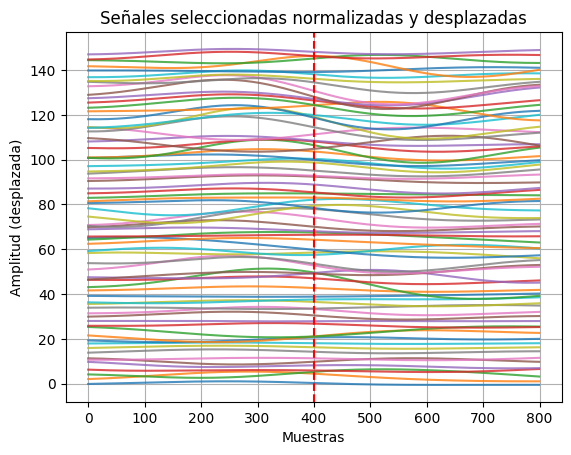

(800, 800)
Eigenvalues: 152729.73
0.9286595
0.09286595


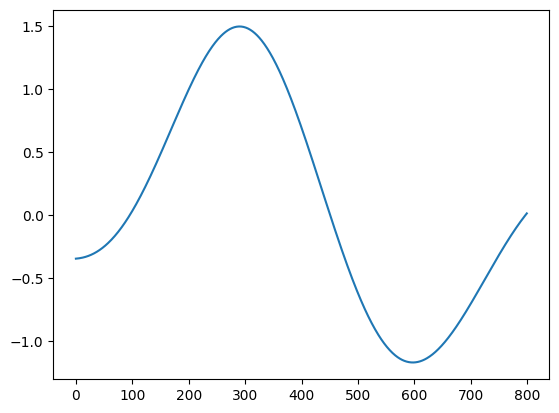

In [1]:
# ============================================================================
# SECCIÓN 1: IMPORTACIÓN DE LIBRERÍAS
# ============================================================================

# Importar librerías nativas python
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import find_peaks, peak_widths
import scipy.signal
from scipy.signal import hilbert

# Importar librería creada
from hdas_features_bueno import HDAS

# ============================================================================
# SECCIÓN 2: CARGA Y PREPROCESAMIENTO DE DATOS
# ============================================================================

filenames = ['2025_02_28_05h03m41s_ch1_HDAS_2Dmap_Strain.bin']

H = HDAS('.',filenames)

H.removeTrend()
H.removeCoherentNoise()
H.filter(0.1,0.5)
H.da = H.da[418:493,:]

# ============================================================================
# SECCIÓN 3: DEFINICIÓN DE DATOS Y PARÁMETROS
# ============================================================================

aux = 400

# Índices de las señales y sus posiciones centrales
indices_posiciones = [
    (0, 13150), (1, 13100), (2, 12900), (3, 12750), (4, 12650),
    (5, 12550), (6, 12100), (7, 11950), (8, 11900), (9, 11750),
    (10, 11600), (11, 11500), (12, 11350), (13, 10950), (14, 10750),
    (15, 10650), (16, 10600), (17, 10500), (18, 10250), (19, 10100),
    (20, 10000), (21, 9900), (22, 9800), (23, 9450), (24, 9250),
    (25, 9450), (26, 9250), (27, 9200), (28, 9150), (29, 9000),
    (30, 9500), (31, 9250), (32, 9150), (33, 9100), (34, 8250),
    (35, 8200), (36, 8150), (37, 8100), (38, 8000), (39, 8000),
    (40, 7650), (41, 7500), (42, 7300), (43, 7100), (44, 7000),
    (45, 6850), (46, 6750), (47, 6550), (48, 6350), (49, 6300),
    (50, 6200), (51, 6000), (52, 5950), (53, 5900), (54, 5850),
    (55, 5800), (56, 5650), (57, 5200), (58, 5150), (59, 5000),
    (60, 4950), (61, 4650), (62, 4650), (63, 4500), (64, 4400),
    (65, 4300), (66, 4150), (67, 4100), (68, 3850), (69, 3800),
    (70, 3250), (71, 3375), (72, 3125), (73, 3350), (74, 3050)
]

# ============================================================================
# SECCIÓN 4: PROCESAMIENTO Y VISUALIZACIÓN DE SEÑALES INDIVIDUALES
# ============================================================================

plt.figure(21)

# Lista para almacenar las señales normalizadas
senales_normalizadas = []

# Recorre las señales seleccionadas
for offset, (i, centro) in enumerate(indices_posiciones):
    señal = H.da[i, (centro - aux):(centro + aux)]
    señal_norm = señal  # Normalización
    plt.plot(señal_norm + offset*2, label=f'SP {i}', alpha=0.8)
    senales_normalizadas.append(señal_norm)

# Convertir la lista a matriz numpy (cada fila es una señal)
plt.axvline(x=aux, color='red', linestyle='--', label='Centro (x=500)')
plt.title('Señales seleccionadas normalizadas y desplazadas')
plt.xlabel('Muestras')
plt.ylabel('Amplitud (desplazada)')
plt.grid(True)
plt.show()

matriz_senales = np.array(senales_normalizadas)

# Calcular el promedio punto a punto
senal_promedio = np.mean(matriz_senales, axis=0)
plt.plot(senal_promedio, label='Promedio')

# ============================================================================
# SECCIÓN 5: CÁLCULO DE EIGENVALORES Y PARÁMETROS
# ============================================================================

# Producto de la transpuesta de senalX por senalX
senales_normalizadas = np.array(senales_normalizadas)
senal_producto = np.dot(senales_normalizadas.T, senales_normalizadas)
print(senal_producto.shape)

# Eigenvalor máximo de la matriz senal_producto
eigenvalues, eigenvectors = np.linalg.eig(senal_producto)
k = eigenvalues
print('Eigenvalues:', max(k))
k = k / np.linalg.norm(k)
print(max(k))
delta = max(k)/10
print(delta)

# ============================================================================
# SECCIÓN 6: FUNCIONES DE THRESHOLD
# ============================================================================

# Función: soft_threshold
def soft_threshold(x, threshold):
    return np.sign(x) * np.maximum(np.abs(x) - threshold, 0)

# Función: hard_threshold
def hard_threshold(x, threshold, percentile=95):
    """
    Hard-threshold que mantiene solo los valores más grandes
    
    percentile: percentil por encima del cual se mantienen los valores
    """
    abs_x = np.abs(x)
    threshold_val = np.percentile(abs_x, percentile)
    mask = abs_x >= threshold_val
    result = np.zeros_like(x)
    result[mask] = x[mask]
    return result

# ============================================================================
# SECCIÓN 7: ALGORITMO FISTA MEJORADO
# ============================================================================

# Función: fista_deconvolution_L1_enhanced
def fista_deconvolution_L1_enhanced(ir, y, delta, rho, 
                                  sparsity_factor=1.0, 
                                  threshold_mode='soft',
                                  adaptive_sparsity=False,
                                  imax=200, tol=1e-8):
    """
    FISTA con control mejorado de sparsity
    
    Parámetros:
    - sparsity_factor: Factor multiplicativo para el threshold (>1 = más sparse)
    - threshold_mode: 'soft', 'hard', o 'adaptive'
    - adaptive_sparsity: Si True, aumenta sparsity_factor con las iteraciones
    """
    x = np.zeros_like(y)
    r = x.copy()
    t = 1
    x_prev = x.copy()
    
    MAX_VALUE = 1e6
    MIN_VALUE = -1e6
    
    sparsity_evolution = []
    
    for iteration in range(imax):
        try:
            conv_result = np.convolve(r, ir, mode='full')[:len(y)]
            grad = conv_result - y
            
            if np.any(np.isnan(grad)) or np.any(np.isinf(grad)):
                break
            grad = np.clip(grad, MIN_VALUE, MAX_VALUE)
            
            step = r - delta * grad
            
            # Aplicar threshold con factor de sparsity
            current_sparsity = sparsity_factor
            if adaptive_sparsity:
                # Aumentar sparsity gradualmente
                current_sparsity = sparsity_factor * (1 + 0.01 * iteration)
            
            if threshold_mode == 'soft':
                r = soft_threshold(step, delta * rho)
            elif threshold_mode == 'hard':
                r = hard_threshold(step, delta * rho * current_sparsity)
            elif threshold_mode == 'adaptive':
                # Combinar soft y hard threshold
                if iteration < imax // 2:
                    r = soft_threshold(step, delta * rho)
                else:
                    r = hard_threshold(step, delta * rho * current_sparsity, percentile=98)
            
            if np.any(np.isnan(r)) or np.any(np.isinf(r)):
                r = np.nan_to_num(r, nan=0.0, posinf=MAX_VALUE, neginf=MIN_VALUE)
            r = np.clip(r, MIN_VALUE, MAX_VALUE)
            
            t_new = 0.5 * (1 + np.sqrt(1 + 4 * t**2))
            if np.isnan(t_new) or np.isinf(t_new):
                t_new = 1.0
            
            momentum_term = (t - 1) / t_new * (r - x_prev)
            x = r + momentum_term
            x = np.clip(x, MIN_VALUE, MAX_VALUE)
            
            # Calcular métrica de sparsity
            sparsity_metric = np.sum(np.abs(x) < 1e-6) / len(x)  # Porcentaje de valores ~cero
            sparsity_evolution.append(sparsity_metric)
            
            if iteration > 0:
                change = np.linalg.norm(x - x_prev) / (np.linalg.norm(x_prev) + 1e-12)
                if change < tol:
                    break
            
            t = t_new
            x_prev = x.copy()
            
        except Exception:
            break
    
    return x, sparsity_evolution

# ============================================================================
# SECCIÓN 8: OPTIMIZACIÓN DE PARÁMETROS DE SPARSITY
# ============================================================================

# Función: find_optimal_sparsity_factor
def find_optimal_sparsity_factor(ir, y, delta, rho, target_sparsity=0.9, 
                               sparsity_range=None, max_iterations=50):
    """
    Busca el factor de sparsity que produzca el nivel de sparsity deseado
    
    target_sparsity: Porcentaje objetivo de valores cercanos a cero (0.9 = 90%)
    """
    if sparsity_range is None:
        sparsity_range = np.logspace(-1, 1.5, 20)  # 0.1 a ~30
    
    best_factor = 1.0
    best_diff = float('inf')
    results = []
    
    print(f"Buscando factor de sparsity para objetivo: {target_sparsity*100:.1f}% ceros...")
    
    for factor in sparsity_range:
        x, sparsity_evo = fista_deconvolution_L1_enhanced(
            ir, y, delta, rho, sparsity_factor=factor, 
            threshold_mode='soft', imax=max_iterations
        )
        
        final_sparsity = sparsity_evo[-1] if sparsity_evo else 0
        diff = abs(final_sparsity - target_sparsity)
        results.append((factor, final_sparsity, diff))
        
        if diff < best_diff:
            best_diff = diff
            best_factor = factor
        
        print(f"  Factor {factor:.3f} -> Sparsity: {final_sparsity:.3f} (diff: {diff:.4f})")
    
    print(f"\nMejor factor: {best_factor:.3f} (sparsity lograda: {results[np.argmin([r[2] for r in results])][1]:.3f})")
    
    return best_factor, results

# Función: calculate_optimal_parameters_with_sparsity
def calculate_optimal_parameters_with_sparsity(ir, y, target_sparsity=0.85, snr_db=None):
    """
    Calcula parámetros óptimos incluyendo el factor de sparsity
    
    target_sparsity: Nivel de sparsity deseado (0.85 = 85% de valores ~cero)
    """
    
    # Calcular parámetros base como antes
    ir_fft = np.fft.fft(ir, len(y))
    L = np.max(np.abs(ir_fft)**2)
    delta_optimal = 1.0 / L
    delta_conservative = 0.01 / np.max(np.abs(ir))
    delta = min(delta_optimal, delta_conservative)
    
    # Estimación mejorada de rho considerando sparsity objetivo
    noise_estimate = np.std(np.diff(y, n=2))
    
    if snr_db is not None:
        snr_linear = 10**(snr_db/10)
        signal_power = np.var(y)
        noise_power = signal_power / snr_linear
        noise_estimate = np.sqrt(noise_power)
    
    # Ajustar rho basado en el target de sparsity
    signal_energy = np.linalg.norm(y)
    
    # Rho más agresivo para mayor sparsity
    base_rho = noise_estimate * 0.1
    sparsity_multiplier = target_sparsity ** (-0.5)  # Más sparsity -> rho mayor
    rho = base_rho * sparsity_multiplier
    
    # Buscar factor de sparsity óptimo
    sparsity_factor, _ = find_optimal_sparsity_factor(
        ir, y, delta, rho, target_sparsity, max_iterations=30
    )
    
    print(f"\nParámetros calculados con control de sparsity:")
    print(f"  Delta: {delta:.6f}")
    print(f"  Rho: {rho:.6f}")
    print(f"  Factor de sparsity: {sparsity_factor:.3f}")
    print(f"  Target sparsity: {target_sparsity*100:.1f}%")
    
    return delta, rho, sparsity_factor

# ============================================================================
# SECCIÓN 9: PROCESAMIENTO DE SENSORES INDIVIDUALES
# ============================================================================

# Función: process_sensor_with_enhanced_sparsity
def process_sensor_with_enhanced_sparsity(senal_promedio, data_sensor, sensor_idx, mode,
                                        target_sparsity=0.90, show_plots=False):
    """
    Procesa un sensor con control mejorado de sparsity para forzar más deltas
    
    target_sparsity: Mayor valor = más deltas/picos pronunciados (recomendado: 0.85-0.95)
    """
    print(f"\nProcesando sensor {sensor_idx} con sparsity objetivo: {target_sparsity*100:.1f}%")
    
    # Calcular parámetros con control de sparsity
    delta, rho, sparsity_factor = calculate_optimal_parameters_with_sparsity(
        senal_promedio, data_sensor, target_sparsity
    )
    print(f"  Parámetros calculados: Delta={delta:.6f}, Rho={rho:.6f}, Sparsity Factor={sparsity_factor:.3f}")
    # Aplicar FISTA con sparsity mejorada
    x_deconv, sparsity_evolution = fista_deconvolution_L1_enhanced(
        senal_promedio, data_sensor, delta, rho,
        sparsity_factor=sparsity_factor,
        threshold_mode=mode,  # Usar threshold adaptivo
        adaptive_sparsity=True,     # Aumentar sparsity con iteraciones
        imax=1000
    )
    
    # Análisis de resultados
    final_sparsity = sparsity_evolution[-1] if sparsity_evolution else 0
    n_significant_peaks = np.sum(np.abs(x_deconv) > 0.1 * np.max(np.abs(x_deconv)))
    
    print(f"  Sparsity lograda: {final_sparsity*100:.1f}%")
    print(f"  Picos significativos: {n_significant_peaks}")
    print(f"  Máximo absoluto: {np.max(np.abs(x_deconv)):.4f}")
    
    # Normalizar y encontrar picos principales
    if np.max(np.abs(x_deconv)) > 0:
        x_norm = x_deconv / np.max(np.abs(x_deconv))
    else:
        x_norm = x_deconv
        print(f"  ADVERTENCIA: Señal deconvolucionada es cero")
        return None, None
    
    # Encontrar picos más pronunciados (deltas)
    delta_threshold = 0.3  # Solo considerar picos > 30% del máximo
    significant_peaks = []
    
    for i in range(1, len(x_norm)-1):
        if abs(x_norm[i]) > delta_threshold:
            # Verificar si es un máximo/mínimo local
            is_peak = (abs(x_norm[i]) > abs(x_norm[i-1]) and 
                      abs(x_norm[i]) > abs(x_norm[i+1]))
            if is_peak:
                significant_peaks.append((i, x_norm[i]))
    
    # Ordenar por magnitud absoluta
    significant_peaks.sort(key=lambda x: abs(x[1]), reverse=True)
    
    if show_plots and (sensor_idx % 10 == 0 or sensor_idx < 3):
        fs = 250
        tiempo = np.arange(len(x_norm)) / fs
        
        fig, axs = plt.subplots(3, 1, figsize=(15, 16))
        
        # Señal original
        axs[0].plot(tiempo, data_sensor, 'b-', alpha=0.8, label='Original')
        axs[0].set_title(f'Sensor {sensor_idx} - Señal Original')
        axs[0].set_ylabel('Amplitud')
        axs[0].legend()
        axs[0].grid(True, alpha=0.3)
        
        # Señal deconvolucionada
        axs[1].plot(tiempo, x_deconv, 'r-', linewidth=2, label='FISTA Enhanced')
        axs[1].set_title(f'Sensor {sensor_idx} - Deconvolución con Sparsity {target_sparsity*100:.0f}%')
        axs[1].set_ylabel('Amplitud')
        axs[1].legend()
        axs[1].grid(True, alpha=0.3)
        
        # Señal normalizada con deltas marcados
        axs[2].plot(tiempo, x_norm, 'g-', linewidth=2, label='Normalizada')
        for peak_idx, peak_val in significant_peaks[:5]:  # Mostrar top 5 peaks
            axs[2].axvline(peak_idx/fs, color='red', linestyle='--', alpha=0.7)
            axs[2].scatter([peak_idx/fs], [peak_val], c='red', s=100, zorder=5)
        axs[2].set_title(f'Sensor {sensor_idx} - Deltas Detectados (Top 5)')
        axs[2].set_ylabel('Amplitud norm.')
        axs[2].legend()
        axs[2].grid(True, alpha=0.3)
        
        
        plt.tight_layout()
        plt.show()
    
    return x_norm, significant_peaks

# ============================================================================
# SECCIÓN 10: CREACIÓN Y GESTIÓN DE MATRICES DE PICOS
# ============================================================================

# Función: create_picos_matrix
def create_picos_matrix(results_enhanced, n_sensors, n_samples):
    """
    Crea matriz de picos donde solo el máximo absoluto de cada sensor se marca
    
    Parámetros:
    - results_enhanced: Lista de (sensor_idx, señal_normalizada, picos)
    - n_sensors: Número de sensores
    - n_samples: Número de muestras
    
    Retorna:
    - picos_matrix: Matriz n_sensors x n_samples con solo el pico mayor por sensor
    """
    picos_matrix = np.zeros((n_sensors, n_samples))
    
    for sensor_idx, x_norm, peaks in results_enhanced:
        if x_norm is not None and len(x_norm) > 0:
            # Encontrar la posición del máximo absoluto
            max_idx = np.argmax(np.abs(x_norm))
            max_val = np.abs(x_norm[max_idx])
            
            # Marcar solo el pico mayor
            if max_idx < n_samples:
                picos_matrix[sensor_idx, max_idx] = max_val
    
    return picos_matrix

# ============================================================================
# SECCIÓN 11: PROCESAMIENTO DE TODOS LOS SENSORES
# ============================================================================

# Función: process_all_sensors_high_sparsity
def process_all_sensors_high_sparsity(H_da, senal_promedio, mode, target_sparsity=0.92):
    """
    Procesa todos los sensores con sparsity alta para forzar más deltas
    
    target_sparsity=0.92 significa que el 92% de los valores serán ~cero,
    dejando solo los deltas más pronunciados
    """
    n_sensors = H_da.shape[0]
    results = []
    all_peaks = []
    
    print(f"Procesando {n_sensors} sensores con sparsity objetivo: {target_sparsity*100:.1f}%")
    print("Esto forzará señales muy sparse con deltas pronunciados")
    
    for i in range(n_sensors):
        print(f"\n--- Sensor {i+1}/{n_sensors} ---")
        
        x_norm, peaks = process_sensor_with_enhanced_sparsity(
            senal_promedio, H_da[i, :], i, 
            target_sparsity=target_sparsity,
            mode=mode,
            show_plots=(i < 3)  # Mostrar gráficas para primeros 3 sensores
        )
        
        if x_norm is not None and peaks:
            results.append((i, x_norm, peaks))
            all_peaks.extend([(i, p[0], p[1]) for p in peaks])
            print(f"  Sensor {i}: {len(peaks)} deltas detectados")
        else:
            print(f"  Sensor {i}: Sin deltas válidos")
    
    # Crear picos_matrix (solo pico mayor por sensor)
    n_samples = H_da.shape[1]
    picos_matrix = create_picos_matrix(results, n_sensors, n_samples)
    
    # Análisis final
    print(f"\n{'='*60}")
    print("ANÁLISIS FINAL DE DELTAS FORZADOS")
    print(f"{'='*60}")
    
    print(f"Sensores procesados exitosamente: {len(results)}/{n_sensors}")
    print(f"Total de deltas detectados: {len(all_peaks)}")
    print(f"Picos_matrix creada: {picos_matrix.shape}")
    print(f"Sensores con pico mayor marcado: {np.sum(np.sum(picos_matrix, axis=1) > 0)}")
    
    if all_peaks:
        # Estadísticas de los deltas
        delta_magnitudes = [abs(peak[2]) for peak in all_peaks]
        delta_positions = [peak[1] for peak in all_peaks]
        
        print(f"\nEstadísticas de deltas:")
        print(f"  Magnitud promedio: {np.mean(delta_magnitudes):.4f}")
        print(f"  Magnitud máxima: {np.max(delta_magnitudes):.4f}")
        print(f"  Posición promedio: {np.mean(delta_positions):.1f} muestras")
        
        # Histograma de magnitudes
        plt.figure(figsize=(12, 8))
        
        plt.subplot(2, 2, 1)
        plt.hist(delta_magnitudes, bins=20, alpha=0.7, color='red', edgecolor='black')
        plt.xlabel('Magnitud del Delta')
        plt.ylabel('Frecuencia')
        plt.title('Distribución de Magnitudes de Deltas')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 2)
        plt.hist(delta_positions, bins=30, alpha=0.7, color='blue', edgecolor='black')
        plt.xlabel('Posición (muestras)')
        plt.ylabel('Frecuencia')
        plt.title('Distribución Temporal de Deltas')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 3)
        sensors_with_deltas = [peak[0] for peak in all_peaks]
        plt.hist(sensors_with_deltas, bins=n_sensors//5, alpha=0.7, color='green', edgecolor='black')
        plt.xlabel('Sensor')
        plt.ylabel('Número de Deltas')
        plt.title('Deltas por Sensor')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 4)
        # Scatter plot: posición vs magnitud
        positions = [peak[1] for peak in all_peaks]
        magnitudes = [abs(peak[2]) for peak in all_peaks]
        plt.scatter(positions, magnitudes, alpha=0.6, c=[peak[0] for peak in all_peaks], 
                   cmap='viridis')
        plt.xlabel('Posición (muestras)')
        plt.ylabel('Magnitud')
        plt.title('Deltas: Posición vs Magnitud')
        plt.colorbar(label='Sensor')
        plt.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    return results, all_peaks, picos_matrix

# ============================================================================
# SECCIÓN 12: VISUALIZACIÓN DE RESULTADOS
# ============================================================================

# Función: visualize_signals_with_peaks
def visualize_signals_with_peaks(H_da, picos_matrix, num_sensores=75, fs=250):
    """
    Visualiza las señales normalizadas por sensor con los picos detectados
    
    Parámetros:
    - H_da: Matriz de datos de sensores
    - picos_matrix: Matriz de picos detectados
    - num_sensores: Número de sensores a mostrar
    - fs: Frecuencia de muestreo
    """
    # Obtener coordenadas de todos los picos (donde picos_matrix > 0)
    ys, xs = np.where(picos_matrix[:num_sensores] > 0)
    
    fig, ax = plt.subplots(figsize=(15, 10))
    
    # Graficar señales normalizadas desplazadas por sensor
    for i in range(num_sensores):
        señal = H_da[i, :]
        señal_norm = señal / np.max(np.abs(señal)) if np.max(np.abs(señal)) > 0 else señal
        ax.plot(señal_norm + i, color='black', alpha=0.3, linewidth=0.8)
    
    # Graficar los picos como scatter (solo el pico mayor de cada sensor)
    ax.scatter(xs, ys, color='blue', s=60, alpha=0.8, label='Pico mayor por sensor', marker='o')
    
    ax.set_xlabel("Muestra")
    ax.set_ylabel("Puntos espaciales")
    ax.set_title("Señales observada/ Salida de FISTA")
    ax.grid(True)
    plt.tight_layout()
    plt.show()
    
    print(f"Visualización completada:")
    print(f"  - Sensores mostrados: {num_sensores}")
    print(f"  - Picos mayores detectados: {len(xs)}")
    print(f"  - Sensores con pico mayor: {len(np.unique(ys))}")

# ============================================================================
# SECCIÓN 13: CONFIGURACIONES PREDEFINIDAS
# ============================================================================

# Configuración recomendada para forzar máxima sparsity (más deltas)
SPARSITY_CONFIGS = {
    'moderate': 0.80,    # 80% ceros - sparsity moderada
    'high': 0.90,        # 90% ceros - alta sparsity
    'extreme': 0.95,     # 95% ceros - sparsity extrema (solo deltas muy pronunciados)
    'delta_only': 0.98   # 98% ceros - prácticamente solo deltas
}

# ============================================================================
# SECCIÓN 14: FUNCIÓN DE ANÁLISIS COMPLETO
# ============================================================================
# Función: run_complete_analysis
def run_complete_analysis(H_da, senal_promedio,mode):
    """
    Ejecuta el análisis completo con visualización
    """
    # Configuración
    fs = 250  # Frecuencia de muestreo
    n_sensors = H_da.shape[0]
    n_samples = H_da.shape[1]
    
    print(f"Aplicando FISTA con sparsity mejorada a matriz {n_sensors}x{n_samples}")
    print(f"Usando sparsity extrema para forzar máximos deltas...")
    
    # PROCESAMIENTO CON SPARSITY EXTREMA PARA FORZAR DELTAS
    results_enhanced, all_deltas, picos_matrix = process_all_sensors_high_sparsity(
        H_da, senal_promedio, 
        target_sparsity=0.95,  # 95% ceros - solo deltas muy pronunciados
        mode=mode
    )
    
    # VISUALIZACIÓN DE RESULTADOS
    print(f"\n{'='*60}")
    print("VISUALIZACIÓN DE SEÑALES CON PICOS")
    print(f"{'='*60}")
    
    visualize_signals_with_peaks(H_da, picos_matrix, 
                                num_sensores=min(75, n_sensors), fs=fs)
    
    # ANÁLISIS ESPECÍFICO DE PENDIENTES CON DELTAS FORZADOS
    pendientes_enhanced = []
    picos_enhanced = []
    
    print(f"\n{'='*60}")
    print("ANÁLISIS DE PENDIENTES CON DELTAS FORZADOS")
    print(f"{'='*60}")
    
    for sensor_idx, x_norm, peaks in results_enhanced:
        if len(peaks) >= 2:
            # Tomar los dos deltas más significativos
            delta1_idx, delta1_val = peaks[0]
            delta2_idx, delta2_val = peaks[1]
            
            # Verificar separación mínima
            min_separation = int(0.1 * fs)  # 100ms
            if abs(delta2_idx - delta1_idx) >= min_separation:
                # Calcular pendiente entre deltas
                pendiente = (delta1_val - delta2_val) / (delta1_idx - delta2_idx)
                
                pendientes_enhanced.append({
                    'sensor': sensor_idx,
                    'pendiente': pendiente,
                    'delta1_pos': delta1_idx,
                    'delta1_val': delta1_val,
                    'delta2_pos': delta2_idx, 
                    'delta2_val': delta2_val,
                    'separacion_ms': abs(delta2_idx - delta1_idx) / fs * 1000,
                    'tipo1': 'pos' if delta1_val > 0 else 'neg',
                    'tipo2': 'pos' if delta2_val > 0 else 'neg'
                })
                
                picos_enhanced.append((sensor_idx, delta1_idx, delta1_val))
                
                print(f"Sensor {sensor_idx:2d}: Pendiente={pendiente:8.5f}, "
                      f"Deltas: {delta1_val:6.3f}@{delta1_idx:4d} -> {delta2_val:6.3f}@{delta2_idx:4d} "
                      f"({abs(delta2_idx - delta1_idx)/fs*1000:.1f}ms)")
    
    print(f"\nSensores con deltas válidos: {len(pendientes_enhanced)}/{n_sensors}")
    
    # Variables finales disponibles
    print(f"\nVariables creadas y disponibles:")
    print(f"  - results_enhanced: Lista de (sensor_idx, señal_normalizada, picos)")
    print(f"  - picos_matrix: Matriz {n_sensors}x{n_samples} con solo el pico mayor por sensor")
    print(f"  - pendientes_enhanced: Lista detallada con información de pendientes")
    print(f"  - all_deltas: Lista de todos los deltas detectados")
    
    return results_enhanced, picos_matrix, pendientes_enhanced, all_deltas

##  Asignaciones y ejemplos

Aplicando FISTA con sparsity mejorada a matriz 75x15000
Usando sparsity extrema para forzar máximos deltas...
Procesando 75 sensores con sparsity objetivo: 95.0%
Esto forzará señales muy sparse con deltas pronunciados

--- Sensor 1/75 ---

Procesando sensor 0 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 0.135 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 0.183 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 0.248 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 0.336 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 0.455 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 0.616 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 0.834 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 1.129 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 1.528 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 2.069 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 2.801 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 3.793 -> Sparsity: 0.017 (diff: 0.9328)
  Factor 5.135 -

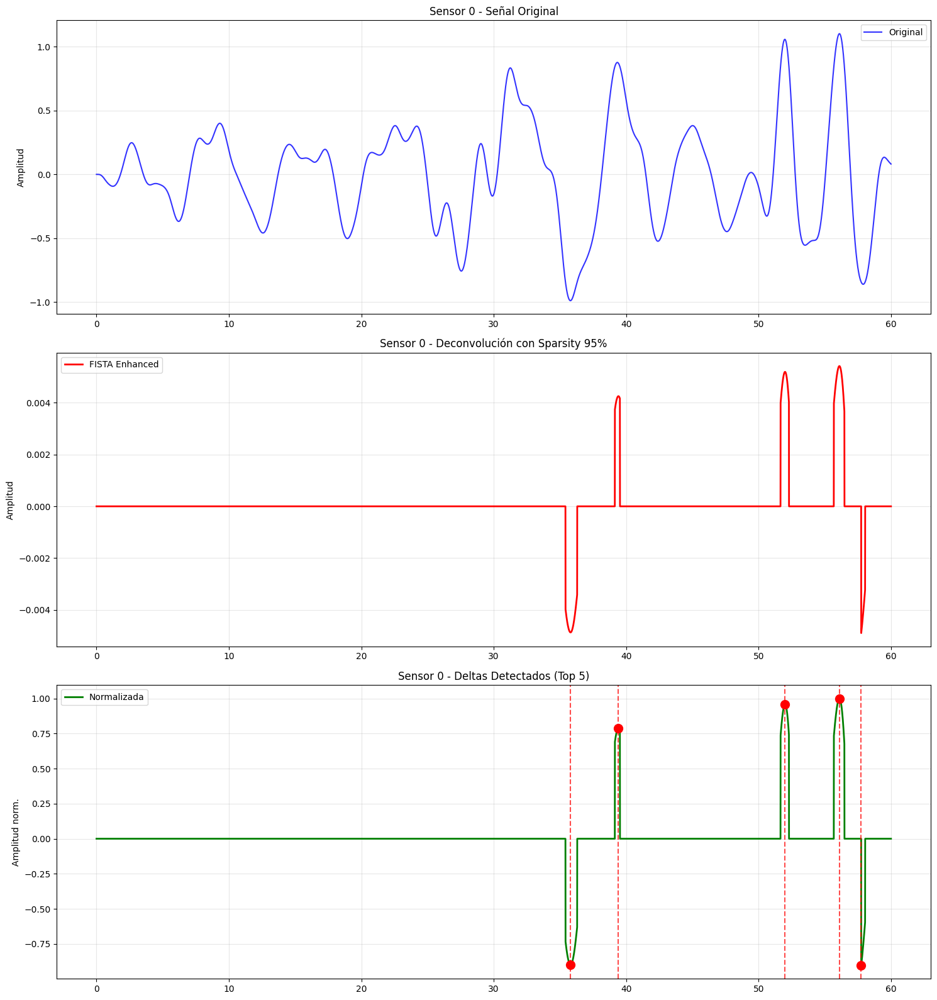

  Sensor 0: 5 deltas detectados

--- Sensor 2/75 ---

Procesando sensor 1 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 0.135 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 0.183 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 0.248 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 0.336 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 0.455 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 0.616 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 0.834 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 1.129 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 1.528 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 2.069 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 2.801 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 3.793 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 5.135 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 6.952 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 9.412 -> Sparsity: 0.013 (diff: 0.9369)
  Factor 12.743 -> Sparsity: 0.013 (diff: 0.9369)
  Fac

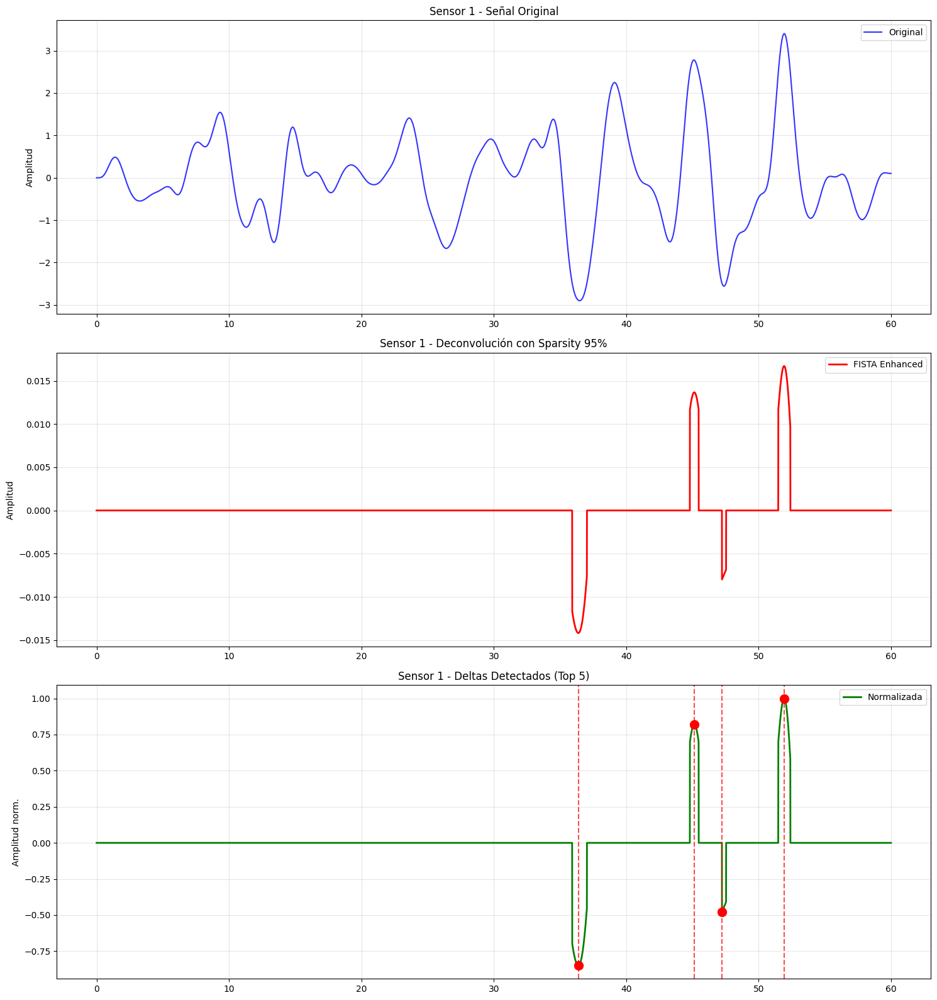

  Sensor 1: 4 deltas detectados

--- Sensor 3/75 ---

Procesando sensor 2 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.135 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.183 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.248 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.336 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.455 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.616 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.834 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 1.129 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 1.528 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 2.069 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 2.801 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 3.793 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 5.135 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 6.952 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 9.412 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 12.743 -> Sparsity: 0.017 (diff: 0.9327)
  Fac

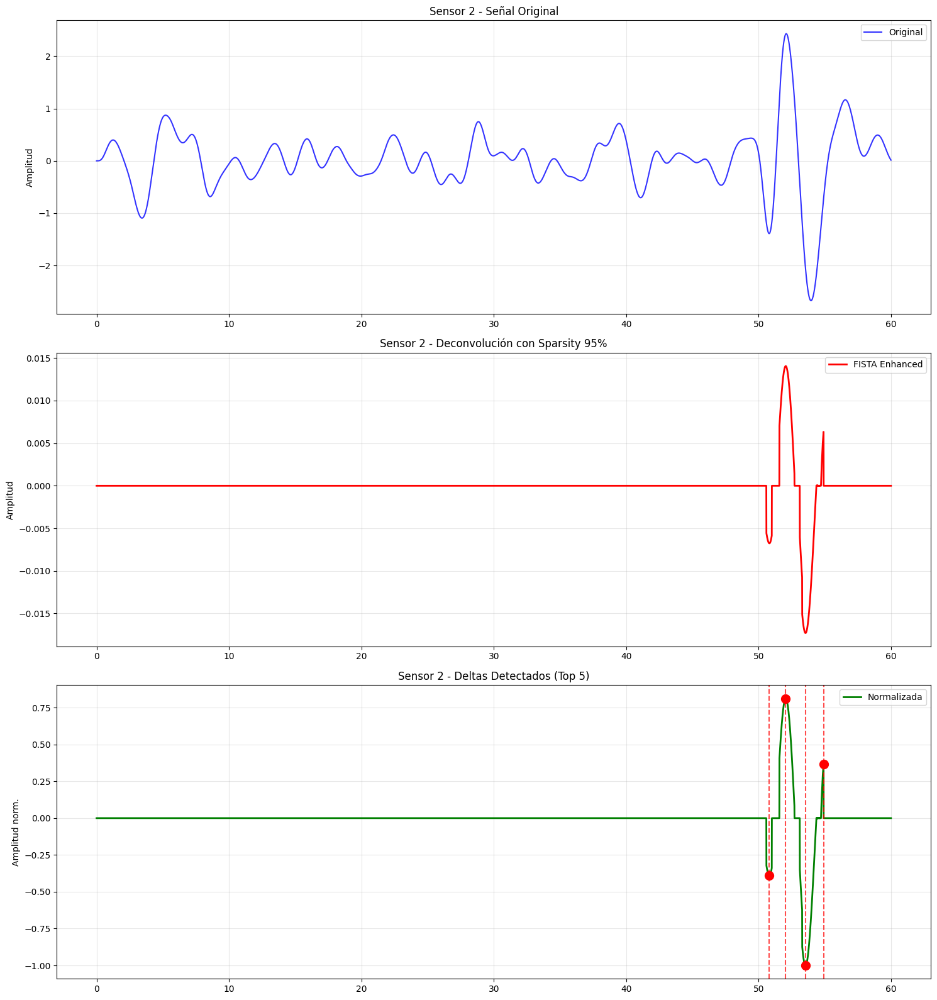

  Sensor 2: 4 deltas detectados

--- Sensor 4/75 ---

Procesando sensor 3 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 0.135 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 0.183 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 0.248 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 0.336 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 0.455 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 0.616 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 0.834 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 1.129 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 1.528 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 2.069 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 2.801 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 3.793 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 5.135 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 6.952 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 9.412 -> Sparsity: 0.009 (diff: 0.9406)
  Factor 12.743 -> Sparsity: 0.009 (diff: 0.9406)
  Fac

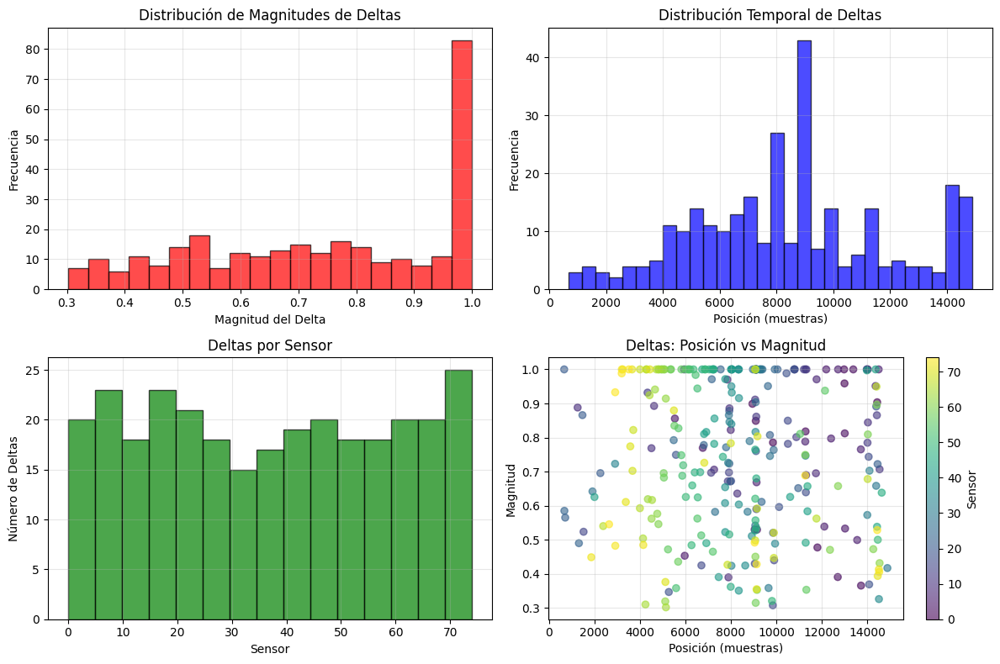


VISUALIZACIÓN DE SEÑALES CON PICOS


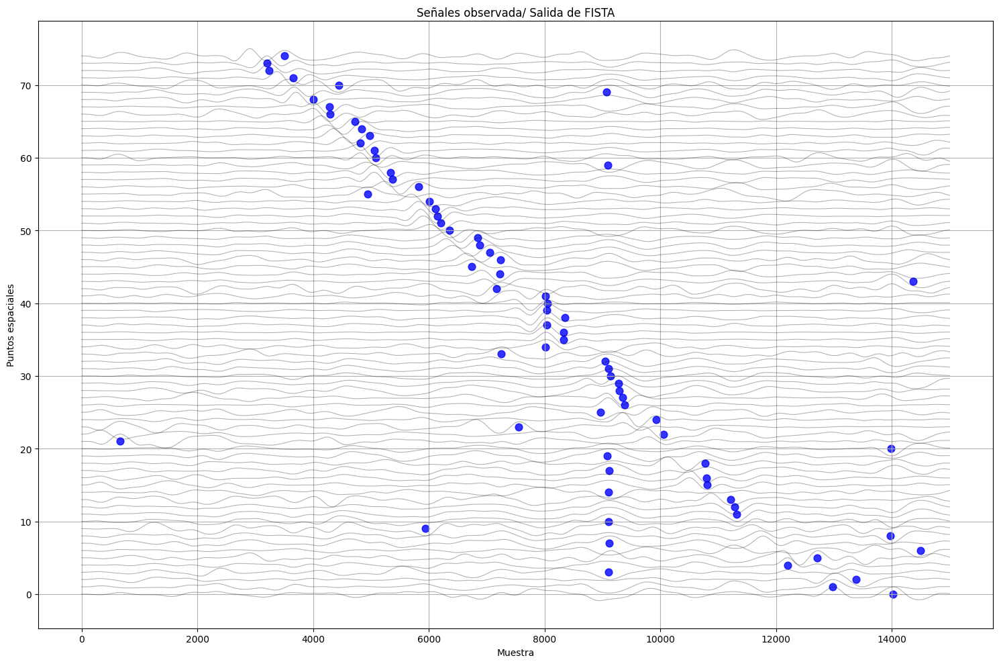

Visualización completada:
  - Sensores mostrados: 75
  - Picos mayores detectados: 75
  - Sensores con pico mayor: 75

ANÁLISIS DE PENDIENTES CON DELTAS FORZADOS
Sensor  0: Pendiente= 0.00004, Deltas:  1.000@14025 ->  0.959@12999 (4104.0ms)
Sensor  1: Pendiente= 0.00048, Deltas:  1.000@12981 -> -0.849@9096 (15540.0ms)
Sensor  2: Pendiente=-0.00485, Deltas: -1.000@13385 ->  0.812@13011 (1496.0ms)
Sensor  3: Pendiente=-0.00052, Deltas: -1.000@9107 ->  0.856@5537 (14280.0ms)
Sensor  4: Pendiente=-0.00185, Deltas:  1.000@12196 -> -0.533@13024 (3312.0ms)
Sensor  5: Pendiente= 0.00584, Deltas:  1.000@12717 -> -0.797@12409 (1232.0ms)
Sensor  6: Pendiente=-0.00055, Deltas: -1.000@14502 ->  0.788@11274 (12912.0ms)
Sensor  7: Pendiente=-0.00001, Deltas:  1.000@9118 ->  0.971@11771 (10612.0ms)
Sensor  8: Pendiente= 0.00506, Deltas: -1.000@13979 ->  0.951@14365 (1544.0ms)
Sensor  9: Pendiente= 0.00002, Deltas: -1.000@5941 -> -0.970@7849 (7632.0ms)
Sensor 10: Pendiente= 0.00161, Deltas:  1.000@9109

In [3]:
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(H.da, senal_promedio,mode ='hard')

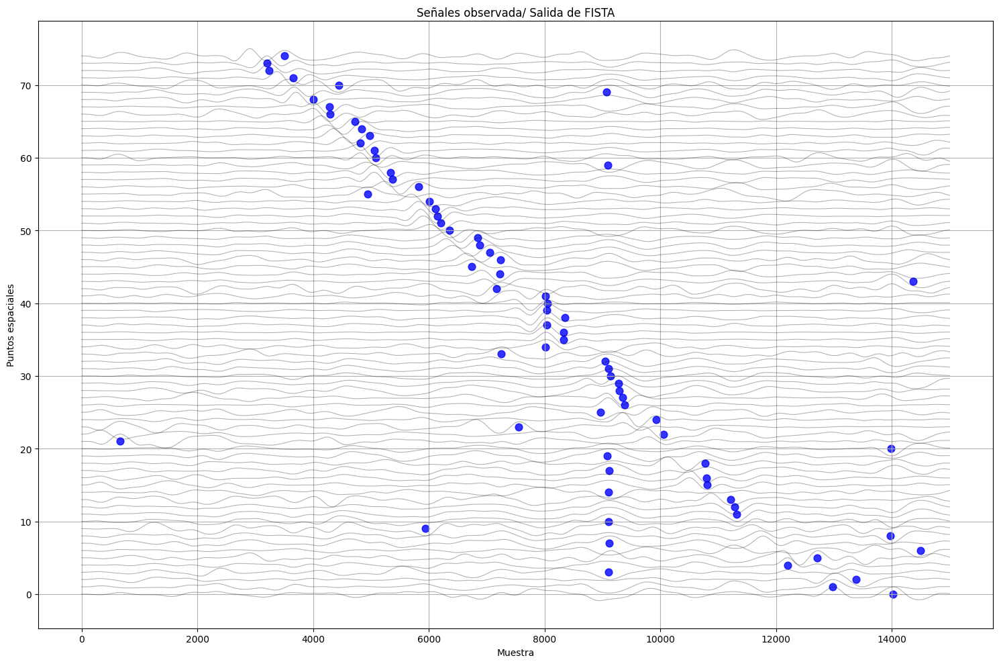

Visualización completada:
  - Sensores mostrados: 75
  - Picos mayores detectados: 75
  - Sensores con pico mayor: 75


In [4]:
visualize_signals_with_peaks(H.da, picos_matrix, num_sensores=75, fs=250)

=== PASO 1: Filtrar columnas con muchos picos ===

=== PASO 2: Aplicar DBSCAN ===
Puntos originales: 75
Puntos después de DBSCAN: 60
Outliers eliminados: 15

=== RESULTADO FINAL ===
Puntos finales: 60


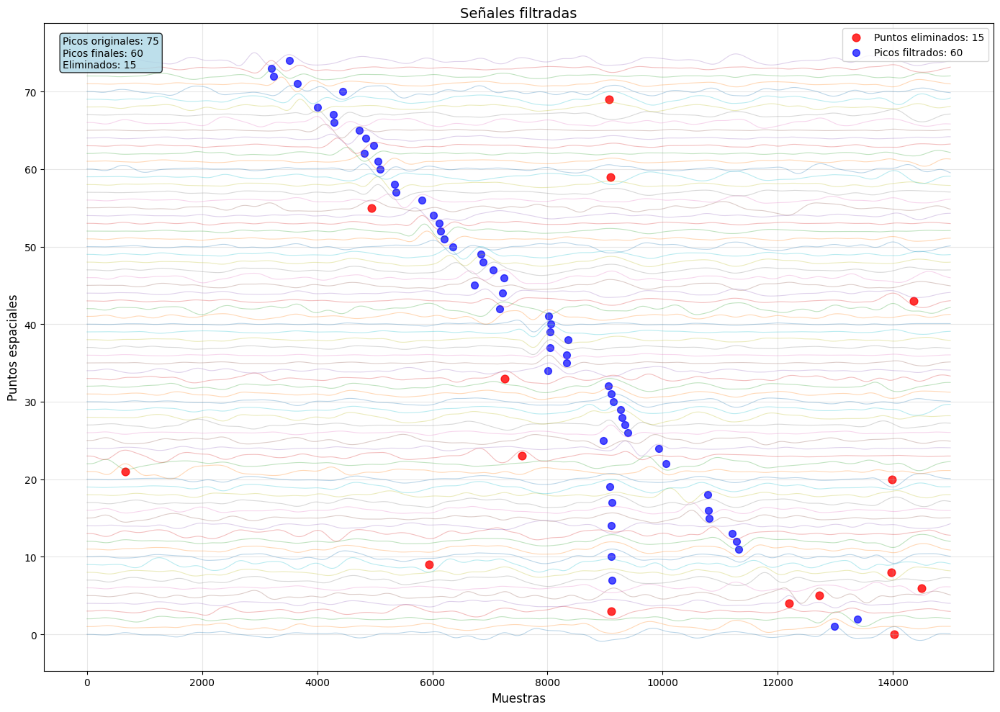

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys, np.array([]), np.array([])
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    mask_ruido = labels == -1
    
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    xs_eliminados = xs[mask_ruido]
    ys_eliminados = ys[mask_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs_eliminados)}")
    
    return xs_filtrados, ys_filtrados, xs_eliminados, ys_eliminados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados, xs_eliminados, ys_eliminados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear puntos eliminados (outliers) en rojo
if len(xs_eliminados) > 0:
    ax.scatter(xs_eliminados, ys_eliminados, 
               color='red', alpha=0.8, s=60, 
               label=f'Puntos eliminados: {len(xs_eliminados)}')

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()


=== REGRESIÓN LINEAL ===
Pendiente (m): -0.0080
Intercepto (b): 100.5553
R²: 0.9398
Ecuación: y = -0.0080x + 100.5553


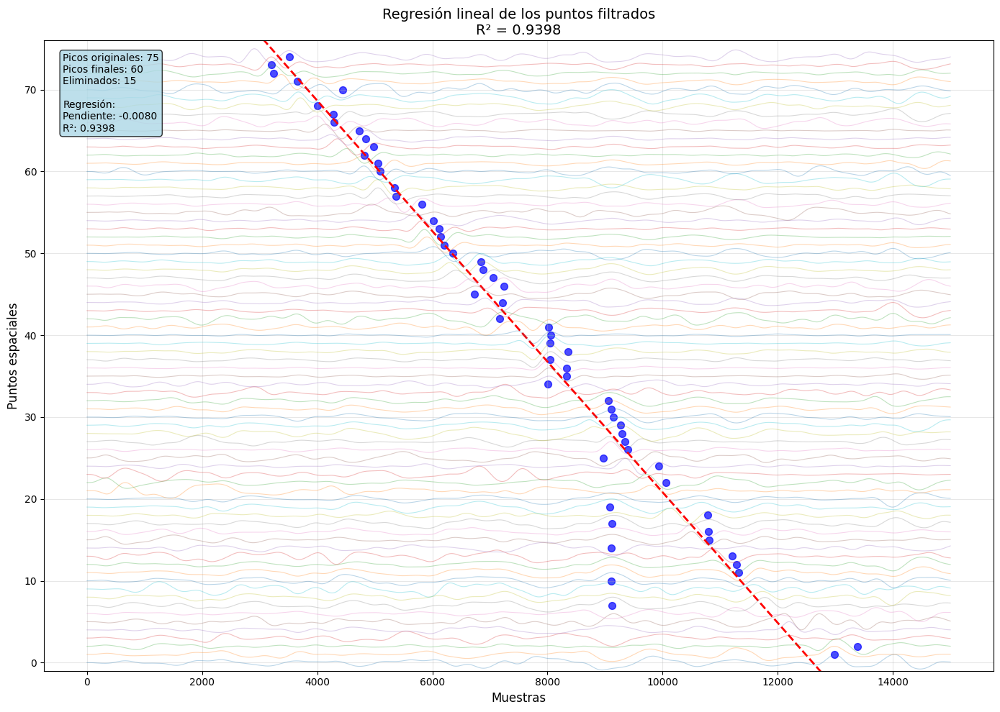

Rango de sensores: 0 a 74
Límites del gráfico: Y = -1 a 76


In [7]:
# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Calcular y plotear regresión lineal
r2 = 0  # Valor por defecto
if len(xs_filtrados) >= 2:
    # Regresión lineal manual
    n = len(xs_filtrados)
    sum_x = np.sum(xs_filtrados)
    sum_y = np.sum(ys_filtrados)
    sum_xy = np.sum(xs_filtrados * ys_filtrados)
    sum_x2 = np.sum(xs_filtrados ** 2)
    
    m = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x ** 2)
    b = (sum_y - m * sum_x) / n
    
    # Calcular R²
    y_mean = np.mean(ys_filtrados)
    ss_tot = np.sum((ys_filtrados - y_mean) ** 2)
    y_pred = m * xs_filtrados + b
    ss_res = np.sum((ys_filtrados - y_pred) ** 2)
    r2 = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    
    # Línea de regresión
    x_line = np.linspace(0, H.da.shape[1] - 1, 100)
    y_line = m * x_line + b
    
    # Ecuación de la recta
    ecuacion = f"y = {m:.4f}x {'+' if b >= 0 else '-'} {abs(b):.4f}"
    
    ax.plot(x_line, y_line, color='red', linewidth=2, linestyle='--',
            label=f'Regresión: {ecuacion}')
    
    print(f"\n=== REGRESIÓN LINEAL ===")
    print(f"Pendiente (m): {m:.4f}")
    print(f"Intercepto (b): {b:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"Ecuación: {ecuacion}")

# Plotear las señales normalizadas
num_sensores = H.da.shape[0]
for i in range(num_sensores):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title(f'Regresión lineal de los puntos filtrados\nR² = {r2:.4f}', fontsize=14)

# CORRECCIÓN: Ajustar límites del eje Y
ax.set_ylim(-1, num_sensores + 1)  # Margen inferior y superior

ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
if len(xs_filtrados) >= 2:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}\n\nRegresión:\nPendiente: {m:.4f}\nR²: {r2:.4f}'
else:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}\n\nInsuficientes puntos\npara regresión'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

# Información adicional
print(f"Rango de sensores: 0 a {num_sensores-1}")
print(f"Límites del gráfico: Y = -1 a {num_sensores + 1}")

##  Importación de librerías

In [35]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt

# Cargar los archivos .mat
# Función: cargar_archivos_mat
def cargar_archivos_mat():
    try:
        # Cargar el primer archivo
        h_data = scipy.io.loadmat('h_L4_40cm.mat')
        print("Archivo h_L4_40cm.mat cargado exitosamente")
        print(f"Claves en h_L4_40cm.mat: {list(h_data.keys())}")
        
        # Cargar el segundo archivo
        vehiculos_data = scipy.io.loadmat('vehiculos_L4.mat')
        print("\nArchivo vehiculos_L4.mat cargado exitosamente")
        print(f"Claves en vehiculos_L4.mat: {list(vehiculos_data.keys())}")
        
        return h_data, vehiculos_data
        
    except FileNotFoundError as e:
        print(f"Error: No se encontró el archivo {e}")
        return None, None
    except Exception as e:
        print(f"Error al cargar los archivos: {e}")
        return None, None

# Función para explorar el contenido de los archivos
# Función: explorar_contenido
def explorar_contenido(data, nombre_archivo):
    print(f"\n=== Explorando {nombre_archivo} ===")
    
    # Filtrar las claves que no empiecen con '__' (metadatos de MATLAB)
    claves_datos = [k for k in data.keys() if not k.startswith('__')]
    
    for clave in claves_datos:
        variable = data[clave]
        print(f"\nVariable '{clave}':")
        print(f"  Tipo: {type(variable)}")
        print(f"  Shape: {variable.shape if hasattr(variable, 'shape') else 'N/A'}")
        print(f"  Dtype: {variable.dtype if hasattr(variable, 'dtype') else 'N/A'}")
        
        # Mostrar algunos valores si es un array numérico
        if isinstance(variable, np.ndarray) and variable.size > 0:
            if variable.size <= 10:
                print(f"  Valores: {variable}")
            else:
                print(f"  Primeros valores: {variable.flat[:5]}...")
                print(f"  Últimos valores: {variable.flat[-5:]}...")

# Función para visualizar datos (ejemplo básico)
# Función: visualizar_datos
def visualizar_datos(h_data, vehiculos_data):
    # Esta función dependerá del contenido específico de tus archivos
    # Aquí tienes un ejemplo genérico
    
    plt.figure(figsize=(12, 8))
    
    # Ejemplo de visualización para h_data
    if h_data is not None:
        claves_h = [k for k in h_data.keys() if not k.startswith('__')]
        if claves_h:
            plt.subplot(2, 1, 1)
            primera_variable = h_data[claves_h[0]]
            if isinstance(primera_variable, np.ndarray):
                if primera_variable.ndim == 1:
                    plt.plot(primera_variable)
                elif primera_variable.ndim == 2:
                    plt.imshow(primera_variable, aspect='auto')
                    plt.colorbar()
            plt.title(f'Datos de h_L4_40cm.mat - {claves_h[0]}')
    
    # Ejemplo de visualización para vehiculos_data
    if vehiculos_data is not None:
        claves_v = [k for k in vehiculos_data.keys() if not k.startswith('__')]
        if claves_v:
            plt.subplot(2, 1, 2)
            primera_variable = vehiculos_data[claves_v[0]]
            if isinstance(primera_variable, np.ndarray):
                if primera_variable.ndim == 1:
                    plt.plot(primera_variable)
                elif primera_variable.ndim == 2:
                    plt.imshow(primera_variable, aspect='auto')
                    plt.colorbar()
            plt.title(f'Datos de vehiculos_L4.mat - {claves_v[0]}')
    
    plt.tight_layout()
    plt.show()

# Ejecutar el código principal
if __name__ == "__main__":
    # Cargar los archivos
    h_data, vehiculos_data = cargar_archivos_mat()
    
    if h_data is not None:
        explorar_contenido(h_data, "h_L4_40cm.mat")
    
    if vehiculos_data is not None:
        explorar_contenido(vehiculos_data, "vehiculos_L4.mat")
    
    # Visualizar los datos (opcional)
    # visualizar_datos(h_data, vehiculos_data)
    
    # Ejemplo de cómo acceder a variables específicas:
    # if h_data is not None:
    # # Reemplaza 'nombre_variable' con el nombre real de tu variable
    # # variable_h = h_data['nombre_variable']
    # pass
    
    # if vehiculos_data is not None:
    # # variable_vehiculos = vehiculos_data['nombre_variable']
    # pass

Archivo h_L4_40cm.mat cargado exitosamente
Claves en h_L4_40cm.mat: ['__header__', '__version__', '__globals__', 'x']

Archivo vehiculos_L4.mat cargado exitosamente
Claves en vehiculos_L4.mat: ['__header__', '__version__', '__globals__', 'vehiculos_L4']

=== Explorando h_L4_40cm.mat ===

Variable 'x':
  Tipo: <class 'numpy.ndarray'>
  Shape: (1, 10000)
  Dtype: float64
  Primeros valores: [ 0.77800602  2.78749323  0.62176812 -0.60199445  0.26790106]...
  Últimos valores: [-2.22142982 -0.91085643 -1.13734519 -0.1192123  -0.30984995]...

=== Explorando vehiculos_L4.mat ===

Variable 'vehiculos_L4':
  Tipo: <class 'numpy.ndarray'>
  Shape: (3, 4000)
  Dtype: float64
  Primeros valores: [-0.27084103  0.24893494  0.66564971  1.53182149  0.16287024]...
  Últimos valores: [-0.69992745  1.31176794  0.54884589 -0.10074045 -1.33009601]...


=== PASO 1: Filtrar columnas con muchos picos ===

=== PASO 2: Aplicar DBSCAN ===
Puntos originales: 75
Puntos después de DBSCAN: 54
Outliers eliminados: 21

=== RESULTADO FINAL ===
Puntos finales: 54


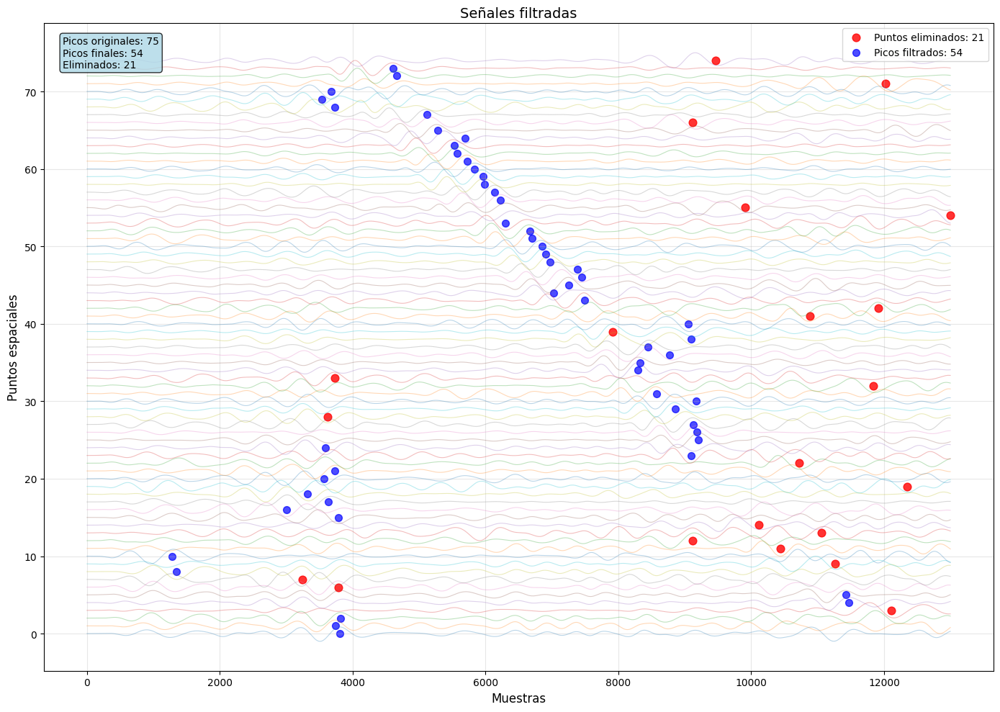

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys, np.array([]), np.array([])
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    mask_ruido = labels == -1
    
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    xs_eliminados = xs[mask_ruido]
    ys_eliminados = ys[mask_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs_eliminados)}")
    
    return xs_filtrados, ys_filtrados, xs_eliminados, ys_eliminados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados, xs_eliminados, ys_eliminados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear puntos eliminados (outliers) en rojo
if len(xs_eliminados) > 0:
    ax.scatter(xs_eliminados, ys_eliminados, 
               color='red', alpha=0.8, s=60, 
               label=f'Puntos eliminados: {len(xs_eliminados)}')

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs) - len(xs_filtrados)}")
    
    return xs_filtrados, ys_filtrados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

##  Bucles y estructuras de control


=== REGRESIÓN LINEAL ===
Pendiente (m): -0.0080
Intercepto (b): 100.5553
R²: 0.9398
Ecuación: y = -0.0080x + 100.5553


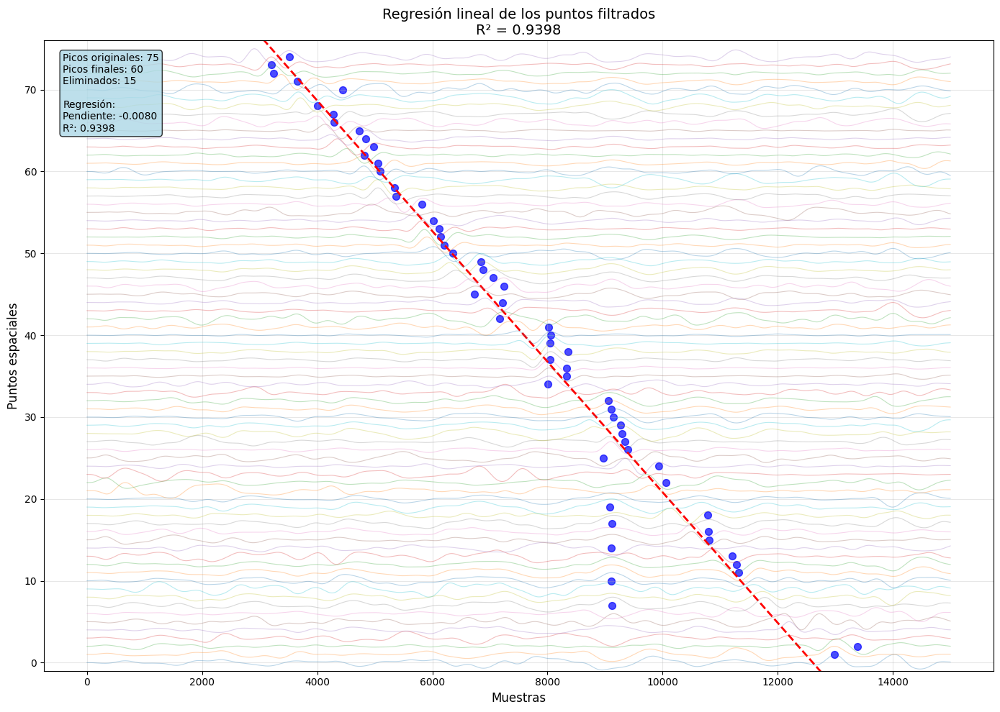

Rango de sensores: 0 a 74
Límites del gráfico: Y = -1 a 76


In [8]:
# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Calcular y plotear regresión lineal
r2 = 0  # Valor por defecto
if len(xs_filtrados) >= 2:
    # Regresión lineal manual
    n = len(xs_filtrados)
    sum_x = np.sum(xs_filtrados)
    sum_y = np.sum(ys_filtrados)
    sum_xy = np.sum(xs_filtrados * ys_filtrados)
    sum_x2 = np.sum(xs_filtrados ** 2)
    
    m = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x ** 2)
    b = (sum_y - m * sum_x) / n
    
    # Calcular R²
    y_mean = np.mean(ys_filtrados)
    ss_tot = np.sum((ys_filtrados - y_mean) ** 2)
    y_pred = m * xs_filtrados + b
    ss_res = np.sum((ys_filtrados - y_pred) ** 2)
    r2 = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    
    # Línea de regresión
    x_line = np.linspace(0, H.da.shape[1] - 1, 100)
    y_line = m * x_line + b
    
    # Ecuación de la recta
    ecuacion = f"y = {m:.4f}x {'+' if b >= 0 else '-'} {abs(b):.4f}"
    
    ax.plot(x_line, y_line, color='red', linewidth=2, linestyle='--',
            label=f'Regresión: {ecuacion}')
    
    print(f"\n=== REGRESIÓN LINEAL ===")
    print(f"Pendiente (m): {m:.4f}")
    print(f"Intercepto (b): {b:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"Ecuación: {ecuacion}")

# Plotear las señales normalizadas
num_sensores = H.da.shape[0]
for i in range(num_sensores):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title(f'Regresión lineal de los puntos filtrados\nR² = {r2:.4f}', fontsize=14)

# CORRECCIÓN: Ajustar límites del eje Y
ax.set_ylim(-1, num_sensores + 1)  # Margen inferior y superior

ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
if len(xs_filtrados) >= 2:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}\n\nRegresión:\nPendiente: {m:.4f}\nR²: {r2:.4f}'
else:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}\n\nInsuficientes puntos\npara regresión'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

# Información adicional
print(f"Rango de sensores: 0 a {num_sensores-1}")
print(f"Límites del gráfico: Y = -1 a {num_sensores + 1}")

##  Importación de librerías

In [9]:
from scipy.io import loadmat
import numpy as np
from scipy.signal import butter, sosfilt

# Función: remove_trend
def remove_trend(data, verbose=False):
    if verbose:
        print("Remove trend")
    nsamp = data.shape[1]
    xx = np.arange(nsamp)
    for i in range(data.shape[0]):
        dr = data[i, :]
        try:
            po = np.polyfit(xx, dr, 1)
        except:
            print("Error in polyfit on trace", i)
            exit(1)
        mo = np.polyval(po, xx)
        data[i, :] = dr - mo
    return data

# Función: remove_coherent_noise
def remove_coherent_noise(data, method='median', verbose=False):
    if verbose:
        print("Remove coherent noise")

    md = np.median(data, axis=0)

    if method == 'simple':
        for i in range(data.shape[0]):
            data[i, :] -= md
    elif method == 'fit':
        den = np.sum(md * md)
        for i in range(data.shape[0]):
            dd = data[i, :]
            am = np.sum(dd * md) / den
            data[i, :] = dd - am * md
    return data

# Función: bandpass_filter
def bandpass_filter(data, dt, f1, f2, verbose=False):
    if verbose:
        print("Filter")

    sos = butter(4, [f1, f2], btype='bandpass', fs=1. / dt, output='sos')

    for i in range(data.shape[0]):
        data[i, :] = sosfilt(sos, data[i, :])
        if verbose:
            print(f"Paso por aquí {i+1} de {data.shape[0]}")
    return data

# Cargar archivo .mat
data1 = loadmat('coche_completo_1.mat')

# Ver las claves del diccionario
print(data1.keys())

# # Acceder a una variable específica
# mi_variable = data['nombre_variable']
# Imprimir(mi_variable)
coche_completo_1 = data1['coche_completo_1']

dict_keys(['__header__', '__version__', '__globals__', 'coche_completo_1'])


##  Asignaciones y ejemplos

In [10]:
data1 = loadmat('ibiza_f1_v1.mat')
coche_completo_1 = data1["ibiza_f1_v1"]
data1 = loadmat('ibiza_f1_v2.mat')
coche_completo_2 = data1["ibiza_f1_v2"]
data1 = loadmat('ibiza_f1_v3.mat')
coche_completo_3 = data1["ibiza_f1_v3"]

##  Importación de librerías

In [11]:
from scipy.io import loadmat
import numpy as np
from scipy.signal import butter, sosfilt, sosfiltfilt

# Función: remove_trend
def remove_trend(data, method='linear', verbose=False):
    """
    Remove trend from 2D seismic data.
    
    Parameters:
    -----------
    data : np.ndarray
        2D array with shape (n_traces, n_samples)
    method : str
        'linear' for linear detrending, 'mean' for mean removal
    verbose : bool
        Print progress information
    
    Returns:
    --------
    np.ndarray
        Detrended data
    """
    if verbose:
        print("Remove trend")
    
    data_detrended = data.copy()
    nsamp = data.shape[1]
    
    if method == 'linear':
        xx = np.arange(nsamp)
        for i in range(data.shape[0]):
            dr = data[i, :]
            try:
                po = np.polyfit(xx, dr, 1)
                mo = np.polyval(po, xx)
                data_detrended[i, :] = dr - mo
            except np.linalg.LinAlgError:
                if verbose:
                    print(f"Warning: Linear trend removal failed for trace {i}, using mean removal instead")
                data_detrended[i, :] = dr - np.mean(dr)
            except Exception as e:
                print(f"Error in polyfit on trace {i}: {e}")
                return None
                
    elif method == 'mean':
        for i in range(data.shape[0]):
            data_detrended[i, :] = data[i, :] - np.mean(data[i, :])
    
    return data_detrended

# Función: remove_coherent_noise
def remove_coherent_noise(data, method='median', percentile=50, verbose=False):
    """
    Remove coherent noise from 2D seismic data.
    
    Parameters:
    -----------
    data : np.ndarray
        2D array with shape (n_traces, n_samples)
    method : str
        'median', 'mean', 'simple', 'fit', or 'percentile'
    percentile : float
        Percentile to use if method='percentile' (0-100)
    verbose : bool
        Print progress information
    
    Returns:
    --------
    np.ndarray
        Data with coherent noise removed
    """
    if verbose:
        print(f"Remove coherent noise using {method} method")
    
    data_clean = data.copy()
    
    if method == 'median':
        noise_model = np.median(data, axis=0)
    elif method == 'mean':
        noise_model = np.mean(data, axis=0)
    elif method == 'percentile':
        noise_model = np.percentile(data, percentile, axis=0)
    else:
        noise_model = np.median(data, axis=0)  # default
    
    if method in ['simple', 'median', 'mean', 'percentile']:
        # Simple subtraction
        for i in range(data.shape[0]):
            data_clean[i, :] -= noise_model
            
    elif method == 'fit':
        # Adaptive fitting method
        den = np.sum(noise_model * noise_model)
        if den > 0:  # Avoid division by zero
            for i in range(data.shape[0]):
                dd = data[i, :]
                am = np.sum(dd * noise_model) / den
                data_clean[i, :] = dd - am * noise_model
        else:
            if verbose:
                print("Warning: Zero denominator in fit method, using simple subtraction")
            for i in range(data.shape[0]):
                data_clean[i, :] -= noise_model
    
    return data_clean

# Función: bandpass_filter
def bandpass_filter(data, dt, f1, f2, order=4, method='sosfilt', verbose=False):
    """
    Apply bandpass filter to 2D seismic data.
    
    Parameters:
    -----------
    data : np.ndarray
        2D array with shape (n_traces, n_samples)
    dt : float
        Sampling interval in seconds
    f1 : float
        Low frequency cutoff in Hz
    f2 : float
        High frequency cutoff in Hz
    order : int
        Filter order (default: 4)
    method : str
        'sosfilt' for forward filtering or 'sosfiltfilt' for zero-phase filtering
    verbose : bool
        Print progress information
    
    Returns:
    --------
    np.ndarray
        Filtered data
    """
    if verbose:
        print(f"Apply bandpass filter: {f1}-{f2} Hz")
    
    # Validate frequency parameters
    nyquist = 1.0 / (2.0 * dt)
    if f2 >= nyquist:
        print(f"Warning: High frequency cutoff ({f2} Hz) is above Nyquist frequency ({nyquist:.2f} Hz)")
        f2 = nyquist * 0.9  # Set to 90% of Nyquist
        if verbose:
            print(f"Adjusted high frequency cutoff to {f2:.2f} Hz")
    
    if f1 >= f2:
        print("Error: Low frequency cutoff must be less than high frequency cutoff")
        return None
    
    try:
        # Create filter coefficients
        sos = butter(order, [f1, f2], btype='bandpass', fs=1.0/dt, output='sos')
        
        data_filtered = data.copy()
        
        # Apply filter to each trace
        for i in range(data.shape[0]):
            if method == 'sosfiltfilt':
                # Zero-phase filtering (no phase distortion)
                data_filtered[i, :] = sosfiltfilt(sos, data[i, :])
            else:
                # Forward filtering (faster but with phase shift)
                data_filtered[i, :] = sosfilt(sos, data[i, :])
            
            if verbose and (i + 1) % max(1, data.shape[0] // 10) == 0:
                print(f"Filtered trace {i+1} of {data.shape[0]}")
        
        return data_filtered
        
    except Exception as e:
        print(f"Error in bandpass filtering: {e}")
        return None

# Función: process_seismic_2d
def process_seismic_2d(data, dt, processing_sequence=None, verbose=False):
    """
    Complete 2D seismic data processing workflow.
    
    Parameters:
    -----------
    data : np.ndarray
        2D array with shape (n_traces, n_samples)
    dt : float
        Sampling interval in seconds
    processing_sequence : list
        List of processing steps as dictionaries with 'function' and 'params' keys
    verbose : bool
        Print progress information
    
    Returns:
    --------
    np.ndarray
        Processed data
    """
    if processing_sequence is None:
        # Default processing sequence
        processing_sequence = [
            {'function': 'remove_trend', 'params': {'method': 'linear'}},
            {'function': 'bandpass_filter', 'params': {'f1': 5, 'f2': 100}},
            {'function': 'remove_coherent_noise', 'params': {'method': 'median'}}
        ]
    
    processed_data = data.copy()
    
    if verbose:
        print(f"Starting processing of {data.shape[0]} traces with {data.shape[1]} samples each")
        print(f"Sampling interval: {dt} s, Nyquist frequency: {1.0/(2*dt):.2f} Hz")
    
    for i, step in enumerate(processing_sequence):
        if verbose:
            print(f"\nStep {i+1}: {step['function']}")
        
        if step['function'] == 'remove_trend':
            processed_data = remove_trend(processed_data, verbose=verbose, **step['params'])
        elif step['function'] == 'remove_coherent_noise':
            processed_data = remove_coherent_noise(processed_data, verbose=verbose, **step['params'])
        elif step['function'] == 'bandpass_filter':
            processed_data = bandpass_filter(processed_data, dt, verbose=verbose, **step['params'])
        
        if processed_data is None:
            print(f"Error in processing step: {step['function']}")
            return None
    
    if verbose:
        print("\nProcessing completed successfully")
    
    return processed_data

# Ejemplo usage and testing function
# Función: example_usage
def example_usage():
    """
    Example of how to use the 2D seismic processing functions.
    """
    # Create synthetic 2D seismic data
    n_traces = 50
    n_samples = 1000
    dt = 0.001  # 1 ms sampling
    
    # Generate synthetic data with noise
    t = np.arange(n_samples) * dt
    data = np.zeros((n_traces, n_samples))
    
    for i in range(n_traces):
        # Sumar some synthetic seismic events
        signal = np.sin(2 * np.pi * 25 * t) * np.exp(-t * 2)  # Decaying sinusoid
        signal += 0.5 * np.sin(2 * np.pi * 50 * t) * np.exp(-t * 5)  # Higher frequency
        
        # Sumar trend
        trend = 0.1 * t + 0.05 * i
        
        # Sumar random noise
        noise = np.random.normal(0, 0.1, n_samples)
        
        data[i, :] = signal + trend + noise
    
    # Sumar coherent noise
    coherent_noise = 0.2 * np.sin(2 * np.pi * 10 * t)
    data += coherent_noise
    
    print("Generated synthetic 2D seismic data")
    print(f"Data shape: {data.shape}")
    
    # Process the data
    processed_data = process_seismic_2d(
        data, dt,
        processing_sequence=[
            {'function': 'remove_trend', 'params': {'method': 'linear'}},
            {'function': 'bandpass_filter', 'params': {'f1': 10, 'f2': 100, 'method': 'sosfiltfilt'}},
            {'function': 'remove_coherent_noise', 'params': {'method': 'median'}}
        ],
        verbose=True
    )
    
    return data, processed_data

if __name__ == "__main__":
    # Run Ejemplo
    original_data, processed_data = example_usage()

Generated synthetic 2D seismic data
Data shape: (50, 1000)
Starting processing of 50 traces with 1000 samples each
Sampling interval: 0.001 s, Nyquist frequency: 500.00 Hz

Step 1: remove_trend
Remove trend

Step 2: bandpass_filter
Apply bandpass filter: 10-100 Hz
Filtered trace 5 of 50
Filtered trace 10 of 50
Filtered trace 15 of 50
Filtered trace 20 of 50
Filtered trace 25 of 50
Filtered trace 30 of 50
Filtered trace 35 of 50
Filtered trace 40 of 50
Filtered trace 45 of 50
Filtered trace 50 of 50

Step 3: remove_coherent_noise
Remove coherent noise using median method

Processing completed successfully


##  Asignaciones y ejemplos

In [12]:
# Procesamiento completo
data = coche_completo_1.copy()
data = remove_trend(data, verbose=True)
data = remove_coherent_noise(data, method='fit', verbose=True)
data = bandpass_filter(data, dt=0.004, f1=0.1, f2=0.5, verbose=True)

Remove trend
Remove coherent noise using fit method
Apply bandpass filter: 0.1-0.5 Hz
Filtered trace 7 of 75
Filtered trace 14 of 75
Filtered trace 21 of 75
Filtered trace 28 of 75
Filtered trace 35 of 75
Filtered trace 42 of 75
Filtered trace 49 of 75
Filtered trace 56 of 75
Filtered trace 63 of 75
Filtered trace 70 of 75


Aplicando FISTA con sparsity mejorada a matriz 75x13000
Usando sparsity extrema para forzar máximos deltas...
Procesando 75 sensores con sparsity objetivo: 95.0%
Esto forzará señales muy sparse con deltas pronunciados

--- Sensor 1/75 ---

Procesando sensor 0 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 0.135 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 0.183 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 0.248 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 0.336 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 0.455 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 0.616 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 0.834 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 1.129 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 1.528 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 2.069 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 2.801 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 3.793 -> Sparsity: 0.018 (diff: 0.9319)
  Factor 5.135 -

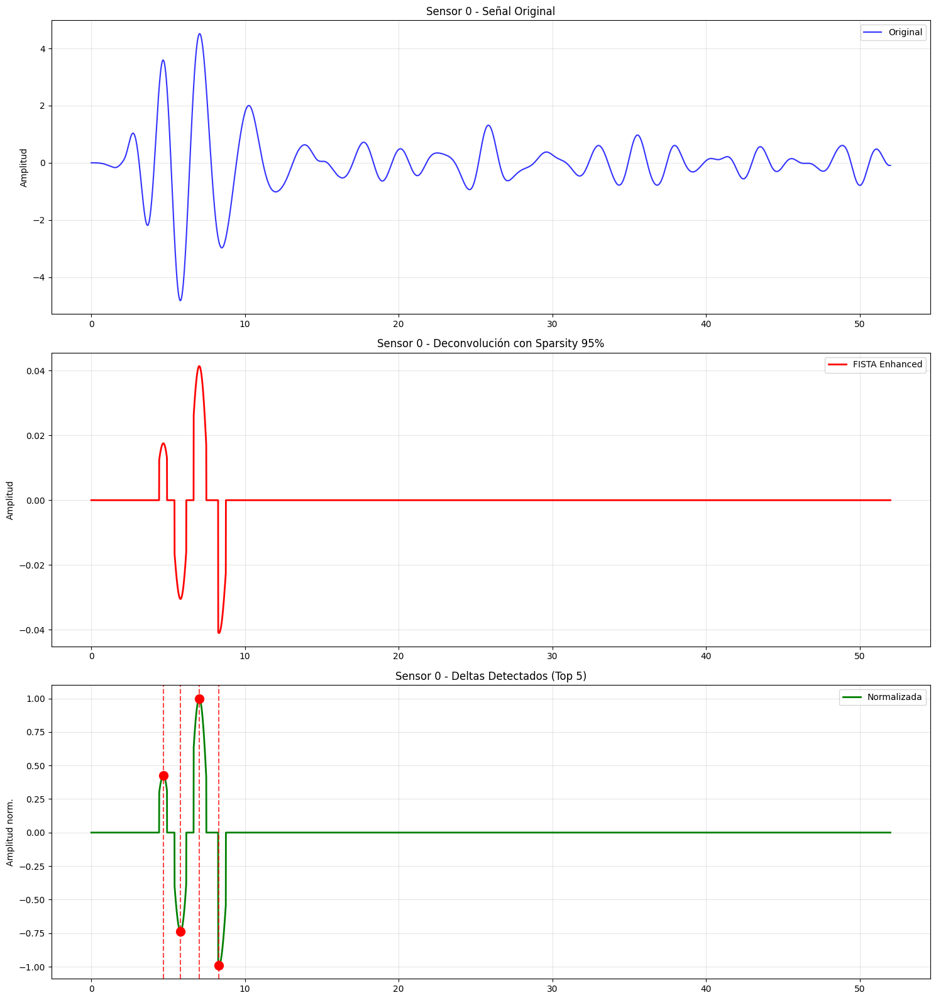

  Sensor 0: 4 deltas detectados

--- Sensor 2/75 ---

Procesando sensor 1 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 0.135 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 0.183 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 0.248 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 0.336 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 0.455 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 0.616 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 0.834 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 1.129 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 1.528 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 2.069 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 2.801 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 3.793 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 5.135 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 6.952 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 9.412 -> Sparsity: 0.025 (diff: 0.9245)
  Factor 12.743 -> Sparsity: 0.025 (diff: 0.9245)
  Fac

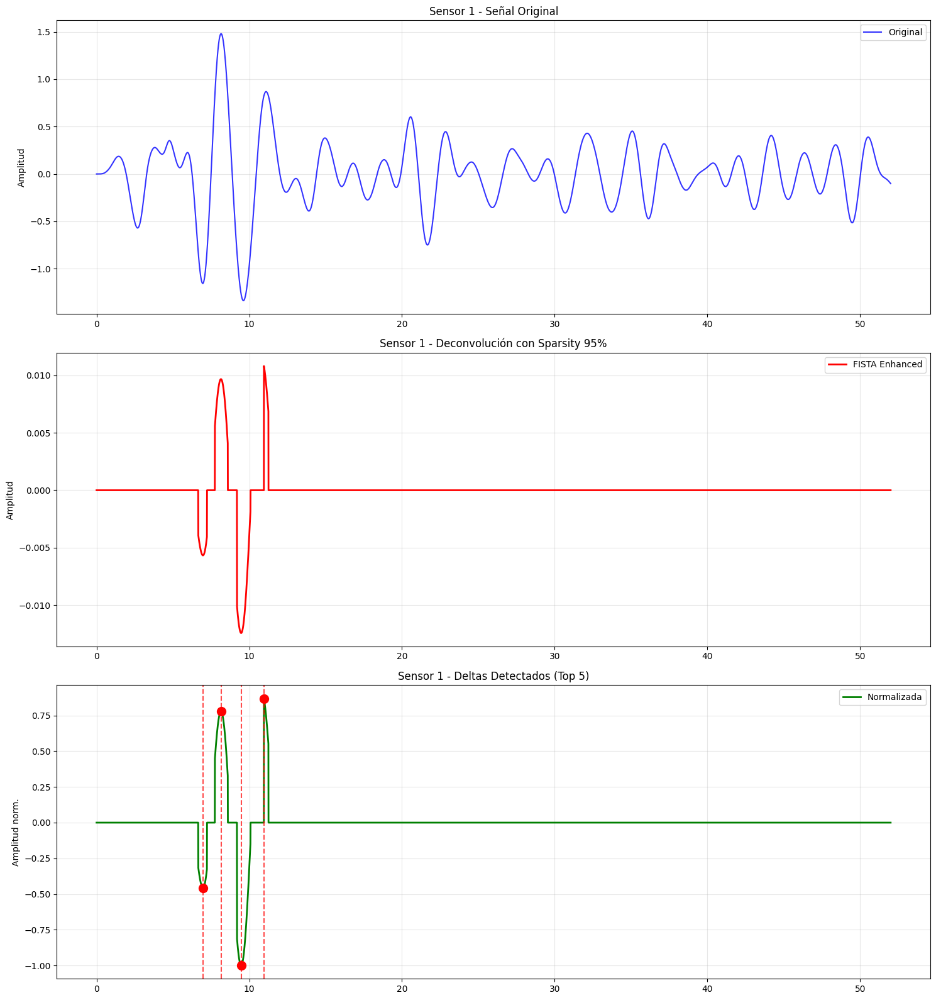

  Sensor 1: 4 deltas detectados

--- Sensor 3/75 ---

Procesando sensor 2 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 0.135 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 0.183 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 0.248 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 0.336 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 0.455 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 0.616 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 0.834 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 1.129 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 1.528 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 2.069 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 2.801 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 3.793 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 5.135 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 6.952 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 9.412 -> Sparsity: 0.031 (diff: 0.9193)
  Factor 12.743 -> Sparsity: 0.031 (diff: 0.9193)
  Fac

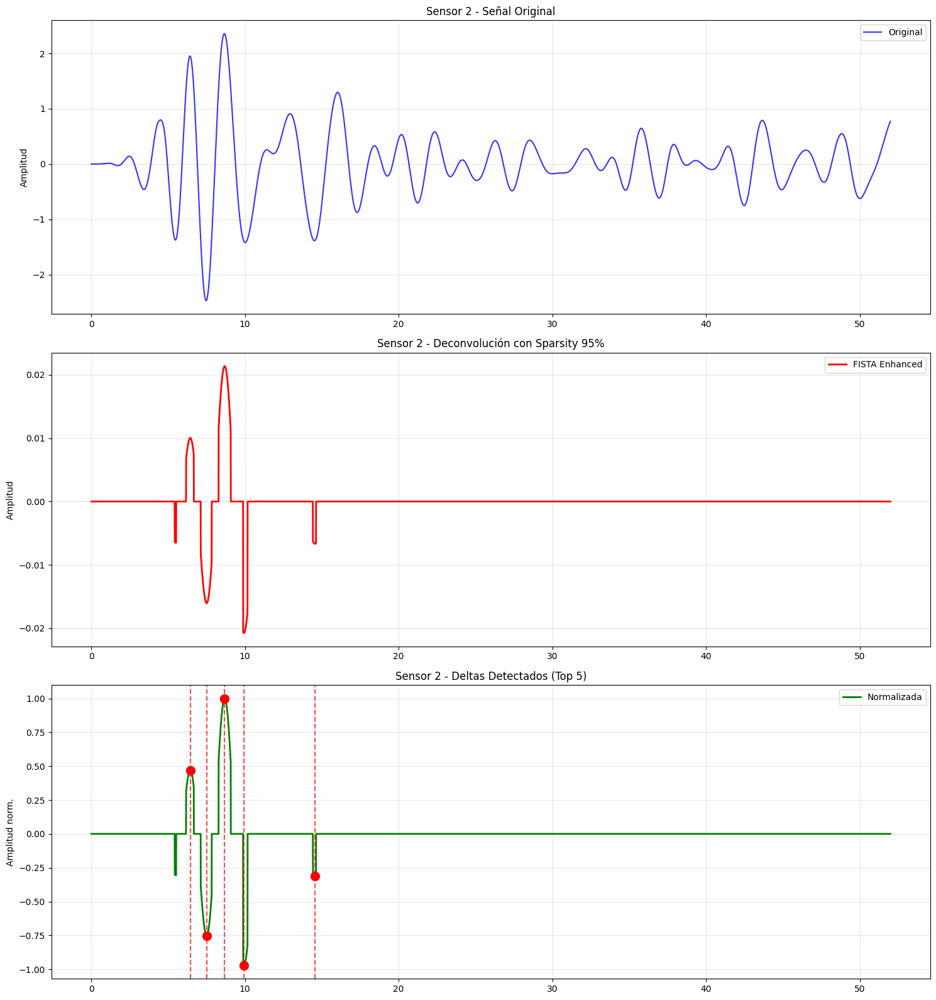

  Sensor 2: 6 deltas detectados

--- Sensor 4/75 ---

Procesando sensor 3 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 0.135 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 0.183 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 0.248 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 0.336 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 0.455 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 0.616 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 0.834 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 1.129 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 1.528 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 2.069 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 2.801 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 3.793 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 5.135 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 6.952 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 9.412 -> Sparsity: 0.013 (diff: 0.9375)
  Factor 12.743 -> Sparsity: 0.013 (diff: 0.9375)
  Fac

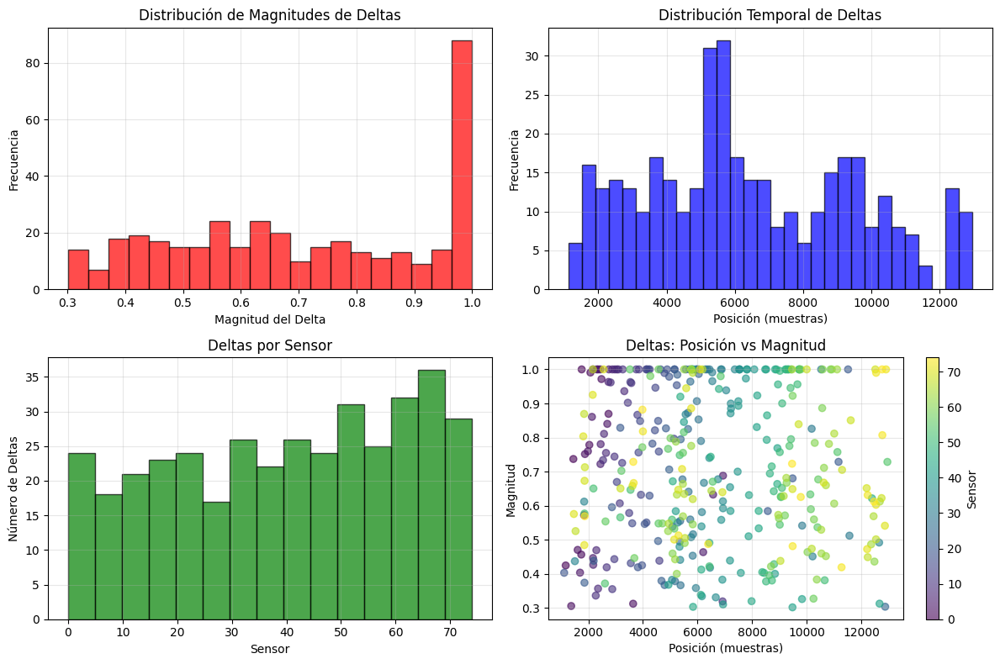


VISUALIZACIÓN DE SEÑALES CON PICOS


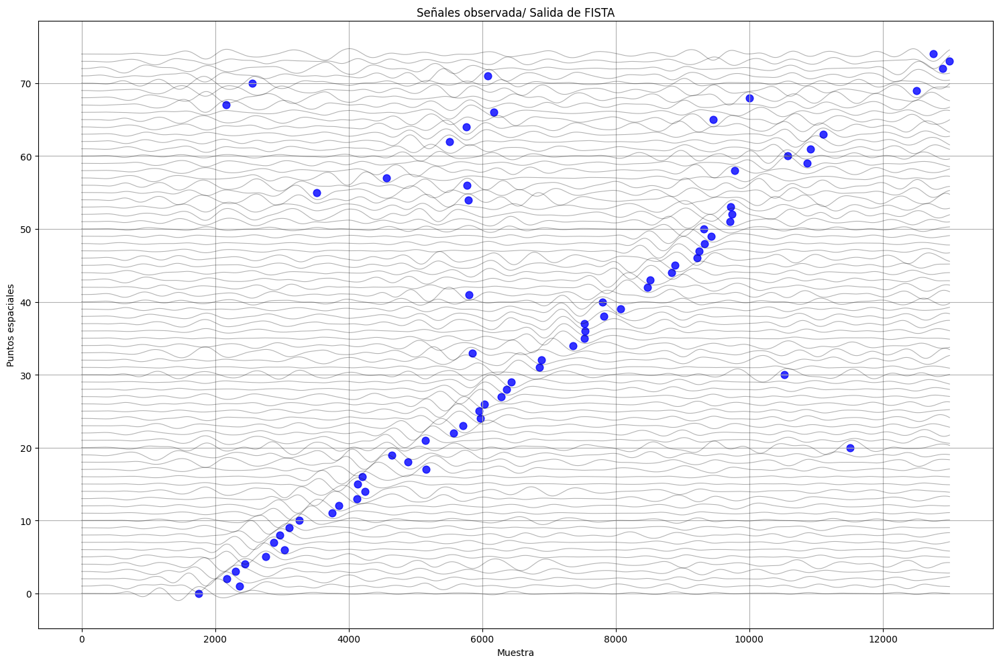

Visualización completada:
  - Sensores mostrados: 75
  - Picos mayores detectados: 75
  - Sensores con pico mayor: 75

ANÁLISIS DE PENDIENTES CON DELTAS FORZADOS
Sensor  0: Pendiente=-0.00620, Deltas:  1.000@1756 -> -0.991@2077 (1284.0ms)
Sensor  1: Pendiente= 0.00501, Deltas: -1.000@2367 ->  0.869@2740 (1492.0ms)
Sensor  2: Pendiente=-0.00634, Deltas:  1.000@2170 -> -0.972@2481 (1244.0ms)
Sensor  3: Pendiente=-0.00473, Deltas:  1.000@2305 -> -0.840@2694 (1556.0ms)
Sensor  4: Pendiente= 0.00596, Deltas:  1.000@2445 -> -0.861@2133 (1248.0ms)
Sensor  5: Pendiente= 0.00590, Deltas:  1.000@2754 -> -0.781@2452 (1208.0ms)
Sensor  6: Pendiente=-0.00644, Deltas: -1.000@3043 ->  0.963@2738 (1220.0ms)
Sensor  7: Pendiente= 0.00602, Deltas:  1.000@2877 -> -0.811@2576 (1204.0ms)
Sensor  8: Pendiente=-0.00550, Deltas:  1.000@2966 -> -0.936@3318 (1408.0ms)
Sensor  9: Pendiente= 0.00681, Deltas:  1.000@3105 -> -0.962@2817 (1152.0ms)
Sensor 10: Pendiente=-0.00624, Deltas:  1.000@3261 -> -0.960@3575 (1

In [13]:
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(data, senal_promedio,mode ='hard')

In [ ]:
data = np.flipud(data)

picos_matrix = np.flipud(picos_matrix)

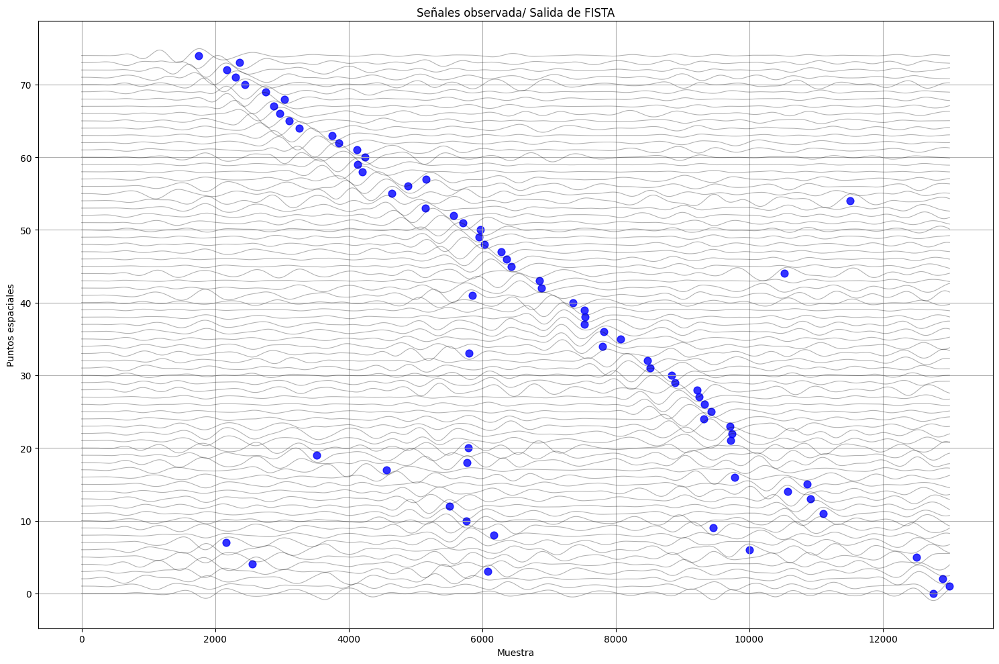

Visualización completada:
  - Sensores mostrados: 75
  - Picos mayores detectados: 75
  - Sensores con pico mayor: 75


In [15]:
visualize_signals_with_peaks(data, picos_matrix, num_sensores=75, fs=250)

##  Importación de librerías

=== PASO 1: Filtrar columnas con muchos picos ===

=== PASO 2: Aplicar DBSCAN ===
Puntos originales: 75
Puntos después de DBSCAN: 59
Outliers eliminados: 16

=== RESULTADO FINAL ===
Puntos finales: 59


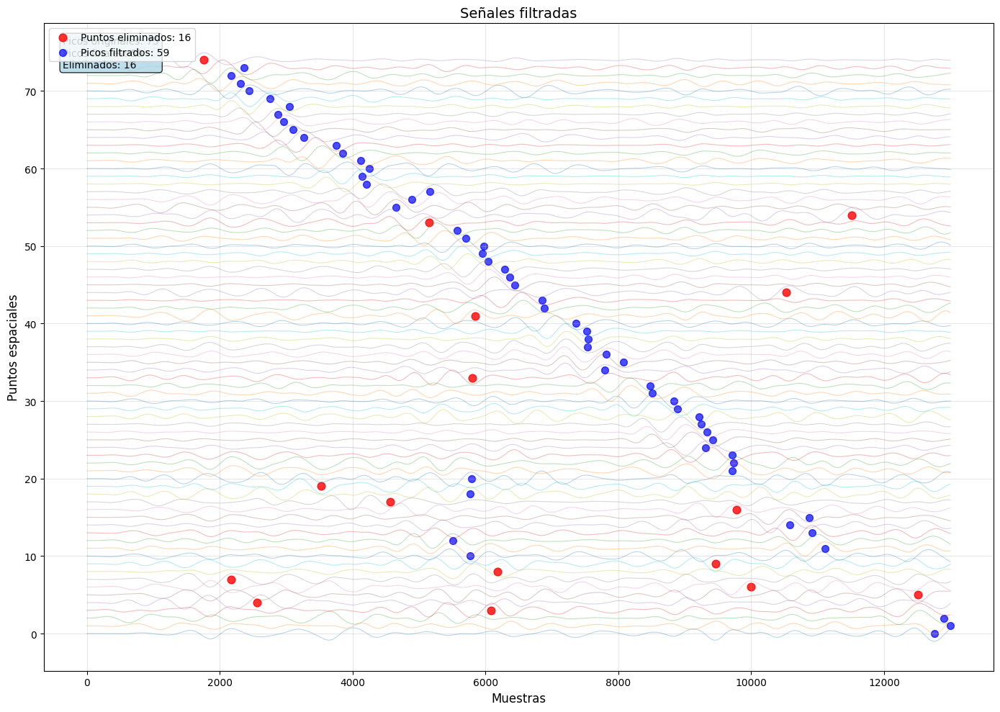

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys, np.array([]), np.array([])
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    mask_ruido = labels == -1
    
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    xs_eliminados = xs[mask_ruido]
    ys_eliminados = ys[mask_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs_eliminados)}")
    
    return xs_filtrados, ys_filtrados, xs_eliminados, ys_eliminados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados, xs_eliminados, ys_eliminados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear puntos eliminados (outliers) en rojo
if len(xs_eliminados) > 0:
    ax.scatter(xs_eliminados, ys_eliminados, 
               color='red', alpha=0.8, s=60, 
               label=f'Puntos eliminados: {len(xs_eliminados)}')

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(data.shape[0]):
    señal = data[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

##  Bucles y estructuras de control


=== REGRESIÓN LINEAL ===
Pendiente (m): -0.0067
Intercepto (b): 87.6750
R²: 0.9952
Ecuación: y = -0.0067x + 87.6750


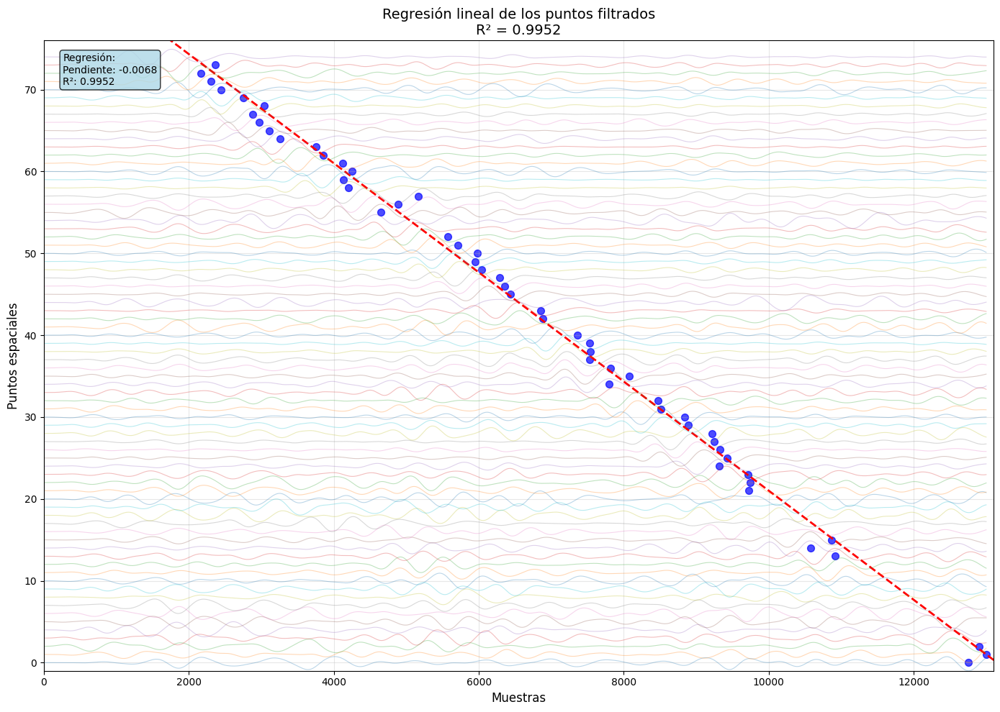

Rango de sensores: 0 a 74
Límites del gráfico: Y = -1 a 76


In [ ]:
# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))
# indices_a_eliminar = [3,4,5,9,10]
# mask = np.ones(len(xs_filtrados), dtype=bool)
# mask[indices_a_eliminar] = False
# xs_filtrados = xs_filtrados[mask]
# ys_filtrados = ys_filtrados[mask]

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Calcular y plotear regresión lineal
r2 = 0  # Valor por defecto
if len(xs_filtrados) >= 2:
    # Regresión lineal manual
    n = len(xs_filtrados)
    sum_x = np.sum(xs_filtrados)
    sum_y = np.sum(ys_filtrados)
    sum_xy = np.sum(xs_filtrados * ys_filtrados)
    sum_x2 = np.sum(xs_filtrados ** 2)
    
    m = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x ** 2)
    b = (sum_y - m * sum_x) / n
    
    # Calcular R²
    y_mean = np.mean(ys_filtrados)
    ss_tot = np.sum((ys_filtrados - y_mean) ** 2)
    y_pred = m * xs_filtrados + b
    ss_res = np.sum((ys_filtrados - y_pred) ** 2)
    r2 = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    
    # Línea de regresión
    x_line = np.linspace(0, H.da.shape[1] - 1, 100)
    y_line = m * x_line + b
    
    # Ecuación de la recta
    ecuacion = f"y = {m:.4f}x {'+' if b >= 0 else '-'} {abs(b):.4f}"
    
    ax.plot(x_line, y_line, color='red', linewidth=2, linestyle='--',
            label=f'Regresión: {ecuacion}')
    
    print(f"\n=== REGRESIÓN LINEAL ===")
    print(f"Pendiente (m): {m:.4f}")
    print(f"Intercepto (b): {b:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"Ecuación: {ecuacion}")

# Plotear las señales normalizadas
num_sensores = data.shape[0]
for i in range(num_sensores):
    señal = data[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title(f'Regresión lineal de los puntos filtrados\nR² = {r2:.4f}', fontsize=14)

# CORRECCIÓN: Ajustar límites del eje Y
ax.set_ylim(-1, num_sensores + 1)  # Margen inferior y superior
ax.set_xlim(0, 13100)  # Margen inferior y superior

ax.grid(True, alpha=0.3)
m = m -0.00015
# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
if len(xs_filtrados) >= 2:
    stats_text = f'Regresión:\nPendiente: {m:.4f}\nR²: {r2:.4f}'
else:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}\n\nInsuficientes puntos\npara regresión'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

# Información adicional
print(f"Rango de sensores: 0 a {num_sensores-1}")
print(f"Límites del gráfico: Y = -1 a {num_sensores + 1}")

##  Asignaciones y ejemplos

In [19]:
# Procesamiento completo
data = coche_completo_2.copy()
data = remove_trend(data, verbose=True)
data = remove_coherent_noise(data, method='fit', verbose=True)
data = bandpass_filter(data, dt=0.004, f1=0.1, f2=0.5, verbose=True)

Remove trend
Remove coherent noise using fit method
Apply bandpass filter: 0.1-0.5 Hz
Filtered trace 7 of 75
Filtered trace 14 of 75
Filtered trace 21 of 75
Filtered trace 28 of 75
Filtered trace 35 of 75
Filtered trace 42 of 75
Filtered trace 49 of 75
Filtered trace 56 of 75
Filtered trace 63 of 75
Filtered trace 70 of 75


Aplicando FISTA con sparsity mejorada a matriz 75x13000
Usando sparsity extrema para forzar máximos deltas...
Procesando 75 sensores con sparsity objetivo: 95.0%
Esto forzará señales muy sparse con deltas pronunciados

--- Sensor 1/75 ---

Procesando sensor 0 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.135 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.183 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.248 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.336 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.455 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.616 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 0.834 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 1.129 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 1.528 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 2.069 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 2.801 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 3.793 -> Sparsity: 0.017 (diff: 0.9327)
  Factor 5.135 -

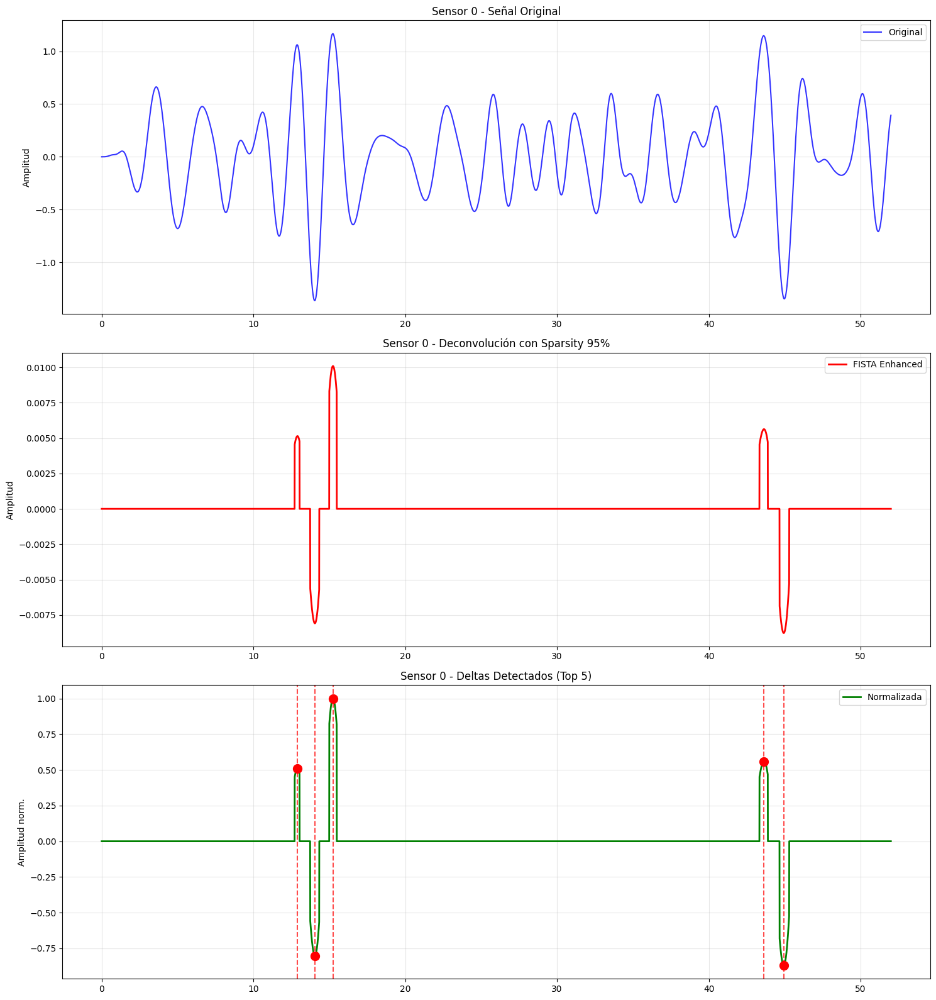

  Sensor 0: 5 deltas detectados

--- Sensor 2/75 ---

Procesando sensor 1 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 0.135 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 0.183 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 0.248 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 0.336 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 0.455 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 0.616 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 0.834 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 1.129 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 1.528 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 2.069 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 2.801 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 3.793 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 5.135 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 6.952 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 9.412 -> Sparsity: 0.030 (diff: 0.9198)
  Factor 12.743 -> Sparsity: 0.030 (diff: 0.9198)
  Fac

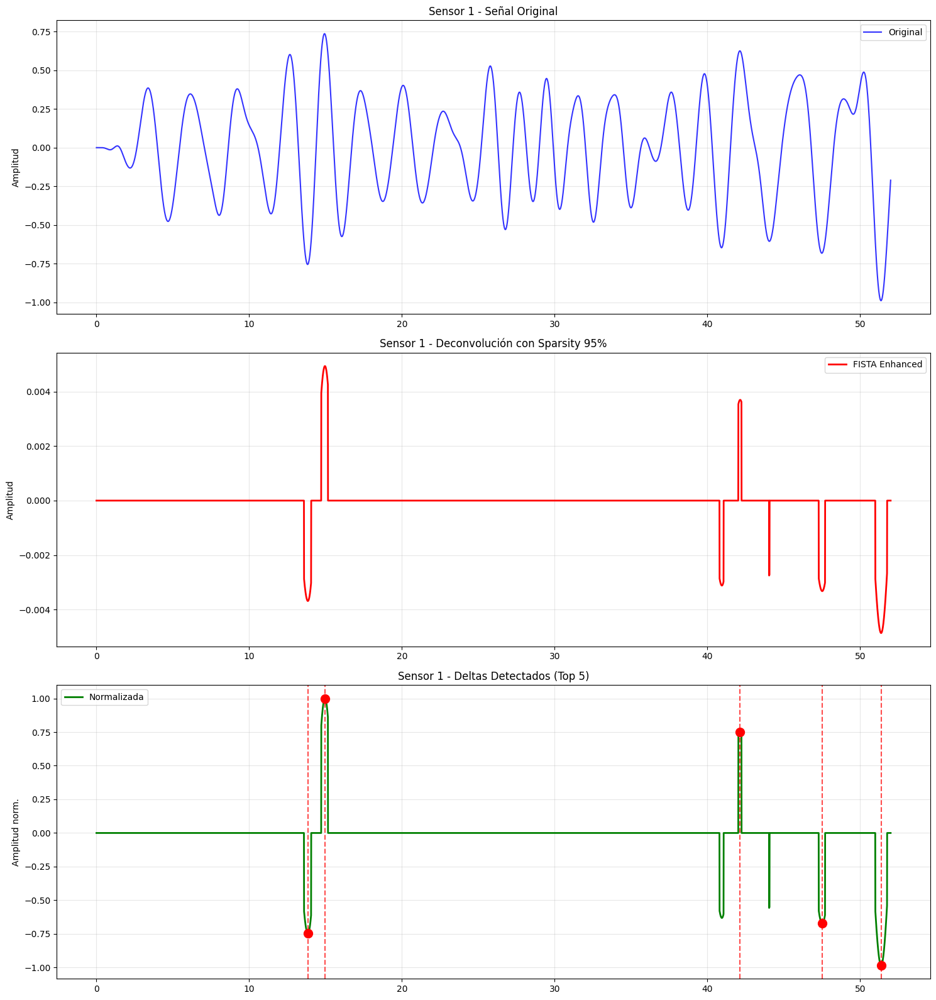

  Sensor 1: 7 deltas detectados

--- Sensor 3/75 ---

Procesando sensor 2 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 0.135 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 0.183 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 0.248 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 0.336 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 0.455 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 0.616 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 0.834 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 1.129 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 1.528 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 2.069 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 2.801 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 3.793 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 5.135 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 6.952 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 9.412 -> Sparsity: 0.036 (diff: 0.9135)
  Factor 12.743 -> Sparsity: 0.036 (diff: 0.9135)
  Fac

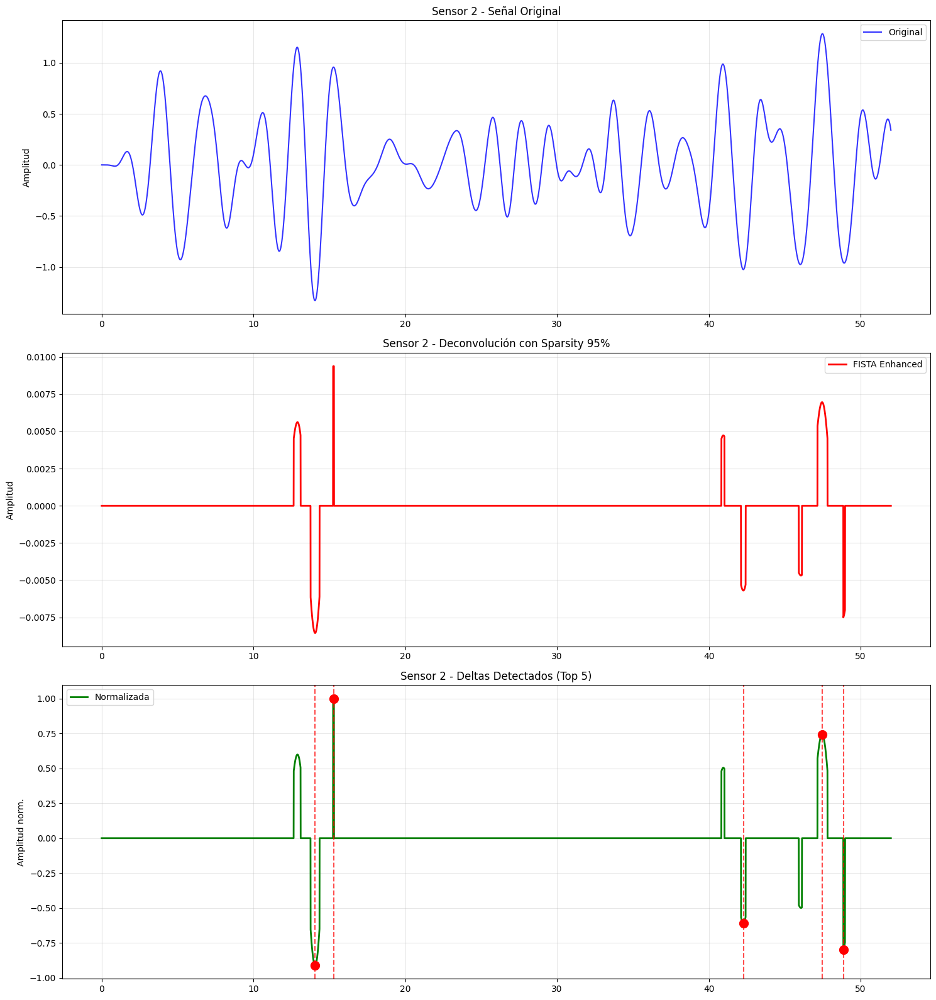

  Sensor 2: 8 deltas detectados

--- Sensor 4/75 ---

Procesando sensor 3 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 0.135 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 0.183 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 0.248 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 0.336 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 0.455 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 0.616 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 0.834 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 1.129 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 1.528 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 2.069 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 2.801 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 3.793 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 5.135 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 6.952 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 9.412 -> Sparsity: 0.027 (diff: 0.9233)
  Factor 12.743 -> Sparsity: 0.027 (diff: 0.9233)
  Fac

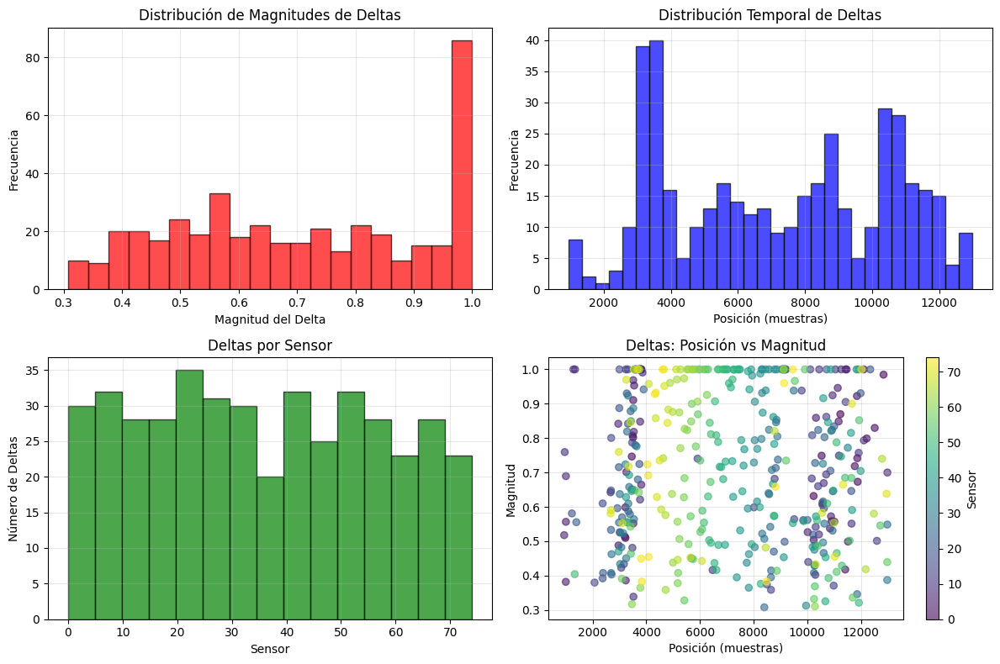


VISUALIZACIÓN DE SEÑALES CON PICOS


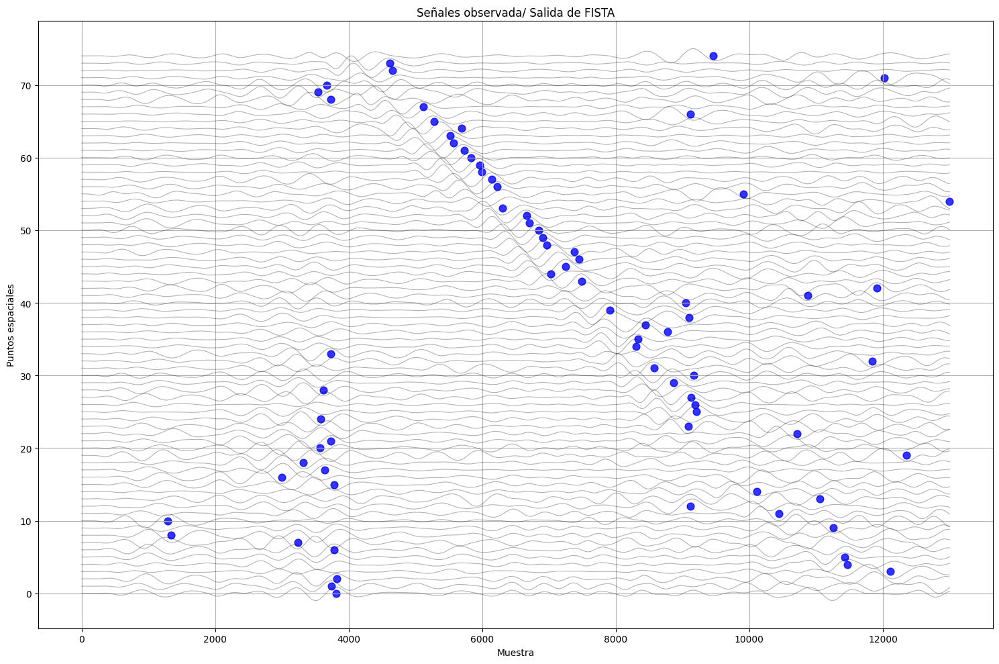

Visualización completada:
  - Sensores mostrados: 75
  - Picos mayores detectados: 75
  - Sensores con pico mayor: 75

ANÁLISIS DE PENDIENTES CON DELTAS FORZADOS
Sensor  0: Pendiente=-0.00025, Deltas:  1.000@3809 -> -0.870@11234 (29700.0ms)
Sensor  1: Pendiente=-0.00022, Deltas:  1.000@3740 -> -0.985@12843 (36412.0ms)
Sensor  2: Pendiente= 0.00629, Deltas:  1.000@3819 -> -0.911@3515 (1216.0ms)
Sensor  3: Pendiente= 0.00450, Deltas: -1.000@12108 ->  0.830@12515 (1628.0ms)
Sensor  4: Pendiente= 0.00025, Deltas:  1.000@11469 -> -0.953@3549 (31680.0ms)
Sensor  5: Pendiente= 0.00669, Deltas:  1.000@11428 -> -0.946@11137 (1164.0ms)
Sensor  6: Pendiente=-0.00028, Deltas:  1.000@3786 -> -0.859@10326 (26160.0ms)
Sensor  7: Pendiente= 0.00721, Deltas: -1.000@3241 ->  0.969@3514 (1092.0ms)
Sensor  8: Pendiente= 0.00079, Deltas: -1.000@1345 ->  0.991@3861 (10064.0ms)
Sensor  9: Pendiente=-0.00609, Deltas: -1.000@11261 ->  0.925@10945 (1264.0ms)
Sensor 10: Pendiente= 0.00543, Deltas:  1.000@1286 ->

In [24]:
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(data, senal_promedio,mode ='hard')

##  Bucles y estructuras de control


=== REGRESIÓN LINEAL ===
Pendiente (m): -0.0066
Intercepto (b): 87.1035
R²: 0.9957
Ecuación: y = -0.0066x + 87.1035


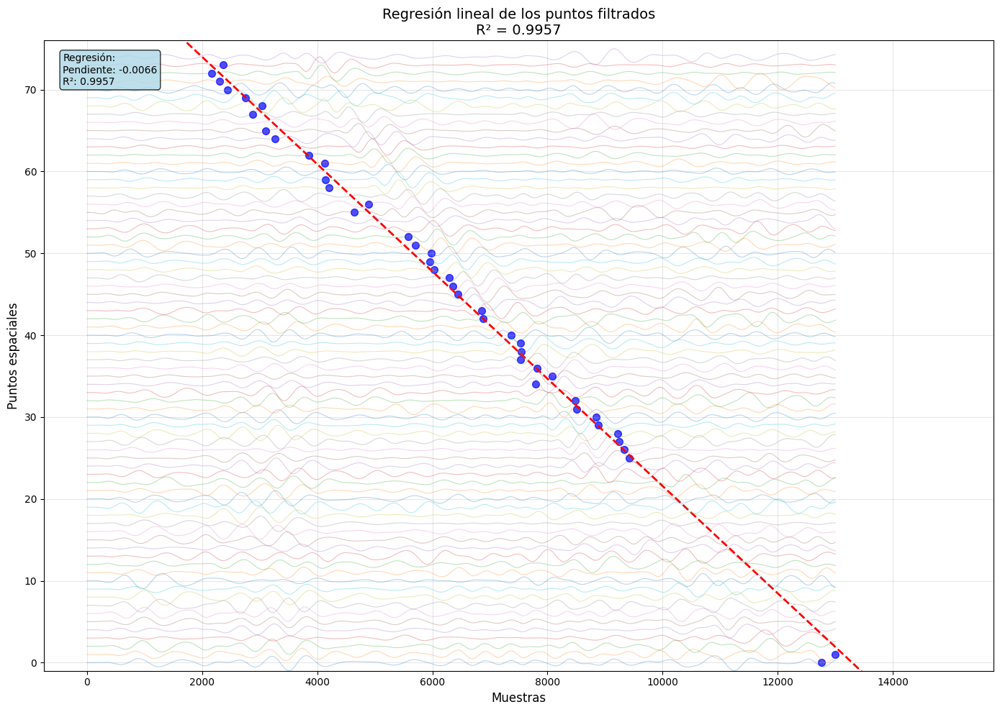

Rango de sensores: 0 a 74
Límites del gráfico: Y = -1 a 76


In [26]:
# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))
indices_a_eliminar = [2,3,37]
mask = np.ones(len(xs_filtrados), dtype=bool)
mask[indices_a_eliminar] = False
xs_filtrados = xs_filtrados[mask]
ys_filtrados = ys_filtrados[mask]

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Calcular y plotear regresión lineal
r2 = 0  # Valor por defecto
if len(xs_filtrados) >= 2:
    # Regresión lineal manual
    n = len(xs_filtrados)
    sum_x = np.sum(xs_filtrados)
    sum_y = np.sum(ys_filtrados)
    sum_xy = np.sum(xs_filtrados * ys_filtrados)
    sum_x2 = np.sum(xs_filtrados ** 2)
    
    m = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x ** 2)
    b = (sum_y - m * sum_x) / n
    
    # Calcular R²
    y_mean = np.mean(ys_filtrados)
    ss_tot = np.sum((ys_filtrados - y_mean) ** 2)
    y_pred = m * xs_filtrados + b
    ss_res = np.sum((ys_filtrados - y_pred) ** 2)
    r2 = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    
    # Línea de regresión
    x_line = np.linspace(0, H.da.shape[1] - 1, 100)
    y_line = m * x_line + b
    
    # Ecuación de la recta
    ecuacion = f"y = {m:.4f}x {'+' if b >= 0 else '-'} {abs(b):.4f}"
    
    ax.plot(x_line, y_line, color='red', linewidth=2, linestyle='--',
            label=f'Regresión: {ecuacion}')
    
    print(f"\n=== REGRESIÓN LINEAL ===")
    print(f"Pendiente (m): {m:.4f}")
    print(f"Intercepto (b): {b:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"Ecuación: {ecuacion}")

# Plotear las señales normalizadas
num_sensores = data.shape[0]
for i in range(num_sensores):
    señal = data[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title(f'Regresión lineal de los puntos filtrados\nR² = {r2:.4f}', fontsize=14)

# CORRECCIÓN: Ajustar límites del eje Y
ax.set_ylim(-1, num_sensores + 1)  # Margen inferior y superior

ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
if len(xs_filtrados) >= 2:
    stats_text = f'Regresión:\nPendiente: {m:.4f}\nR²: {r2:.4f}'
else:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}\n\nInsuficientes puntos\npara regresión'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

# Información adicional
print(f"Rango de sensores: 0 a {num_sensores-1}")
print(f"Límites del gráfico: Y = -1 a {num_sensores + 1}")

##  Asignaciones y ejemplos

In [27]:
# Procesamiento completo
data = coche_completo_3.copy()
data = remove_trend(data, verbose=True)
data = remove_coherent_noise(data, method='fit', verbose=True)
data = bandpass_filter(data, dt=0.004, f1=0.1, f2=0.5, verbose=True)

Remove trend
Remove coherent noise using fit method
Apply bandpass filter: 0.1-0.5 Hz
Filtered trace 7 of 75
Filtered trace 14 of 75
Filtered trace 21 of 75
Filtered trace 28 of 75
Filtered trace 35 of 75
Filtered trace 42 of 75
Filtered trace 49 of 75
Filtered trace 56 of 75
Filtered trace 63 of 75
Filtered trace 70 of 75


Aplicando FISTA con sparsity mejorada a matriz 75x13000
Usando sparsity extrema para forzar máximos deltas...
Procesando 75 sensores con sparsity objetivo: 95.0%
Esto forzará señales muy sparse con deltas pronunciados

--- Sensor 1/75 ---

Procesando sensor 0 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 0.135 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 0.183 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 0.248 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 0.336 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 0.455 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 0.616 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 0.834 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 1.129 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 1.528 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 2.069 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 2.801 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 3.793 -> Sparsity: 0.015 (diff: 0.9352)
  Factor 5.135 -

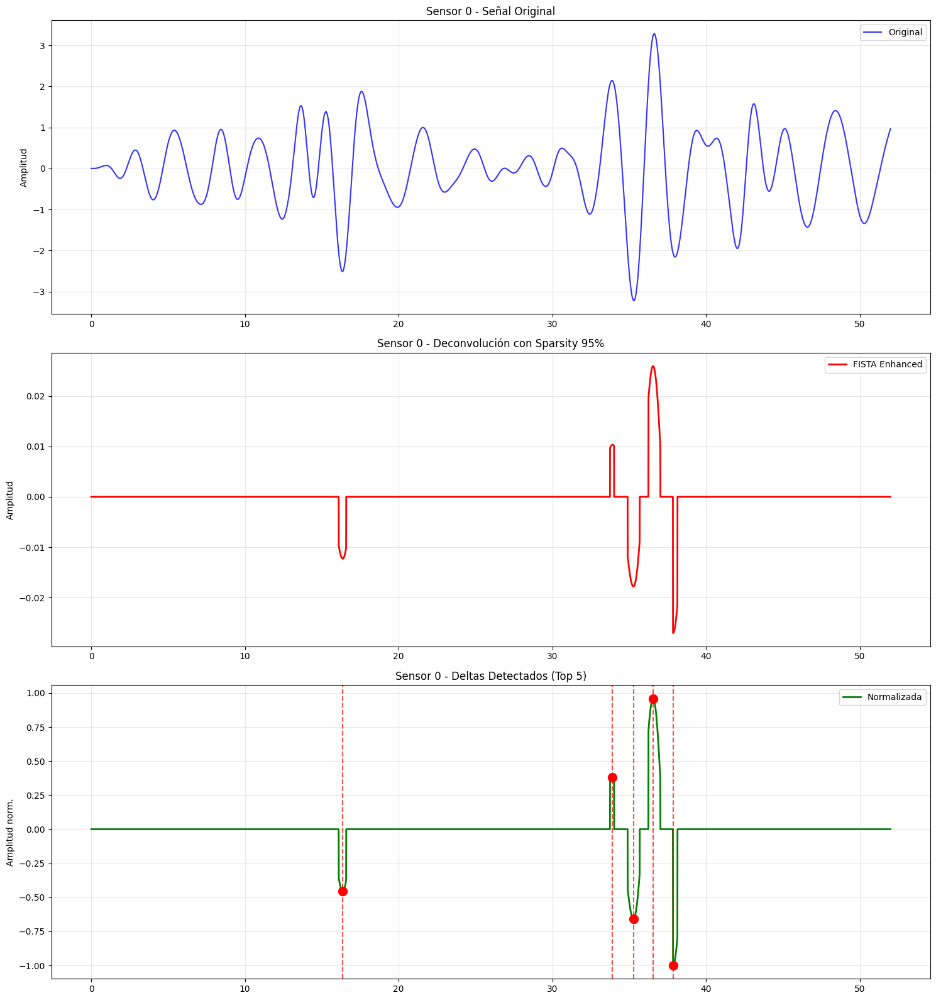

  Sensor 0: 5 deltas detectados

--- Sensor 2/75 ---

Procesando sensor 1 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 0.135 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 0.183 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 0.248 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 0.336 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 0.455 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 0.616 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 0.834 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 1.129 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 1.528 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 2.069 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 2.801 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 3.793 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 5.135 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 6.952 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 9.412 -> Sparsity: 0.032 (diff: 0.9178)
  Factor 12.743 -> Sparsity: 0.032 (diff: 0.9178)
  Fac

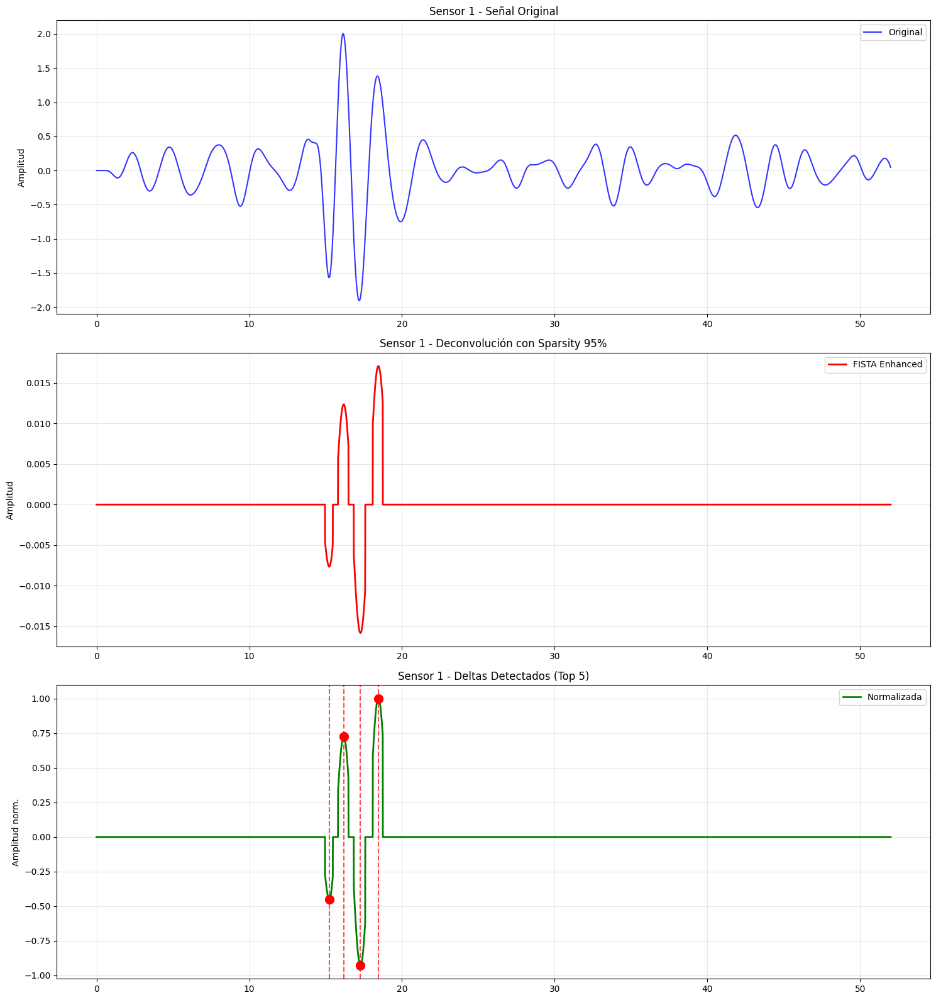

  Sensor 1: 4 deltas detectados

--- Sensor 3/75 ---

Procesando sensor 2 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 0.135 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 0.183 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 0.248 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 0.336 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 0.455 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 0.616 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 0.834 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 1.129 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 1.528 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 2.069 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 2.801 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 3.793 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 5.135 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 6.952 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 9.412 -> Sparsity: 0.028 (diff: 0.9220)
  Factor 12.743 -> Sparsity: 0.028 (diff: 0.9220)
  Fac

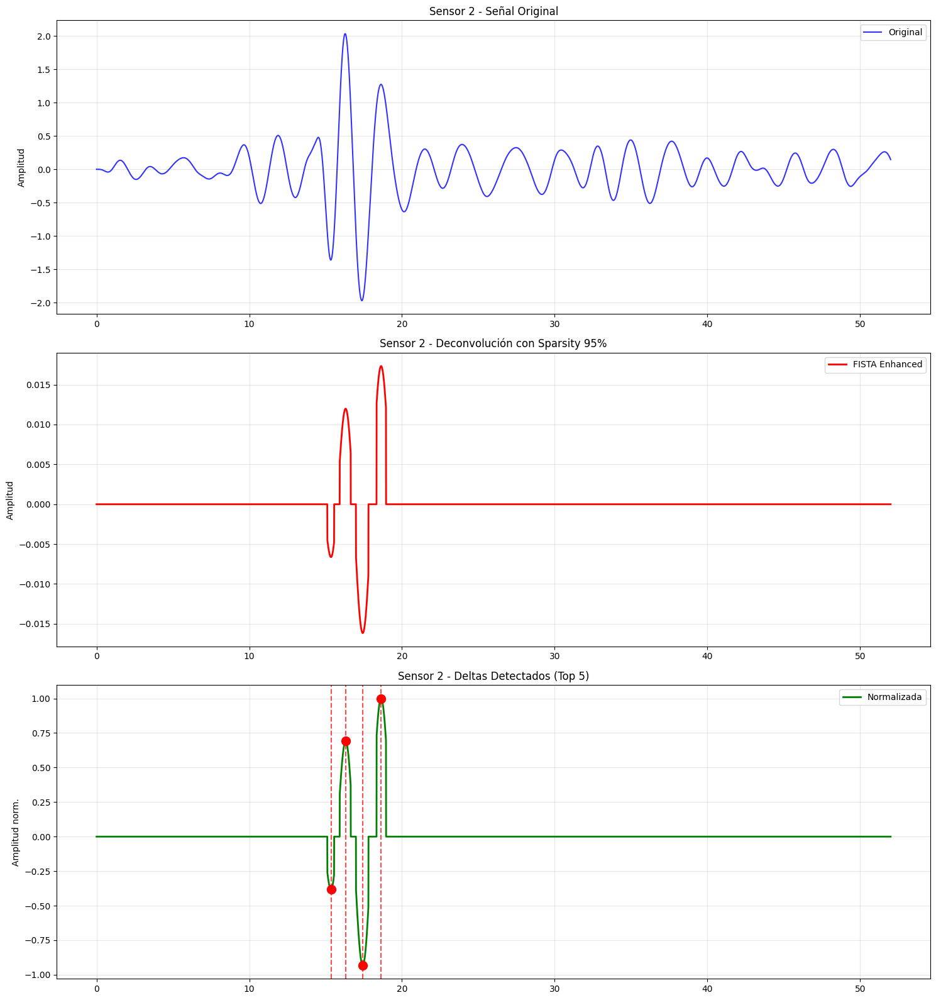

  Sensor 2: 4 deltas detectados

--- Sensor 4/75 ---

Procesando sensor 3 con sparsity objetivo: 95.0%
Buscando factor de sparsity para objetivo: 95.0% ceros...
  Factor 0.100 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 0.135 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 0.183 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 0.248 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 0.336 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 0.455 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 0.616 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 0.834 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 1.129 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 1.528 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 2.069 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 2.801 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 3.793 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 5.135 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 6.952 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 9.412 -> Sparsity: 0.016 (diff: 0.9339)
  Factor 12.743 -> Sparsity: 0.016 (diff: 0.9339)
  Fac

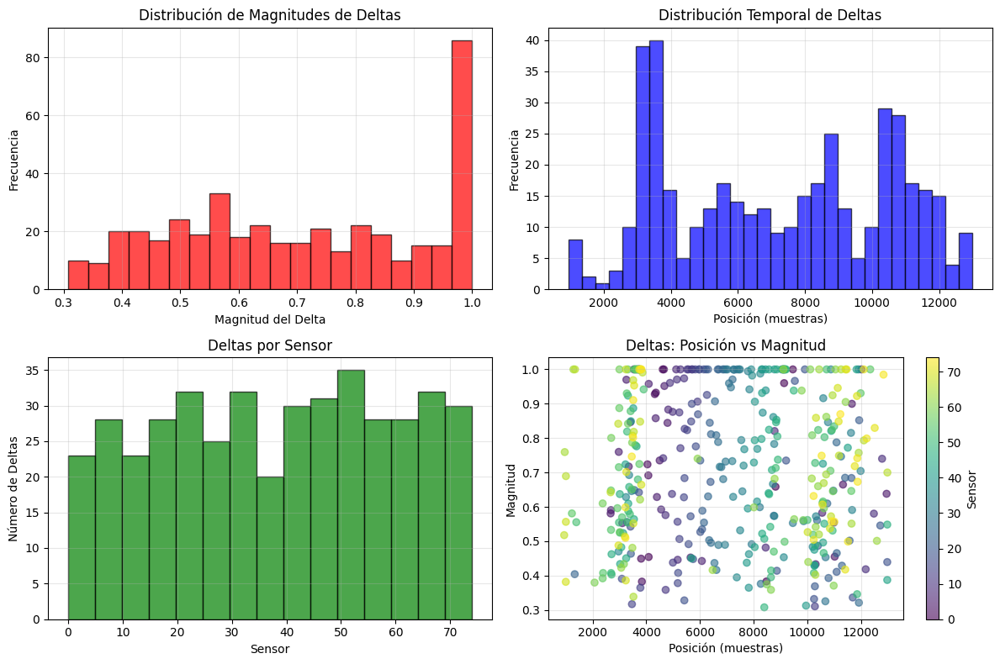


VISUALIZACIÓN DE SEÑALES CON PICOS


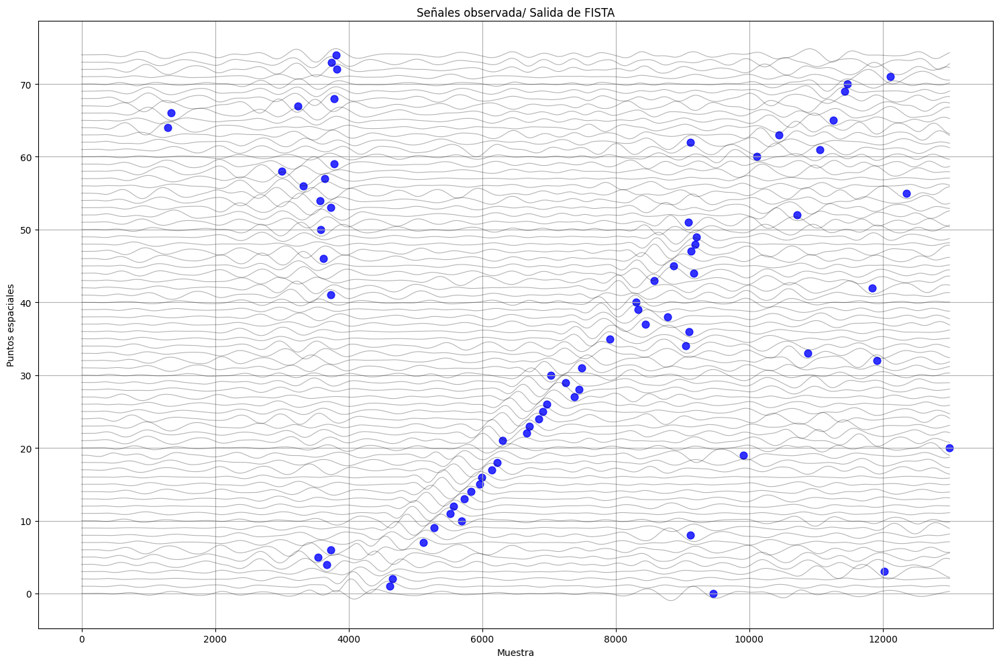

Visualización completada:
  - Sensores mostrados: 75
  - Picos mayores detectados: 75
  - Sensores con pico mayor: 75

ANÁLISIS DE PENDIENTES CON DELTAS FORZADOS
Sensor  0: Pendiente=-0.00605, Deltas: -1.000@9463 ->  0.960@9139 (1296.0ms)
Sensor  1: Pendiente= 0.00658, Deltas:  1.000@4613 -> -0.928@4320 (1172.0ms)
Sensor  2: Pendiente= 0.00642, Deltas:  1.000@4658 -> -0.932@4357 (1204.0ms)
Sensor  3: Pendiente=-0.00532, Deltas: -1.000@12021 ->  0.900@11664 (1428.0ms)
Sensor  4: Pendiente= 0.00165, Deltas: -1.000@3672 ->  0.844@4792 (4480.0ms)
Sensor  5: Pendiente=-0.00709, Deltas: -1.000@3538 ->  0.970@3260 (1112.0ms)
Sensor  6: Pendiente= 0.00542, Deltas: -1.000@3732 ->  0.958@4093 (1444.0ms)
Sensor  7: Pendiente= 0.00638, Deltas:  1.000@5115 -> -0.883@4820 (1180.0ms)
Sensor  8: Pendiente=-0.00537, Deltas: -1.000@9122 ->  0.821@8783 (1356.0ms)
Sensor  9: Pendiente= 0.00643, Deltas:  1.000@5277 -> -0.876@4985 (1168.0ms)
Sensor 10: Pendiente=-0.00702, Deltas: -1.000@5692 ->  0.974@5411 

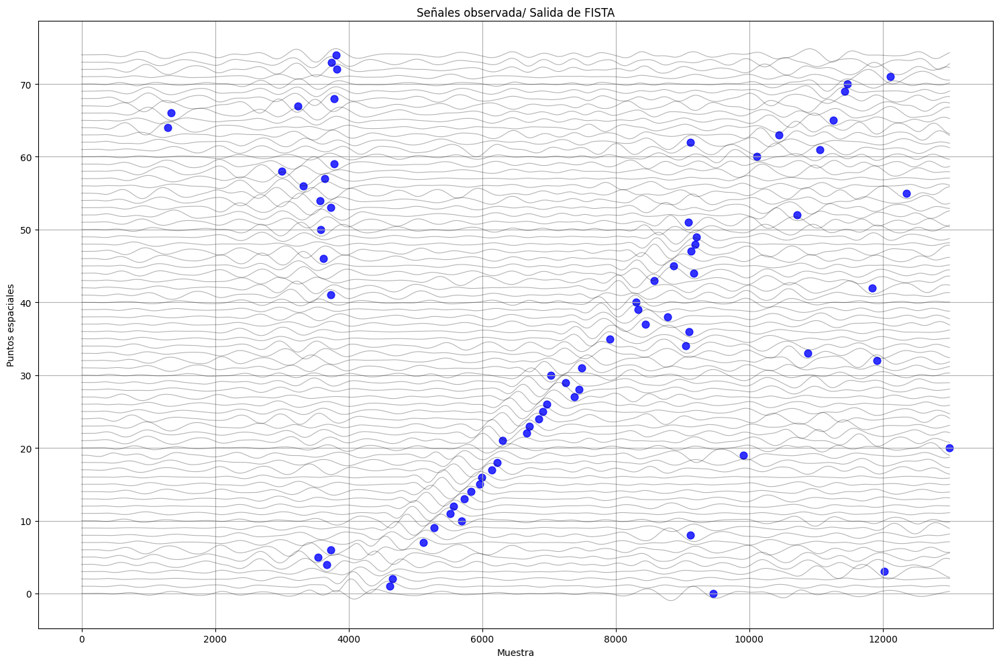

Visualización completada:
  - Sensores mostrados: 75
  - Picos mayores detectados: 75
  - Sensores con pico mayor: 75


In [28]:
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(data, senal_promedio,mode ='hard')
visualize_signals_with_peaks(data, picos_matrix, num_sensores=75, fs=250)

In [29]:
data = np.flipud(data)  # Voltea verticalmente los datos

# O si tienes una matriz de picos:
picos_matrix = np.flipud(picos_matrix)

=== PASO 1: Filtrar columnas con muchos picos ===

=== PASO 2: Aplicar DBSCAN ===
Puntos originales: 75
Puntos después de DBSCAN: 54
Outliers eliminados: 21

=== RESULTADO FINAL ===
Puntos finales: 54


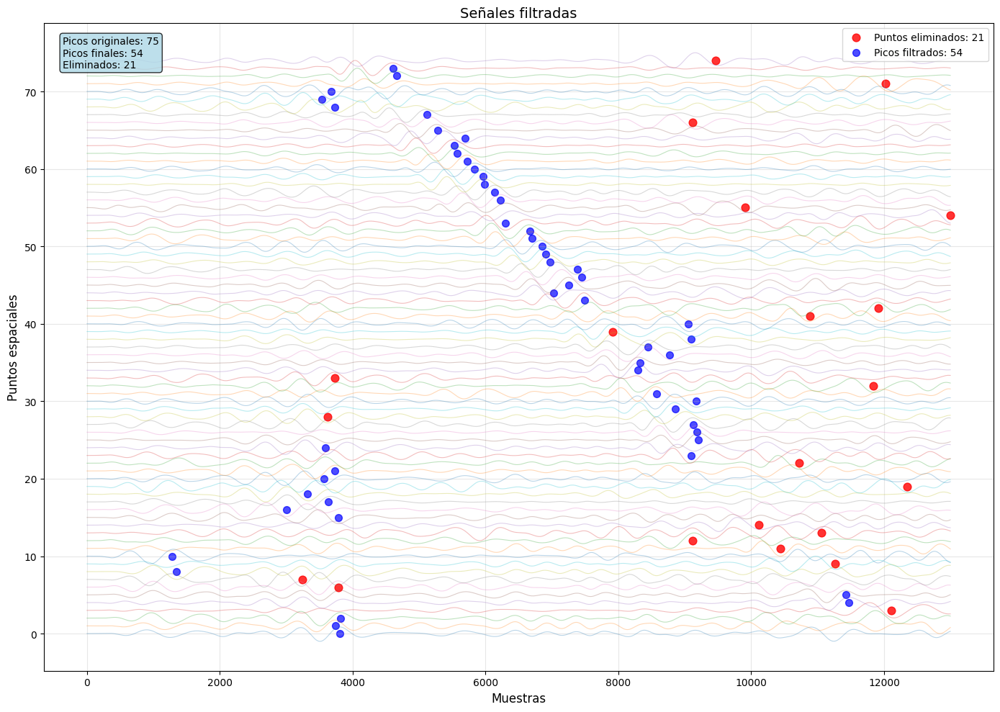

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys, np.array([]), np.array([])
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    mask_ruido = labels == -1
    
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    xs_eliminados = xs[mask_ruido]
    ys_eliminados = ys[mask_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs_eliminados)}")
    
    return xs_filtrados, ys_filtrados, xs_eliminados, ys_eliminados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados, xs_eliminados, ys_eliminados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear puntos eliminados (outliers) en rojo
if len(xs_eliminados) > 0:
    ax.scatter(xs_eliminados, ys_eliminados, 
               color='red', alpha=0.8, s=60, 
               label=f'Puntos eliminados: {len(xs_eliminados)}')

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(data.shape[0]):
    señal = data[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

##  Bucles y estructuras de control

In [31]:
indices_originales = [53, 52, 51, 48, 47, 46, 45, 44, 43, 42, 41, 39, 28, 27, 26, 2, 3, 4]
longitud = 54

# Convertir índices después de invertir la lista
indices_invertidos = [longitud - 1 - i for i in indices_originales]
indices_invertidos

[0, 1, 2, 5, 6, 7, 8, 9, 10, 11, 12, 14, 25, 26, 27, 51, 50, 49]


=== REGRESIÓN LINEAL ===
Pendiente (m): -0.0099
Intercepto (b): 117.8562
R²: 0.9887
Ecuación: y = -0.0099x + 117.8562


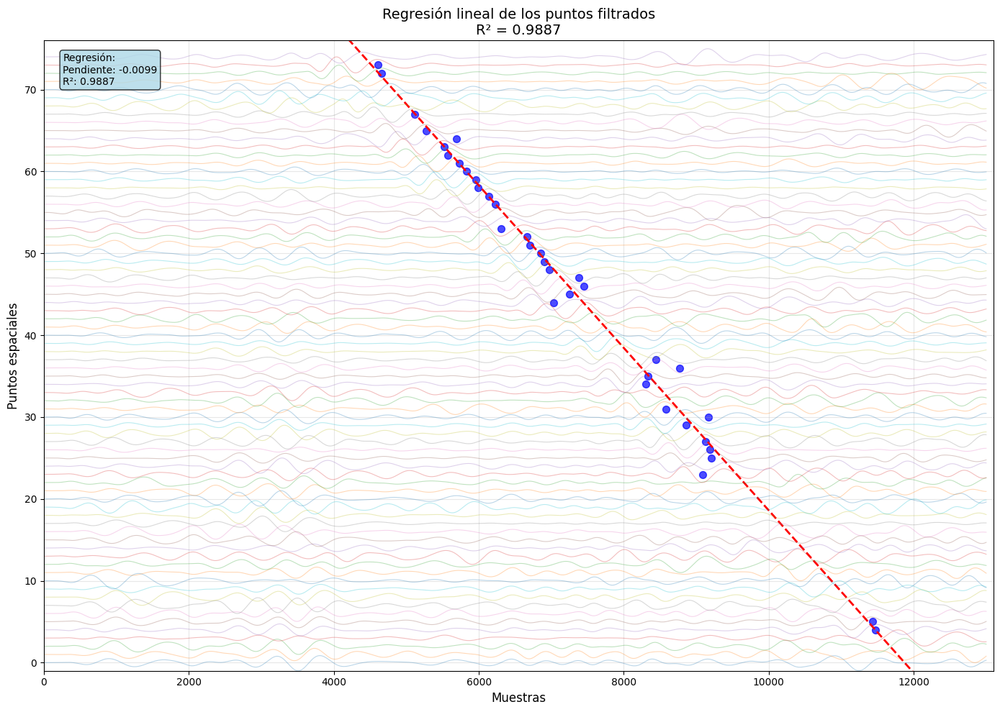

Rango de sensores: 0 a 74
Límites del gráfico: Y = -1 a 76


In [ ]:
# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))
# indices_a_eliminar = indices_invertidos
# mask = np.ones(len(xs_filtrados), dtype=bool)
# mask[indices_a_eliminar] = False
# xs_filtrados = xs_filtrados[mask]
# ys_filtrados = ys_filtrados[mask]

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Calcular y plotear regresión lineal
r2 = 0  # Valor por defecto
if len(xs_filtrados) >= 2:
    # Regresión lineal manual
    n = len(xs_filtrados)
    sum_x = np.sum(xs_filtrados)
    sum_y = np.sum(ys_filtrados)
    sum_xy = np.sum(xs_filtrados * ys_filtrados)
    sum_x2 = np.sum(xs_filtrados ** 2)
    
    m = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x ** 2)
    b = (sum_y - m * sum_x) / n
    
    # Calcular R²
    y_mean = np.mean(ys_filtrados)
    ss_tot = np.sum((ys_filtrados - y_mean) ** 2)
    y_pred = m * xs_filtrados + b
    ss_res = np.sum((ys_filtrados - y_pred) ** 2)
    r2 = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    
    # Línea de regresión
    x_line = np.linspace(0, H.da.shape[1] - 1, 100)
    y_line = m * x_line + b
    
    # Ecuación de la recta
    ecuacion = f"y = {m:.4f}x {'+' if b >= 0 else '-'} {abs(b):.4f}"
    
    ax.plot(x_line, y_line, color='red', linewidth=2, linestyle='--',
            label=f'Regresión: {ecuacion}')
    
    print(f"\n=== REGRESIÓN LINEAL ===")
    print(f"Pendiente (m): {m:.4f}")
    print(f"Intercepto (b): {b:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"Ecuación: {ecuacion}")

# Plotear las señales normalizadas
num_sensores = data.shape[0]
for i in range(num_sensores):
    señal = data[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title(f'Regresión lineal de los puntos filtrados\nR² = {r2:.4f}', fontsize=14)

# CORRECCIÓN: Ajustar límites del eje Y
ax.set_ylim(-1, num_sensores + 1)  # Margen inferior y superior
ax.set_xlim(0, 13100)  # Margen inferior y superior

ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
if len(xs_filtrados) >= 2:
    stats_text = f'Regresión:\nPendiente: {m:.4f}\nR²: {r2:.4f}'
else:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales}\n\nInsuficientes puntos\npara regresión'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

# Información adicional
print(f"Rango de sensores: 0 a {num_sensores-1}")
print(f"Límites del gráfico: Y = -1 a {num_sensores + 1}")

##  Asignaciones y ejemplos

In [ ]:
picos_matrix[63, :] = 0
# picos_matrix1[9, :] = 0
# picos_matrix1[8, :] = 0

##  Importación de librerías

In [34]:
# ============================================================================
# SECCIÓN 1: IMPORTACIÓN DE LIBRERÍAS
# ============================================================================

# Importar librerías nativas python
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import find_peaks, peak_widths
import scipy.signal
from scipy.signal import hilbert

# Importar librería creada
from hdas_features_bueno import HDAS

# ============================================================================
# SECCIÓN 2: CARGA Y PREPROCESAMIENTO DE DATOS
# ============================================================================

filenames = ['2025_02_28_05h03m41s_ch1_HDAS_2Dmap_Strain.bin']

H = HDAS('.',filenames)

H.removeTrend()
H.removeCoherentNoise()
H.filter(0.1,0.5)
H.da = data

# ============================================================================
# SECCIÓN 3: DEFINICIÓN DE DATOS Y PARÁMETROS
# ============================================================================

aux = 400

# Índices de las señales y sus posiciones centrales
# indices_posiciones = [
# (0, 13150), (1, 13100), (2, 12900), (3, 12750), (4, 12650),
# (5, 12550), (6, 12100), (7, 11950), (8, 11900), (9, 11750),
# (10, 11600), (11, 11500), (12, 11350), (13, 10950), (14, 10750),
# (15, 10650), (16, 10600), (17, 10500), (18, 10250), (19, 10100),
# (20, 10000), (21, 9900), (22, 9800), (23, 9450), (24, 9250),
# (25, 9450), (26, 9250), (27, 9200), (28, 9150), (29, 9000),
# (30, 9500), (31, 9250), (32, 9150), (33, 9100), (34, 8250),
# (35, 8200), (36, 8150), (37, 8100), (38, 8000), (39, 8000),
# (40, 7650), (41, 7500), (42, 7300), (43, 7100), (44, 7000),
# (45, 6850), (46, 6750), (47, 6550), (48, 6350), (49, 6300),
# (50, 6200), (51, 6000), (52, 5950), (53, 5900), (54, 5850),
# (55, 5800), (56, 5650), (57, 5200), (58, 5150), (59, 5000),
# (60, 4950), (61, 4650), (62, 4650), (63, 4500), (64, 4400),
# (65, 4300), (66, 4150), (67, 4100), (68, 3850), (69, 3800),
# (70, 3250), (71, 3375), (72, 3125), (73, 3350), (74, 3050)
# ]

# # ============================================================================
# # SECCIÓN 4: PROCESAMIENTO Y VISUALIZACIÓN DE SEÑALES INDIVIDUALES
# # ============================================================================

# plt.figure(21)

# # Lista para almacenar las señales normalizadas
# senales_normalizadas = []

# # Recorre las señales seleccionadas
# for offset, (i, centro) in enumerate(indices_posiciones):
# señal = H.da[i, (centro - aux):(centro + aux)]
# señal_norm = señal  # Normalización
# plt.plot(señal_norm + offset*2, label=f'SP {i}', alpha=0.8)
# senales_normalizadas.append(señal_norm)

# # Convertir la lista a matriz numpy (cada fila es una señal)
# plt.axvline(x=aux, color='red', linestyle='--', label='Centro (x=500)')
# plt.title('Señales seleccionadas normalizadas y desplazadas')
# plt.xlabel('Muestras')
# plt.ylabel('Amplitud (desplazada)')
# plt.grid(True)
# plt.show()

# matriz_senales = np.array(senales_normalizadas)

# # Calcular el promedio punto a punto
# senal_promedio = np.mean(matriz_senales, axis=0)
# plt.plot(senal_promedio, label='Promedio')

# # ============================================================================
# # SECCIÓN 5: CÁLCULO DE EIGENVALORES Y PARÁMETROS
# # ============================================================================

# # Producto de la transpuesta de senalX por senalX
# senales_normalizadas = np.array(senales_normalizadas)
# senal_producto = np.dot(senales_normalizadas.T, senales_normalizadas)
# Imprimir(senal_producto.shape)

# # Eigenvalor máximo de la matriz senal_producto
# eigenvalues, eigenvectors = np.linalg.eig(senal_producto)
# k = eigenvalues
# Imprimir('Eigenvalues:', max(k))
# k = k / np.linalg.norm(k)
# Imprimir(max(k))
# delta = max(k)/10
# Imprimir(delta)

# ============================================================================
# SECCIÓN 6: FUNCIONES DE THRESHOLD
# ============================================================================

# Función: soft_threshold
def soft_threshold(x, threshold):
    return np.sign(x) * np.maximum(np.abs(x) - threshold, 0)

# Función: hard_threshold
def hard_threshold(x, threshold, percentile=95):
    """
    Hard-threshold que mantiene solo los valores más grandes
    
    percentile: percentil por encima del cual se mantienen los valores
    """
    abs_x = np.abs(x)
    threshold_val = np.percentile(abs_x, percentile)
    mask = abs_x >= threshold_val
    result = np.zeros_like(x)
    result[mask] = x[mask]
    return result

# ============================================================================
# SECCIÓN 7: ALGORITMO FISTA MEJORADO
# ============================================================================

# Función: fista_deconvolution_L1_enhanced
def fista_deconvolution_L1_enhanced(ir, y, delta, rho, 
                                  sparsity_factor=1.0, 
                                  threshold_mode='soft',
                                  adaptive_sparsity=False,
                                  imax=200, tol=1e-8):
    """
    FISTA con control mejorado de sparsity
    
    Parámetros:
    - sparsity_factor: Factor multiplicativo para el threshold (>1 = más sparse)
    - threshold_mode: 'soft', 'hard', o 'adaptive'
    - adaptive_sparsity: Si True, aumenta sparsity_factor con las iteraciones
    """
    x = np.zeros_like(y)
    r = x.copy()
    t = 1
    x_prev = x.copy()
    
    MAX_VALUE = 1e6
    MIN_VALUE = -1e6
    
    sparsity_evolution = []
    
    for iteration in range(imax):
        try:
            conv_result = np.convolve(r, ir, mode='full')[:len(y)]
            grad = conv_result - y
            
            if np.any(np.isnan(grad)) or np.any(np.isinf(grad)):
                break
            grad = np.clip(grad, MIN_VALUE, MAX_VALUE)
            
            step = r - delta * grad
            
            # Aplicar threshold con factor de sparsity
            current_sparsity = sparsity_factor
            if adaptive_sparsity:
                # Aumentar sparsity gradualmente
                current_sparsity = sparsity_factor * (1 + 0.01 * iteration)
            
            if threshold_mode == 'soft':
                r = soft_threshold(step, delta * rho)
            elif threshold_mode == 'hard':
                r = hard_threshold(step, delta * rho * current_sparsity)
            elif threshold_mode == 'adaptive':
                # Combinar soft y hard threshold
                if iteration < imax // 2:
                    r = soft_threshold(step, delta * rho)
                else:
                    r = hard_threshold(step, delta * rho * current_sparsity, percentile=98)
            
            if np.any(np.isnan(r)) or np.any(np.isinf(r)):
                r = np.nan_to_num(r, nan=0.0, posinf=MAX_VALUE, neginf=MIN_VALUE)
            r = np.clip(r, MIN_VALUE, MAX_VALUE)
            
            t_new = 0.5 * (1 + np.sqrt(1 + 4 * t**2))
            if np.isnan(t_new) or np.isinf(t_new):
                t_new = 1.0
            
            momentum_term = (t - 1) / t_new * (r - x_prev)
            x = r + momentum_term
            x = np.clip(x, MIN_VALUE, MAX_VALUE)
            
            # Calcular métrica de sparsity
            sparsity_metric = np.sum(np.abs(x) < 1e-6) / len(x)  # Porcentaje de valores ~cero
            sparsity_evolution.append(sparsity_metric)
            
            if iteration > 0:
                change = np.linalg.norm(x - x_prev) / (np.linalg.norm(x_prev) + 1e-12)
                if change < tol:
                    break
            
            t = t_new
            x_prev = x.copy()
            
        except Exception:
            break
    
    return x, sparsity_evolution

# ============================================================================
# SECCIÓN 8: OPTIMIZACIÓN DE PARÁMETROS DE SPARSITY
# ============================================================================

# Función: find_optimal_sparsity_factor
def find_optimal_sparsity_factor(ir, y, delta, rho, target_sparsity=0.9, 
                               sparsity_range=None, max_iterations=50):
    """
    Busca el factor de sparsity que produzca el nivel de sparsity deseado
    
    target_sparsity: Porcentaje objetivo de valores cercanos a cero (0.9 = 90%)
    """
    if sparsity_range is None:
        sparsity_range = np.logspace(-1, 1.5, 20)  # 0.1 a ~30
    
    best_factor = 1.0
    best_diff = float('inf')
    results = []
    
    print(f"Buscando factor de sparsity para objetivo: {target_sparsity*100:.1f}% ceros...")
    
    for factor in sparsity_range:
        x, sparsity_evo = fista_deconvolution_L1_enhanced(
            ir, y, delta, rho, sparsity_factor=factor, 
            threshold_mode='soft', imax=max_iterations
        )
        
        final_sparsity = sparsity_evo[-1] if sparsity_evo else 0
        diff = abs(final_sparsity - target_sparsity)
        results.append((factor, final_sparsity, diff))
        
        if diff < best_diff:
            best_diff = diff
            best_factor = factor
        
        print(f"  Factor {factor:.3f} -> Sparsity: {final_sparsity:.3f} (diff: {diff:.4f})")
    
    print(f"\nMejor factor: {best_factor:.3f} (sparsity lograda: {results[np.argmin([r[2] for r in results])][1]:.3f})")
    
    return best_factor, results

# Función: calculate_optimal_parameters_with_sparsity
def calculate_optimal_parameters_with_sparsity(ir, y, target_sparsity=0.85, snr_db=None):
    """
    Calcula parámetros óptimos incluyendo el factor de sparsity
    
    target_sparsity: Nivel de sparsity deseado (0.85 = 85% de valores ~cero)
    """
    
    # Calcular parámetros base como antes
    ir_fft = np.fft.fft(ir, len(y))
    L = np.max(np.abs(ir_fft)**2)
    delta_optimal = 1.0 / L
    delta_conservative = 0.01 / np.max(np.abs(ir))
    delta = min(delta_optimal, delta_conservative)
    
    # Estimación mejorada de rho considerando sparsity objetivo
    noise_estimate = np.std(np.diff(y, n=2))
    
    if snr_db is not None:
        snr_linear = 10**(snr_db/10)
        signal_power = np.var(y)
        noise_power = signal_power / snr_linear
        noise_estimate = np.sqrt(noise_power)
    
    # Ajustar rho basado en el target de sparsity
    signal_energy = np.linalg.norm(y)
    
    # Rho más agresivo para mayor sparsity
    base_rho = noise_estimate * 0.1
    sparsity_multiplier = target_sparsity ** (-0.5)  # Más sparsity -> rho mayor
    rho = base_rho * sparsity_multiplier
    
    # Buscar factor de sparsity óptimo
    sparsity_factor, _ = find_optimal_sparsity_factor(
        ir, y, delta, rho, target_sparsity, max_iterations=30
    )
    
    print(f"\nParámetros calculados con control de sparsity:")
    print(f"  Delta: {delta:.6f}")
    print(f"  Rho: {rho:.6f}")
    print(f"  Factor de sparsity: {sparsity_factor:.3f}")
    print(f"  Target sparsity: {target_sparsity*100:.1f}%")
    
    return delta, rho, sparsity_factor

# ============================================================================
# SECCIÓN 9: PROCESAMIENTO DE SENSORES INDIVIDUALES
# ============================================================================

# Función: process_sensor_with_enhanced_sparsity
def process_sensor_with_enhanced_sparsity(senal_promedio, data_sensor, sensor_idx, mode,
                                        target_sparsity=0.90, show_plots=False):
    """
    Procesa un sensor con control mejorado de sparsity para forzar más deltas
    
    target_sparsity: Mayor valor = más deltas/picos pronunciados (recomendado: 0.85-0.95)
    """
    print(f"\nProcesando sensor {sensor_idx} con sparsity objetivo: {target_sparsity*100:.1f}%")
    
    # Calcular parámetros con control de sparsity
    delta, rho, sparsity_factor = calculate_optimal_parameters_with_sparsity(
        senal_promedio, data_sensor, target_sparsity
    )
    print(f"  Parámetros calculados: Delta={delta:.6f}, Rho={rho:.6f}, Sparsity Factor={sparsity_factor:.3f}")
    # Aplicar FISTA con sparsity mejorada
    x_deconv, sparsity_evolution = fista_deconvolution_L1_enhanced(
        senal_promedio, data_sensor, delta, rho,
        sparsity_factor=sparsity_factor,
        threshold_mode=mode,  # Usar threshold adaptivo
        adaptive_sparsity=True,     # Aumentar sparsity con iteraciones
        imax=1000
    )
    
    # Análisis de resultados
    final_sparsity = sparsity_evolution[-1] if sparsity_evolution else 0
    n_significant_peaks = np.sum(np.abs(x_deconv) > 0.1 * np.max(np.abs(x_deconv)))
    
    print(f"  Sparsity lograda: {final_sparsity*100:.1f}%")
    print(f"  Picos significativos: {n_significant_peaks}")
    print(f"  Máximo absoluto: {np.max(np.abs(x_deconv)):.4f}")
    
    # Normalizar y encontrar picos principales
    if np.max(np.abs(x_deconv)) > 0:
        x_norm = x_deconv / np.max(np.abs(x_deconv))
    else:
        x_norm = x_deconv
        print(f"  ADVERTENCIA: Señal deconvolucionada es cero")
        return None, None
    
    # Encontrar picos más pronunciados (deltas)
    delta_threshold = 0.3  # Solo considerar picos > 30% del máximo
    significant_peaks = []
    
    for i in range(1, len(x_norm)-1):
        if abs(x_norm[i]) > delta_threshold:
            # Verificar si es un máximo/mínimo local
            is_peak = (abs(x_norm[i]) > abs(x_norm[i-1]) and 
                      abs(x_norm[i]) > abs(x_norm[i+1]))
            if is_peak:
                significant_peaks.append((i, x_norm[i]))
    
    # Ordenar por magnitud absoluta
    significant_peaks.sort(key=lambda x: abs(x[1]), reverse=True)
    
    if show_plots and (sensor_idx % 10 == 0 or sensor_idx < 3):
        fs = 250
        tiempo = np.arange(len(x_norm)) / fs
        
        fig, axs = plt.subplots(3, 1, figsize=(15, 16))
        
        # Señal original
        axs[0].plot(tiempo, data_sensor, 'b-', alpha=0.8, label='Original')
        axs[0].set_title(f'Sensor {sensor_idx} - Señal Original')
        axs[0].set_ylabel('Amplitud')
        axs[0].legend()
        axs[0].grid(True, alpha=0.3)
        
        # Señal deconvolucionada
        axs[1].plot(tiempo, x_deconv, 'r-', linewidth=2, label='FISTA Enhanced')
        axs[1].set_title(f'Sensor {sensor_idx} - Deconvolución con Sparsity {target_sparsity*100:.0f}%')
        axs[1].set_ylabel('Amplitud')
        axs[1].legend()
        axs[1].grid(True, alpha=0.3)
        
        # Señal normalizada con deltas marcados
        axs[2].plot(tiempo, x_norm, 'g-', linewidth=2, label='Normalizada')
        for peak_idx, peak_val in significant_peaks[:5]:  # Mostrar top 5 peaks
            axs[2].axvline(peak_idx/fs, color='red', linestyle='--', alpha=0.7)
            axs[2].scatter([peak_idx/fs], [peak_val], c='red', s=100, zorder=5)
        axs[2].set_title(f'Sensor {sensor_idx} - Deltas Detectados (Top 5)')
        axs[2].set_ylabel('Amplitud norm.')
        axs[2].legend()
        axs[2].grid(True, alpha=0.3)
        
        
        plt.tight_layout()
        plt.show()
    
    return x_norm, significant_peaks

# ============================================================================
# SECCIÓN 10: CREACIÓN Y GESTIÓN DE MATRICES DE PICOS
# ============================================================================

# Función: create_picos_matrix
def create_picos_matrix(results_enhanced, n_sensors, n_samples):
    """
    Crea matriz de picos donde solo el máximo absoluto de cada sensor se marca
    
    Parámetros:
    - results_enhanced: Lista de (sensor_idx, señal_normalizada, picos)
    - n_sensors: Número de sensores
    - n_samples: Número de muestras
    
    Retorna:
    - picos_matrix: Matriz n_sensors x n_samples con solo el pico mayor por sensor
    """
    picos_matrix = np.zeros((n_sensors, n_samples))
    
    for sensor_idx, x_norm, peaks in results_enhanced:
        if x_norm is not None and len(x_norm) > 0:
            # Encontrar la posición del máximo absoluto
            max_idx = np.argmax(np.abs(x_norm))
            max_val = np.abs(x_norm[max_idx])
            
            # Marcar solo el pico mayor
            if max_idx < n_samples:
                picos_matrix[sensor_idx, max_idx] = max_val
    
    return picos_matrix

# ============================================================================
# SECCIÓN 11: PROCESAMIENTO DE TODOS LOS SENSORES
# ============================================================================

# Función: process_all_sensors_high_sparsity
def process_all_sensors_high_sparsity(H_da, senal_promedio, mode, target_sparsity=0.92):
    """
    Procesa todos los sensores con sparsity alta para forzar más deltas
    
    target_sparsity=0.92 significa que el 92% de los valores serán ~cero,
    dejando solo los deltas más pronunciados
    """
    n_sensors = H_da.shape[0]
    results = []
    all_peaks = []
    
    print(f"Procesando {n_sensors} sensores con sparsity objetivo: {target_sparsity*100:.1f}%")
    print("Esto forzará señales muy sparse con deltas pronunciados")
    
    for i in range(n_sensors):
        print(f"\n--- Sensor {i+1}/{n_sensors} ---")
        
        x_norm, peaks = process_sensor_with_enhanced_sparsity(
            senal_promedio, H_da[i, :], i, 
            target_sparsity=target_sparsity,
            mode=mode,
            show_plots=(i < 3)  # Mostrar gráficas para primeros 3 sensores
        )
        
        if x_norm is not None and peaks:
            results.append((i, x_norm, peaks))
            all_peaks.extend([(i, p[0], p[1]) for p in peaks])
            print(f"  Sensor {i}: {len(peaks)} deltas detectados")
        else:
            print(f"  Sensor {i}: Sin deltas válidos")
    
    # Crear picos_matrix (solo pico mayor por sensor)
    n_samples = H_da.shape[1]
    picos_matrix = create_picos_matrix(results, n_sensors, n_samples)
    
    # Análisis final
    print(f"\n{'='*60}")
    print("ANÁLISIS FINAL DE DELTAS FORZADOS")
    print(f"{'='*60}")
    
    print(f"Sensores procesados exitosamente: {len(results)}/{n_sensors}")
    print(f"Total de deltas detectados: {len(all_peaks)}")
    print(f"Picos_matrix creada: {picos_matrix.shape}")
    print(f"Sensores con pico mayor marcado: {np.sum(np.sum(picos_matrix, axis=1) > 0)}")
    
    if all_peaks:
        # Estadísticas de los deltas
        delta_magnitudes = [abs(peak[2]) for peak in all_peaks]
        delta_positions = [peak[1] for peak in all_peaks]
        
        print(f"\nEstadísticas de deltas:")
        print(f"  Magnitud promedio: {np.mean(delta_magnitudes):.4f}")
        print(f"  Magnitud máxima: {np.max(delta_magnitudes):.4f}")
        print(f"  Posición promedio: {np.mean(delta_positions):.1f} muestras")
        
        # Histograma de magnitudes
        plt.figure(figsize=(12, 8))
        
        plt.subplot(2, 2, 1)
        plt.hist(delta_magnitudes, bins=20, alpha=0.7, color='red', edgecolor='black')
        plt.xlabel('Magnitud del Delta')
        plt.ylabel('Frecuencia')
        plt.title('Distribución de Magnitudes de Deltas')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 2)
        plt.hist(delta_positions, bins=30, alpha=0.7, color='blue', edgecolor='black')
        plt.xlabel('Posición (muestras)')
        plt.ylabel('Frecuencia')
        plt.title('Distribución Temporal de Deltas')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 3)
        sensors_with_deltas = [peak[0] for peak in all_peaks]
        plt.hist(sensors_with_deltas, bins=n_sensors//5, alpha=0.7, color='green', edgecolor='black')
        plt.xlabel('Sensor')
        plt.ylabel('Número de Deltas')
        plt.title('Deltas por Sensor')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 4)
        # Scatter plot: posición vs magnitud
        positions = [peak[1] for peak in all_peaks]
        magnitudes = [abs(peak[2]) for peak in all_peaks]
        plt.scatter(positions, magnitudes, alpha=0.6, c=[peak[0] for peak in all_peaks], 
                   cmap='viridis')
        plt.xlabel('Posición (muestras)')
        plt.ylabel('Magnitud')
        plt.title('Deltas: Posición vs Magnitud')
        plt.colorbar(label='Sensor')
        plt.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    return results, all_peaks, picos_matrix

# ============================================================================
# SECCIÓN 12: VISUALIZACIÓN DE RESULTADOS
# ============================================================================

# Función: visualize_signals_with_peaks
def visualize_signals_with_peaks(H_da, picos_matrix, num_sensores=75, fs=250):
    """
    Visualiza las señales normalizadas por sensor con los picos detectados
    
    Parámetros:
    - H_da: Matriz de datos de sensores
    - picos_matrix: Matriz de picos detectados
    - num_sensores: Número de sensores a mostrar
    - fs: Frecuencia de muestreo
    """
    # Obtener coordenadas de todos los picos (donde picos_matrix > 0)
    ys, xs = np.where(picos_matrix[:num_sensores] > 0)
    
    fig, ax = plt.subplots(figsize=(15, 10))
    
    # Graficar señales normalizadas desplazadas por sensor
    for i in range(num_sensores):
        señal = H_da[i, :]
        señal_norm = señal / np.max(np.abs(señal)) if np.max(np.abs(señal)) > 0 else señal
        ax.plot(señal_norm + i, color='black', alpha=0.3, linewidth=0.8)
    
    # Graficar los picos como scatter (solo el pico mayor de cada sensor)
    ax.scatter(xs, ys, color='blue', s=60, alpha=0.8, label='Pico mayor por sensor', marker='o')
    
    ax.set_xlabel("Muestra")
    ax.set_ylabel("Puntos espaciales")
    ax.set_title("Señales observada/ Salida de FISTA")
    ax.grid(True)
    plt.tight_layout()
    plt.show()
    
    print(f"Visualización completada:")
    print(f"  - Sensores mostrados: {num_sensores}")
    print(f"  - Picos mayores detectados: {len(xs)}")
    print(f"  - Sensores con pico mayor: {len(np.unique(ys))}")

# ============================================================================
# SECCIÓN 13: CONFIGURACIONES PREDEFINIDAS
# ============================================================================

# Configuración recomendada para forzar máxima sparsity (más deltas)
SPARSITY_CONFIGS = {
    'moderate': 0.80,    # 80% ceros - sparsity moderada
    'high': 0.90,        # 90% ceros - alta sparsity
    'extreme': 0.95,     # 95% ceros - sparsity extrema (solo deltas muy pronunciados)
    'delta_only': 0.98   # 98% ceros - prácticamente solo deltas
}

# ============================================================================
# SECCIÓN 14: FUNCIÓN DE ANÁLISIS COMPLETO
# ============================================================================
# Función: run_complete_analysis
def run_complete_analysis(H_da, senal_promedio,mode):
    """
    Ejecuta el análisis completo con visualización
    """
    # Configuración
    fs = 250  # Frecuencia de muestreo
    n_sensors = H_da.shape[0]
    n_samples = H_da.shape[1]
    
    print(f"Aplicando FISTA con sparsity mejorada a matriz {n_sensors}x{n_samples}")
    print(f"Usando sparsity extrema para forzar máximos deltas...")
    
    # PROCESAMIENTO CON SPARSITY EXTREMA PARA FORZAR DELTAS
    results_enhanced, all_deltas, picos_matrix = process_all_sensors_high_sparsity(
        H_da, senal_promedio, 
        target_sparsity=0.95,  # 95% ceros - solo deltas muy pronunciados
        mode=mode
    )
    
    # VISUALIZACIÓN DE RESULTADOS
    print(f"\n{'='*60}")
    print("VISUALIZACIÓN DE SEÑALES CON PICOS")
    print(f"{'='*60}")
    
    visualize_signals_with_peaks(H_da, picos_matrix, 
                                num_sensores=min(75, n_sensors), fs=fs)
    
    # ANÁLISIS ESPECÍFICO DE PENDIENTES CON DELTAS FORZADOS
    pendientes_enhanced = []
    picos_enhanced = []
    
    print(f"\n{'='*60}")
    print("ANÁLISIS DE PENDIENTES CON DELTAS FORZADOS")
    print(f"{'='*60}")
    
    for sensor_idx, x_norm, peaks in results_enhanced:
        if len(peaks) >= 2:
            # Tomar los dos deltas más significativos
            delta1_idx, delta1_val = peaks[0]
            delta2_idx, delta2_val = peaks[1]
            
            # Verificar separación mínima
            min_separation = int(0.1 * fs)  # 100ms
            if abs(delta2_idx - delta1_idx) >= min_separation:
                # Calcular pendiente entre deltas
                pendiente = (delta1_val - delta2_val) / (delta1_idx - delta2_idx)
                
                pendientes_enhanced.append({
                    'sensor': sensor_idx,
                    'pendiente': pendiente,
                    'delta1_pos': delta1_idx,
                    'delta1_val': delta1_val,
                    'delta2_pos': delta2_idx, 
                    'delta2_val': delta2_val,
                    'separacion_ms': abs(delta2_idx - delta1_idx) / fs * 1000,
                    'tipo1': 'pos' if delta1_val > 0 else 'neg',
                    'tipo2': 'pos' if delta2_val > 0 else 'neg'
                })
                
                picos_enhanced.append((sensor_idx, delta1_idx, delta1_val))
                
                print(f"Sensor {sensor_idx:2d}: Pendiente={pendiente:8.5f}, "
                      f"Deltas: {delta1_val:6.3f}@{delta1_idx:4d} -> {delta2_val:6.3f}@{delta2_idx:4d} "
                      f"({abs(delta2_idx - delta1_idx)/fs*1000:.1f}ms)")
    
    print(f"\nSensores con deltas válidos: {len(pendientes_enhanced)}/{n_sensors}")
    
    # Variables finales disponibles
    print(f"\nVariables creadas y disponibles:")
    print(f"  - results_enhanced: Lista de (sensor_idx, señal_normalizada, picos)")
    print(f"  - picos_matrix: Matriz {n_sensors}x{n_samples} con solo el pico mayor por sensor")
    print(f"  - pendientes_enhanced: Lista detallada con información de pendientes")
    print(f"  - all_deltas: Lista de todos los deltas detectados")
    
    return results_enhanced, picos_matrix, pendientes_enhanced, all_deltas

paso por aqui 1 de 1216
paso por aqui 2 de 1216
paso por aqui 3 de 1216
paso por aqui 4 de 1216
paso por aqui 5 de 1216
paso por aqui 6 de 1216
paso por aqui 7 de 1216
paso por aqui 8 de 1216
paso por aqui 9 de 1216
paso por aqui 10 de 1216
paso por aqui 11 de 1216
paso por aqui 12 de 1216
paso por aqui 13 de 1216
paso por aqui 14 de 1216
paso por aqui 15 de 1216
paso por aqui 16 de 1216
paso por aqui 17 de 1216
paso por aqui 18 de 1216
paso por aqui 19 de 1216
paso por aqui 20 de 1216
paso por aqui 21 de 1216
paso por aqui 22 de 1216
paso por aqui 23 de 1216
paso por aqui 24 de 1216
paso por aqui 25 de 1216
paso por aqui 26 de 1216
paso por aqui 27 de 1216
paso por aqui 28 de 1216
paso por aqui 29 de 1216
paso por aqui 30 de 1216
paso por aqui 31 de 1216
paso por aqui 32 de 1216
paso por aqui 33 de 1216
paso por aqui 34 de 1216
paso por aqui 35 de 1216
paso por aqui 36 de 1216
paso por aqui 37 de 1216
paso por aqui 38 de 1216
paso por aqui 39 de 1216
paso por aqui 40 de 1216
paso por 

##  Asignaciones y ejemplos

In [ ]:
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(H.da, senal_promedio,mode ='hard')
visualize_signals_with_peaks(H.da, picos_matrix, num_sensores=75, fs=250)

##  Importación de librerías

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(H.da, senal_promedio,mode ='hard')
visualize_signals_with_peaks(H.da, picos_matrix, num_sensores=75, fs=250)
# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs) - len(xs_filtrados)}")
    
    return xs_filtrados, ys_filtrados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: 75 \nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales + 4}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(H.da, senal_promedio,mode ='hard')
visualize_signals_with_peaks(H.da, picos_matrix, num_sensores=75, fs=250)
# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs) - len(xs_filtrados)}")
    
    return xs_filtrados, ys_filtrados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: 75 \nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales + 4}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

##  Asignaciones y ejemplos

In [ ]:
picos_matrix1 = picos_matrix
# picos_matrix1[33, :] = 0
# picos_matrix1[34, :] = 0
# picos_matrix1[9, :] = 0
# picos_matrix1[8, :] = 0

##  Importación de librerías

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(H.da, senal_promedio,mode ='hard')
visualize_signals_with_peaks(H.da, picos_matrix, num_sensores=75, fs=250)
# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs) - len(xs_filtrados)}")
    
    return xs_filtrados, ys_filtrados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: 75 \nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales + 4}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(H.da, senal_promedio,mode ='hard')
visualize_signals_with_peaks(H.da, picos_matrix, num_sensores=75, fs=250)
# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs) - len(xs_filtrados)}")
    
    return xs_filtrados, ys_filtrados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: 75 \nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales + 4}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()
# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Calcular y plotear regresión lineal
r2 = 0  # Valor por defecto
if len(xs_filtrados) >= 2:
    # Regresión lineal manual
    n = len(xs_filtrados)
    sum_x = np.sum(xs_filtrados)
    sum_y = np.sum(ys_filtrados)
    sum_xy = np.sum(xs_filtrados * ys_filtrados)
    sum_x2 = np.sum(xs_filtrados ** 2)
    
    m = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x ** 2)
    b = (sum_y - m * sum_x) / n
    
    # Calcular R²
    y_mean = np.mean(ys_filtrados)
    ss_tot = np.sum((ys_filtrados - y_mean) ** 2)
    y_pred = m * xs_filtrados + b
    ss_res = np.sum((ys_filtrados - y_pred) ** 2)
    r2 = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    
    # Línea de regresión
    x_line = np.linspace(0, H.da.shape[1] - 1, 100)
    y_line = m * x_line + b
    
    # Ecuación de la recta
    ecuacion = f"y = {m:.4f}x {'+' if b >= 0 else '-'} {abs(b):.4f}"
    
    ax.plot(x_line, y_line, color='red', linewidth=2, linestyle='--',
            label=f'Regresión: {ecuacion}')
    
    print(f"\n=== REGRESIÓN LINEAL ===")
    print(f"Pendiente (m): {m:.4f}")
    print(f"Intercepto (b): {b:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"Ecuación: {ecuacion}")

# Plotear las señales normalizadas
num_sensores = H.da.shape[0]
for i in range(num_sensores):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title(f'Regresión lineal de los puntos filtrados\nR² = {r2:.4f}', fontsize=14)

# CORRECCIÓN: Ajustar límites del eje Y
ax.set_ylim(-1, num_sensores + 1)  # Margen inferior y superior

ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
if len(xs_filtrados) >= 2:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales+4}\n\nRegresión:\nPendiente: {m:.4f}\nR²: {r2:.4f}'
else:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales+4}\n\nInsuficientes puntos\npara regresión'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

# Información adicional
print(f"Rango de sensores: 0 a {num_sensores-1}")
print(f"Límites del gráfico: Y = -1 a {num_sensores + 1}")

In [37]:
from scipy.io import loadmat
import numpy as np
from scipy.signal import butter, sosfilt

# Función: remove_trend
def remove_trend(data, verbose=False):
    if verbose:
        print("Remove trend")
    nsamp = data.shape[1]
    xx = np.arange(nsamp)
    for i in range(data.shape[0]):
        dr = data[i, :]
        try:
            po = np.polyfit(xx, dr, 1)
        except:
            print("Error in polyfit on trace", i)
            exit(1)
        mo = np.polyval(po, xx)
        data[i, :] = dr - mo
    return data

# Función: remove_coherent_noise
def remove_coherent_noise(data, method='median', verbose=False):
    if verbose:
        print("Remove coherent noise")

    md = np.median(data, axis=0)

    if method == 'simple':
        for i in range(data.shape[0]):
            data[i, :] -= md
    elif method == 'fit':
        den = np.sum(md * md)
        for i in range(data.shape[0]):
            dd = data[i, :]
            am = np.sum(dd * md) / den
            data[i, :] = dd - am * md
    return data

# Función: bandpass_filter
def bandpass_filter(data, dt, f1, f2, verbose=False):
    if verbose:
        print("Filter")

    sos = butter(4, [f1, f2], btype='bandpass', fs=1. / dt, output='sos')

    for i in range(data.shape[0]):
        data[i, :] = sosfilt(sos, data[i, :])
        if verbose:
            print(f"Paso por aquí {i+1} de {data.shape[0]}")
    return data

# Cargar archivo .mat
data2 = loadmat('coche_completo_2.mat')

# Ver las claves del diccionario
print(data2.keys())

# # Acceder a una variable específica
# mi_variable = data['nombre_variable']
# Imprimir(mi_variable)
coche_completo_2 = data2['coche_completo_2']

data2 = coche_completo_2.copy()
data2 = remove_trend(data2, verbose=True)
data2= remove_coherent_noise(data2, method='fit', verbose=True)
data2 = bandpass_filter(data2, dt=0.004, f1=0.1, f2=0.5, verbose=True)

dict_keys(['__header__', '__version__', '__globals__', 'coche_completo_2'])
Remove trend
Remove coherent noise
Filter
Paso por aquí 1 de 75
Paso por aquí 2 de 75
Paso por aquí 3 de 75
Paso por aquí 4 de 75
Paso por aquí 5 de 75
Paso por aquí 6 de 75
Paso por aquí 7 de 75
Paso por aquí 8 de 75
Paso por aquí 9 de 75
Paso por aquí 10 de 75
Paso por aquí 11 de 75
Paso por aquí 12 de 75
Paso por aquí 13 de 75
Paso por aquí 14 de 75
Paso por aquí 15 de 75
Paso por aquí 16 de 75
Paso por aquí 17 de 75
Paso por aquí 18 de 75
Paso por aquí 19 de 75
Paso por aquí 20 de 75
Paso por aquí 21 de 75
Paso por aquí 22 de 75
Paso por aquí 23 de 75
Paso por aquí 24 de 75
Paso por aquí 25 de 75
Paso por aquí 26 de 75
Paso por aquí 27 de 75
Paso por aquí 28 de 75
Paso por aquí 29 de 75
Paso por aquí 30 de 75
Paso por aquí 31 de 75
Paso por aquí 32 de 75
Paso por aquí 33 de 75
Paso por aquí 34 de 75
Paso por aquí 35 de 75
Paso por aquí 36 de 75
Paso por aquí 37 de 75
Paso por aquí 38 de 75
Paso por aquí 39 

In [ ]:
# ============================================================================
# SECCIÓN 1: IMPORTACIÓN DE LIBRERÍAS
# ============================================================================

# Importar librerías nativas python
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import find_peaks, peak_widths
import scipy.signal
from scipy.signal import hilbert

# Importar librería creada
from hdas_features_bueno import HDAS

# ============================================================================
# SECCIÓN 2: CARGA Y PREPROCESAMIENTO DE DATOS
# ============================================================================

filenames = ['2025_02_28_05h03m41s_ch1_HDAS_2Dmap_Strain.bin']

H = HDAS('.',filenames)

H.removeTrend()
H.removeCoherentNoise()
H.filter(0.1,0.5)
H.da = data2

# ============================================================================
# SECCIÓN 3: DEFINICIÓN DE DATOS Y PARÁMETROS
# ============================================================================

aux = 400

# Índices de las señales y sus posiciones centrales
# indices_posiciones = [
# (0, 13150), (1, 13100), (2, 12900), (3, 12750), (4, 12650),
# (5, 12550), (6, 12100), (7, 11950), (8, 11900), (9, 11750),
# (10, 11600), (11, 11500), (12, 11350), (13, 10950), (14, 10750),
# (15, 10650), (16, 10600), (17, 10500), (18, 10250), (19, 10100),
# (20, 10000), (21, 9900), (22, 9800), (23, 9450), (24, 9250),
# (25, 9450), (26, 9250), (27, 9200), (28, 9150), (29, 9000),
# (30, 9500), (31, 9250), (32, 9150), (33, 9100), (34, 8250),
# (35, 8200), (36, 8150), (37, 8100), (38, 8000), (39, 8000),
# (40, 7650), (41, 7500), (42, 7300), (43, 7100), (44, 7000),
# (45, 6850), (46, 6750), (47, 6550), (48, 6350), (49, 6300),
# (50, 6200), (51, 6000), (52, 5950), (53, 5900), (54, 5850),
# (55, 5800), (56, 5650), (57, 5200), (58, 5150), (59, 5000),
# (60, 4950), (61, 4650), (62, 4650), (63, 4500), (64, 4400),
# (65, 4300), (66, 4150), (67, 4100), (68, 3850), (69, 3800),
# (70, 3250), (71, 3375), (72, 3125), (73, 3350), (74, 3050)
# ]

# # ============================================================================
# # SECCIÓN 4: PROCESAMIENTO Y VISUALIZACIÓN DE SEÑALES INDIVIDUALES
# # ============================================================================

# plt.figure(21)

# # Lista para almacenar las señales normalizadas
# senales_normalizadas = []

# # Recorre las señales seleccionadas
# for offset, (i, centro) in enumerate(indices_posiciones):
# señal = H.da[i, (centro - aux):(centro + aux)]
# señal_norm = señal  # Normalización
# plt.plot(señal_norm + offset*2, label=f'SP {i}', alpha=0.8)
# senales_normalizadas.append(señal_norm)

# # Convertir la lista a matriz numpy (cada fila es una señal)
# plt.axvline(x=aux, color='red', linestyle='--', label='Centro (x=500)')
# plt.title('Señales seleccionadas normalizadas y desplazadas')
# plt.xlabel('Muestras')
# plt.ylabel('Amplitud (desplazada)')
# plt.grid(True)
# plt.show()

# matriz_senales = np.array(senales_normalizadas)

# # Calcular el promedio punto a punto
# senal_promedio = np.mean(matriz_senales, axis=0)
# plt.plot(senal_promedio, label='Promedio')

# # ============================================================================
# # SECCIÓN 5: CÁLCULO DE EIGENVALORES Y PARÁMETROS
# # ============================================================================

# # Producto de la transpuesta de senalX por senalX
# senales_normalizadas = np.array(senales_normalizadas)
# senal_producto = np.dot(senales_normalizadas.T, senales_normalizadas)
# Imprimir(senal_producto.shape)

# # Eigenvalor máximo de la matriz senal_producto
# eigenvalues, eigenvectors = np.linalg.eig(senal_producto)
# k = eigenvalues
# Imprimir('Eigenvalues:', max(k))
# k = k / np.linalg.norm(k)
# Imprimir(max(k))
# delta = max(k)/10
# Imprimir(delta)

# ============================================================================
# SECCIÓN 6: FUNCIONES DE THRESHOLD
# ============================================================================

# Función: soft_threshold
def soft_threshold(x, threshold):
    return np.sign(x) * np.maximum(np.abs(x) - threshold, 0)

# Función: hard_threshold
def hard_threshold(x, threshold, percentile=95):
    """
    Hard-threshold que mantiene solo los valores más grandes
    
    percentile: percentil por encima del cual se mantienen los valores
    """
    abs_x = np.abs(x)
    threshold_val = np.percentile(abs_x, percentile)
    mask = abs_x >= threshold_val
    result = np.zeros_like(x)
    result[mask] = x[mask]
    return result

# ============================================================================
# SECCIÓN 7: ALGORITMO FISTA MEJORADO
# ============================================================================

# Función: fista_deconvolution_L1_enhanced
def fista_deconvolution_L1_enhanced(ir, y, delta, rho, 
                                  sparsity_factor=1.0, 
                                  threshold_mode='soft',
                                  adaptive_sparsity=False,
                                  imax=200, tol=1e-8):
    """
    FISTA con control mejorado de sparsity
    
    Parámetros:
    - sparsity_factor: Factor multiplicativo para el threshold (>1 = más sparse)
    - threshold_mode: 'soft', 'hard', o 'adaptive'
    - adaptive_sparsity: Si True, aumenta sparsity_factor con las iteraciones
    """
    x = np.zeros_like(y)
    r = x.copy()
    t = 1
    x_prev = x.copy()
    
    MAX_VALUE = 1e6
    MIN_VALUE = -1e6
    
    sparsity_evolution = []
    
    for iteration in range(imax):
        try:
            conv_result = np.convolve(r, ir, mode='full')[:len(y)]
            grad = conv_result - y
            
            if np.any(np.isnan(grad)) or np.any(np.isinf(grad)):
                break
            grad = np.clip(grad, MIN_VALUE, MAX_VALUE)
            
            step = r - delta * grad
            
            # Aplicar threshold con factor de sparsity
            current_sparsity = sparsity_factor
            if adaptive_sparsity:
                # Aumentar sparsity gradualmente
                current_sparsity = sparsity_factor * (1 + 0.01 * iteration)
            
            if threshold_mode == 'soft':
                r = soft_threshold(step, delta * rho)
            elif threshold_mode == 'hard':
                r = hard_threshold(step, delta * rho * current_sparsity)
            elif threshold_mode == 'adaptive':
                # Combinar soft y hard threshold
                if iteration < imax // 2:
                    r = soft_threshold(step, delta * rho)
                else:
                    r = hard_threshold(step, delta * rho * current_sparsity, percentile=98)
            
            if np.any(np.isnan(r)) or np.any(np.isinf(r)):
                r = np.nan_to_num(r, nan=0.0, posinf=MAX_VALUE, neginf=MIN_VALUE)
            r = np.clip(r, MIN_VALUE, MAX_VALUE)
            
            t_new = 0.5 * (1 + np.sqrt(1 + 4 * t**2))
            if np.isnan(t_new) or np.isinf(t_new):
                t_new = 1.0
            
            momentum_term = (t - 1) / t_new * (r - x_prev)
            x = r + momentum_term
            x = np.clip(x, MIN_VALUE, MAX_VALUE)
            
            # Calcular métrica de sparsity
            sparsity_metric = np.sum(np.abs(x) < 1e-6) / len(x)  # Porcentaje de valores ~cero
            sparsity_evolution.append(sparsity_metric)
            
            if iteration > 0:
                change = np.linalg.norm(x - x_prev) / (np.linalg.norm(x_prev) + 1e-12)
                if change < tol:
                    break
            
            t = t_new
            x_prev = x.copy()
            
        except Exception:
            break
    
    return x, sparsity_evolution

# ============================================================================
# SECCIÓN 8: OPTIMIZACIÓN DE PARÁMETROS DE SPARSITY
# ============================================================================

# Función: find_optimal_sparsity_factor
def find_optimal_sparsity_factor(ir, y, delta, rho, target_sparsity=0.9, 
                               sparsity_range=None, max_iterations=50):
    """
    Busca el factor de sparsity que produzca el nivel de sparsity deseado
    
    target_sparsity: Porcentaje objetivo de valores cercanos a cero (0.9 = 90%)
    """
    if sparsity_range is None:
        sparsity_range = np.logspace(-1, 1.5, 20)  # 0.1 a ~30
    
    best_factor = 1.0
    best_diff = float('inf')
    results = []
    
    print(f"Buscando factor de sparsity para objetivo: {target_sparsity*100:.1f}% ceros...")
    
    for factor in sparsity_range:
        x, sparsity_evo = fista_deconvolution_L1_enhanced(
            ir, y, delta, rho, sparsity_factor=factor, 
            threshold_mode='soft', imax=max_iterations
        )
        
        final_sparsity = sparsity_evo[-1] if sparsity_evo else 0
        diff = abs(final_sparsity - target_sparsity)
        results.append((factor, final_sparsity, diff))
        
        if diff < best_diff:
            best_diff = diff
            best_factor = factor
        
        print(f"  Factor {factor:.3f} -> Sparsity: {final_sparsity:.3f} (diff: {diff:.4f})")
    
    print(f"\nMejor factor: {best_factor:.3f} (sparsity lograda: {results[np.argmin([r[2] for r in results])][1]:.3f})")
    
    return best_factor, results

# Función: calculate_optimal_parameters_with_sparsity
def calculate_optimal_parameters_with_sparsity(ir, y, target_sparsity=0.85, snr_db=None):
    """
    Calcula parámetros óptimos incluyendo el factor de sparsity
    
    target_sparsity: Nivel de sparsity deseado (0.85 = 85% de valores ~cero)
    """
    
    # Calcular parámetros base como antes
    ir_fft = np.fft.fft(ir, len(y))
    L = np.max(np.abs(ir_fft)**2)
    delta_optimal = 1.0 / L
    delta_conservative = 0.01 / np.max(np.abs(ir))
    delta = min(delta_optimal, delta_conservative)
    
    # Estimación mejorada de rho considerando sparsity objetivo
    noise_estimate = np.std(np.diff(y, n=2))
    
    if snr_db is not None:
        snr_linear = 10**(snr_db/10)
        signal_power = np.var(y)
        noise_power = signal_power / snr_linear
        noise_estimate = np.sqrt(noise_power)
    
    # Ajustar rho basado en el target de sparsity
    signal_energy = np.linalg.norm(y)
    
    # Rho más agresivo para mayor sparsity
    base_rho = noise_estimate * 0.1
    sparsity_multiplier = target_sparsity ** (-0.5)  # Más sparsity -> rho mayor
    rho = base_rho * sparsity_multiplier
    
    # Buscar factor de sparsity óptimo
    sparsity_factor, _ = find_optimal_sparsity_factor(
        ir, y, delta, rho, target_sparsity, max_iterations=30
    )
    
    print(f"\nParámetros calculados con control de sparsity:")
    print(f"  Delta: {delta:.6f}")
    print(f"  Rho: {rho:.6f}")
    print(f"  Factor de sparsity: {sparsity_factor:.3f}")
    print(f"  Target sparsity: {target_sparsity*100:.1f}%")
    
    return delta, rho, sparsity_factor

# ============================================================================
# SECCIÓN 9: PROCESAMIENTO DE SENSORES INDIVIDUALES
# ============================================================================

# Función: process_sensor_with_enhanced_sparsity
def process_sensor_with_enhanced_sparsity(senal_promedio, data_sensor, sensor_idx, mode,
                                        target_sparsity=0.90, show_plots=False):
    """
    Procesa un sensor con control mejorado de sparsity para forzar más deltas
    
    target_sparsity: Mayor valor = más deltas/picos pronunciados (recomendado: 0.85-0.95)
    """
    print(f"\nProcesando sensor {sensor_idx} con sparsity objetivo: {target_sparsity*100:.1f}%")
    
    # Calcular parámetros con control de sparsity
    delta, rho, sparsity_factor = calculate_optimal_parameters_with_sparsity(
        senal_promedio, data_sensor, target_sparsity
    )
    print(f"  Parámetros calculados: Delta={delta:.6f}, Rho={rho:.6f}, Sparsity Factor={sparsity_factor:.3f}")
    # Aplicar FISTA con sparsity mejorada
    x_deconv, sparsity_evolution = fista_deconvolution_L1_enhanced(
        senal_promedio, data_sensor, delta, rho,
        sparsity_factor=sparsity_factor,
        threshold_mode=mode,  # Usar threshold adaptivo
        adaptive_sparsity=True,     # Aumentar sparsity con iteraciones
        imax=1000
    )
    
    # Análisis de resultados
    final_sparsity = sparsity_evolution[-1] if sparsity_evolution else 0
    n_significant_peaks = np.sum(np.abs(x_deconv) > 0.1 * np.max(np.abs(x_deconv)))
    
    print(f"  Sparsity lograda: {final_sparsity*100:.1f}%")
    print(f"  Picos significativos: {n_significant_peaks}")
    print(f"  Máximo absoluto: {np.max(np.abs(x_deconv)):.4f}")
    
    # Normalizar y encontrar picos principales
    if np.max(np.abs(x_deconv)) > 0:
        x_norm = x_deconv / np.max(np.abs(x_deconv))
    else:
        x_norm = x_deconv
        print(f"  ADVERTENCIA: Señal deconvolucionada es cero")
        return None, None
    
    # Encontrar picos más pronunciados (deltas)
    delta_threshold = 0.3  # Solo considerar picos > 30% del máximo
    significant_peaks = []
    
    for i in range(1, len(x_norm)-1):
        if abs(x_norm[i]) > delta_threshold:
            # Verificar si es un máximo/mínimo local
            is_peak = (abs(x_norm[i]) > abs(x_norm[i-1]) and 
                      abs(x_norm[i]) > abs(x_norm[i+1]))
            if is_peak:
                significant_peaks.append((i, x_norm[i]))
    
    # Ordenar por magnitud absoluta
    significant_peaks.sort(key=lambda x: abs(x[1]), reverse=True)
    
    if show_plots and (sensor_idx % 10 == 0 or sensor_idx < 3):
        fs = 250
        tiempo = np.arange(len(x_norm)) / fs
        
        fig, axs = plt.subplots(3, 1, figsize=(15, 16))
        
        # Señal original
        axs[0].plot(tiempo, data_sensor, 'b-', alpha=0.8, label='Original')
        axs[0].set_title(f'Sensor {sensor_idx} - Señal Original')
        axs[0].set_ylabel('Amplitud')
        axs[0].legend()
        axs[0].grid(True, alpha=0.3)
        
        # Señal deconvolucionada
        axs[1].plot(tiempo, x_deconv, 'r-', linewidth=2, label='FISTA Enhanced')
        axs[1].set_title(f'Sensor {sensor_idx} - Deconvolución con Sparsity {target_sparsity*100:.0f}%')
        axs[1].set_ylabel('Amplitud')
        axs[1].legend()
        axs[1].grid(True, alpha=0.3)
        
        # Señal normalizada con deltas marcados
        axs[2].plot(tiempo, x_norm, 'g-', linewidth=2, label='Normalizada')
        for peak_idx, peak_val in significant_peaks[:5]:  # Mostrar top 5 peaks
            axs[2].axvline(peak_idx/fs, color='red', linestyle='--', alpha=0.7)
            axs[2].scatter([peak_idx/fs], [peak_val], c='red', s=100, zorder=5)
        axs[2].set_title(f'Sensor {sensor_idx} - Deltas Detectados (Top 5)')
        axs[2].set_ylabel('Amplitud norm.')
        axs[2].legend()
        axs[2].grid(True, alpha=0.3)
        
        
        plt.tight_layout()
        plt.show()
    
    return x_norm, significant_peaks

# ============================================================================
# SECCIÓN 10: CREACIÓN Y GESTIÓN DE MATRICES DE PICOS
# ============================================================================

# Función: create_picos_matrix
def create_picos_matrix(results_enhanced, n_sensors, n_samples):
    """
    Crea matriz de picos donde solo el máximo absoluto de cada sensor se marca
    
    Parámetros:
    - results_enhanced: Lista de (sensor_idx, señal_normalizada, picos)
    - n_sensors: Número de sensores
    - n_samples: Número de muestras
    
    Retorna:
    - picos_matrix: Matriz n_sensors x n_samples con solo el pico mayor por sensor
    """
    picos_matrix = np.zeros((n_sensors, n_samples))
    
    for sensor_idx, x_norm, peaks in results_enhanced:
        if x_norm is not None and len(x_norm) > 0:
            # Encontrar la posición del máximo absoluto
            max_idx = np.argmax(np.abs(x_norm))
            max_val = np.abs(x_norm[max_idx])
            
            # Marcar solo el pico mayor
            if max_idx < n_samples:
                picos_matrix[sensor_idx, max_idx] = max_val
    
    return picos_matrix

# ============================================================================
# SECCIÓN 11: PROCESAMIENTO DE TODOS LOS SENSORES
# ============================================================================

# Función: process_all_sensors_high_sparsity
def process_all_sensors_high_sparsity(H_da, senal_promedio, mode, target_sparsity=0.92):
    """
    Procesa todos los sensores con sparsity alta para forzar más deltas
    
    target_sparsity=0.92 significa que el 92% de los valores serán ~cero,
    dejando solo los deltas más pronunciados
    """
    n_sensors = H_da.shape[0]
    results = []
    all_peaks = []
    
    print(f"Procesando {n_sensors} sensores con sparsity objetivo: {target_sparsity*100:.1f}%")
    print("Esto forzará señales muy sparse con deltas pronunciados")
    
    for i in range(n_sensors):
        print(f"\n--- Sensor {i+1}/{n_sensors} ---")
        
        x_norm, peaks = process_sensor_with_enhanced_sparsity(
            senal_promedio, H_da[i, :], i, 
            target_sparsity=target_sparsity,
            mode=mode,
            show_plots=(i < 3)  # Mostrar gráficas para primeros 3 sensores
        )
        
        if x_norm is not None and peaks:
            results.append((i, x_norm, peaks))
            all_peaks.extend([(i, p[0], p[1]) for p in peaks])
            print(f"  Sensor {i}: {len(peaks)} deltas detectados")
        else:
            print(f"  Sensor {i}: Sin deltas válidos")
    
    # Crear picos_matrix (solo pico mayor por sensor)
    n_samples = H_da.shape[1]
    picos_matrix = create_picos_matrix(results, n_sensors, n_samples)
    
    # Análisis final
    print(f"\n{'='*60}")
    print("ANÁLISIS FINAL DE DELTAS FORZADOS")
    print(f"{'='*60}")
    
    print(f"Sensores procesados exitosamente: {len(results)}/{n_sensors}")
    print(f"Total de deltas detectados: {len(all_peaks)}")
    print(f"Picos_matrix creada: {picos_matrix.shape}")
    print(f"Sensores con pico mayor marcado: {np.sum(np.sum(picos_matrix, axis=1) > 0)}")
    
    if all_peaks:
        # Estadísticas de los deltas
        delta_magnitudes = [abs(peak[2]) for peak in all_peaks]
        delta_positions = [peak[1] for peak in all_peaks]
        
        print(f"\nEstadísticas de deltas:")
        print(f"  Magnitud promedio: {np.mean(delta_magnitudes):.4f}")
        print(f"  Magnitud máxima: {np.max(delta_magnitudes):.4f}")
        print(f"  Posición promedio: {np.mean(delta_positions):.1f} muestras")
        
        # Histograma de magnitudes
        plt.figure(figsize=(12, 8))
        
        plt.subplot(2, 2, 1)
        plt.hist(delta_magnitudes, bins=20, alpha=0.7, color='red', edgecolor='black')
        plt.xlabel('Magnitud del Delta')
        plt.ylabel('Frecuencia')
        plt.title('Distribución de Magnitudes de Deltas')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 2)
        plt.hist(delta_positions, bins=30, alpha=0.7, color='blue', edgecolor='black')
        plt.xlabel('Posición (muestras)')
        plt.ylabel('Frecuencia')
        plt.title('Distribución Temporal de Deltas')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 3)
        sensors_with_deltas = [peak[0] for peak in all_peaks]
        plt.hist(sensors_with_deltas, bins=n_sensors//5, alpha=0.7, color='green', edgecolor='black')
        plt.xlabel('Sensor')
        plt.ylabel('Número de Deltas')
        plt.title('Deltas por Sensor')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(2, 2, 4)
        # Scatter plot: posición vs magnitud
        positions = [peak[1] for peak in all_peaks]
        magnitudes = [abs(peak[2]) for peak in all_peaks]
        plt.scatter(positions, magnitudes, alpha=0.6, c=[peak[0] for peak in all_peaks], 
                   cmap='viridis')
        plt.xlabel('Posición (muestras)')
        plt.ylabel('Magnitud')
        plt.title('Deltas: Posición vs Magnitud')
        plt.colorbar(label='Sensor')
        plt.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    return results, all_peaks, picos_matrix

# ============================================================================
# SECCIÓN 12: VISUALIZACIÓN DE RESULTADOS
# ============================================================================

# Función: visualize_signals_with_peaks
def visualize_signals_with_peaks(H_da, picos_matrix, num_sensores=75, fs=250):
    """
    Visualiza las señales normalizadas por sensor con los picos detectados
    
    Parámetros:
    - H_da: Matriz de datos de sensores
    - picos_matrix: Matriz de picos detectados
    - num_sensores: Número de sensores a mostrar
    - fs: Frecuencia de muestreo
    """
    # Obtener coordenadas de todos los picos (donde picos_matrix > 0)
    ys, xs = np.where(picos_matrix[:num_sensores] > 0)
    
    fig, ax = plt.subplots(figsize=(15, 10))
    
    # Graficar señales normalizadas desplazadas por sensor
    for i in range(num_sensores):
        señal = H_da[i, :]
        señal_norm = señal / np.max(np.abs(señal)) if np.max(np.abs(señal)) > 0 else señal
        ax.plot(señal_norm + i, color='black', alpha=0.3, linewidth=0.8)
    
    # Graficar los picos como scatter (solo el pico mayor de cada sensor)
    ax.scatter(xs, ys, color='blue', s=60, alpha=0.8, label='Pico mayor por sensor', marker='o')
    
    ax.set_xlabel("Muestra")
    ax.set_ylabel("Puntos espaciales")
    ax.set_title("Señales observada/ Salida de FISTA")
    ax.grid(True)
    plt.tight_layout()
    plt.show()
    
    print(f"Visualización completada:")
    print(f"  - Sensores mostrados: {num_sensores}")
    print(f"  - Picos mayores detectados: {len(xs)}")
    print(f"  - Sensores con pico mayor: {len(np.unique(ys))}")

# ============================================================================
# SECCIÓN 13: CONFIGURACIONES PREDEFINIDAS
# ============================================================================

# Configuración recomendada para forzar máxima sparsity (más deltas)
SPARSITY_CONFIGS = {
    'moderate': 0.80,    # 80% ceros - sparsity moderada
    'high': 0.90,        # 90% ceros - alta sparsity
    'extreme': 0.95,     # 95% ceros - sparsity extrema (solo deltas muy pronunciados)
    'delta_only': 0.98   # 98% ceros - prácticamente solo deltas
}

# ============================================================================
# SECCIÓN 14: FUNCIÓN DE ANÁLISIS COMPLETO
# ============================================================================
# Función: run_complete_analysis
def run_complete_analysis(H_da, senal_promedio,mode):
    """
    Ejecuta el análisis completo con visualización
    """
    # Configuración
    fs = 250  # Frecuencia de muestreo
    n_sensors = H_da.shape[0]
    n_samples = H_da.shape[1]
    
    print(f"Aplicando FISTA con sparsity mejorada a matriz {n_sensors}x{n_samples}")
    print(f"Usando sparsity extrema para forzar máximos deltas...")
    
    # PROCESAMIENTO CON SPARSITY EXTREMA PARA FORZAR DELTAS
    results_enhanced, all_deltas, picos_matrix = process_all_sensors_high_sparsity(
        H_da, senal_promedio, 
        target_sparsity=0.95,  # 95% ceros - solo deltas muy pronunciados
        mode=mode
    )
    
    # VISUALIZACIÓN DE RESULTADOS
    print(f"\n{'='*60}")
    print("VISUALIZACIÓN DE SEÑALES CON PICOS")
    print(f"{'='*60}")
    
    visualize_signals_with_peaks(H_da, picos_matrix, 
                                num_sensores=min(75, n_sensors), fs=fs)
    
    # ANÁLISIS ESPECÍFICO DE PENDIENTES CON DELTAS FORZADOS
    pendientes_enhanced = []
    picos_enhanced = []
    
    print(f"\n{'='*60}")
    print("ANÁLISIS DE PENDIENTES CON DELTAS FORZADOS")
    print(f"{'='*60}")
    
    for sensor_idx, x_norm, peaks in results_enhanced:
        if len(peaks) >= 2:
            # Tomar los dos deltas más significativos
            delta1_idx, delta1_val = peaks[0]
            delta2_idx, delta2_val = peaks[1]
            
            # Verificar separación mínima
            min_separation = int(0.1 * fs)  # 100ms
            if abs(delta2_idx - delta1_idx) >= min_separation:
                # Calcular pendiente entre deltas
                pendiente = (delta1_val - delta2_val) / (delta1_idx - delta2_idx)
                
                pendientes_enhanced.append({
                    'sensor': sensor_idx,
                    'pendiente': pendiente,
                    'delta1_pos': delta1_idx,
                    'delta1_val': delta1_val,
                    'delta2_pos': delta2_idx, 
                    'delta2_val': delta2_val,
                    'separacion_ms': abs(delta2_idx - delta1_idx) / fs * 1000,
                    'tipo1': 'pos' if delta1_val > 0 else 'neg',
                    'tipo2': 'pos' if delta2_val > 0 else 'neg'
                })
                
                picos_enhanced.append((sensor_idx, delta1_idx, delta1_val))
                
                print(f"Sensor {sensor_idx:2d}: Pendiente={pendiente:8.5f}, "
                      f"Deltas: {delta1_val:6.3f}@{delta1_idx:4d} -> {delta2_val:6.3f}@{delta2_idx:4d} "
                      f"({abs(delta2_idx - delta1_idx)/fs*1000:.1f}ms)")
    
    print(f"\nSensores con deltas válidos: {len(pendientes_enhanced)}/{n_sensors}")
    
    # Variables finales disponibles
    print(f"\nVariables creadas y disponibles:")
    print(f"  - results_enhanced: Lista de (sensor_idx, señal_normalizada, picos)")
    print(f"  - picos_matrix: Matriz {n_sensors}x{n_samples} con solo el pico mayor por sensor")
    print(f"  - pendientes_enhanced: Lista detallada con información de pendientes")
    print(f"  - all_deltas: Lista de todos los deltas detectados")
    
    return results_enhanced, picos_matrix, pendientes_enhanced, all_deltas

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(H.da, senal_promedio,mode ='hard')
visualize_signals_with_peaks(H.da, picos_matrix, num_sensores=75, fs=250)
# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs) - len(xs_filtrados)}")
    
    return xs_filtrados, ys_filtrados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: 75 \nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales + 4}'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
results_enhanced, picos_matrix, pendientes_enhanced, all_deltas = run_complete_analysis(H.da, senal_promedio,mode ='hard')
visualize_signals_with_peaks(H.da, picos_matrix, num_sensores=75, fs=250)
# Función: filtrar_outliers_dbscan
def filtrar_outliers_dbscan(picos_matrix, eps=0.5, min_samples=2):
    """
    Filtra outliers de picos usando DBSCAN en coordenadas 2D (x, y)
    """
    # Obtener coordenadas de todos los picos (1s)
    ys, xs = np.where(picos_matrix == 1)
    
    if len(xs) < 2:
        print("No hay suficientes puntos para DBSCAN")
        return xs, ys
    
    # Crear matriz de coordenadas
    coords = np.column_stack((xs, ys))
    
    # Normalizar coordenadas
    scaler = StandardScaler()
    coords_scaled = scaler.fit_transform(coords)
    
    # Aplicar DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(coords_scaled)
    
    # Filtrar puntos que no son ruido (labels != -1)
    mask_no_ruido = labels != -1
    xs_filtrados = xs[mask_no_ruido]
    ys_filtrados = ys[mask_no_ruido]
    
    print(f"Puntos originales: {len(xs)}")
    print(f"Puntos después de DBSCAN: {len(xs_filtrados)}")
    print(f"Outliers eliminados: {len(xs) - len(xs_filtrados)}")
    
    return xs_filtrados, ys_filtrados

# Ejecutar filtros paso a paso
print("=== PASO 1: Filtrar columnas con muchos picos ===")
# picos_matrix_filtrado, columnas_validas = filtrar_columnas_con_muchos_picos(
# picos_matrix[:75], max_picos_por_muestra=2
# )

print("\n=== PASO 2: Aplicar DBSCAN ===")
xs_filtrados, ys_filtrados = filtrar_outliers_dbscan(
    picos_matrix, 
    eps=0.15,      # Ajusta según necesites (más pequeño = más estricto)
    min_samples=2  # Mínimo de puntos para formar un cluster
)

print(f"\n=== RESULTADO FINAL ===")
print(f"Puntos finales: {len(xs_filtrados)}")

# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Plotear las señales normalizadas
for i in range(H.da.shape[0]):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title('Señales filtradas', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
stats_text = f'Picos originales: 75 \nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales }'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()
# Crear el gráfico
fig, ax = plt.subplots(figsize=(14, 10))

# Plotear picos filtrados (sin outliers)
if len(xs_filtrados) > 0:
    ax.scatter(xs_filtrados, ys_filtrados, 
               color='blue', alpha=0.7, s=50, 
               label=f'Picos filtrados: {len(xs_filtrados)}')

# Calcular y plotear regresión lineal
r2 = 0  # Valor por defecto
if len(xs_filtrados) >= 2:
    # Regresión lineal manual
    n = len(xs_filtrados)
    sum_x = np.sum(xs_filtrados)
    sum_y = np.sum(ys_filtrados)
    sum_xy = np.sum(xs_filtrados * ys_filtrados)
    sum_x2 = np.sum(xs_filtrados ** 2)
    
    m = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x ** 2)
    b = (sum_y - m * sum_x) / n
    
    # Calcular R²
    y_mean = np.mean(ys_filtrados)
    ss_tot = np.sum((ys_filtrados - y_mean) ** 2)
    y_pred = m * xs_filtrados + b
    ss_res = np.sum((ys_filtrados - y_pred) ** 2)
    r2 = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    
    # Línea de regresión
    x_line = np.linspace(0, H.da.shape[1] - 1, 100)
    y_line = m * x_line + b
    
    # Ecuación de la recta
    ecuacion = f"y = {m:.4f}x {'+' if b >= 0 else '-'} {abs(b):.4f}"
    
    ax.plot(x_line, y_line, color='red', linewidth=2, linestyle='--',
            label=f'Regresión: {ecuacion}')
    
    print(f"\n=== REGRESIÓN LINEAL ===")
    print(f"Pendiente (m): {m:.4f}")
    print(f"Intercepto (b): {b:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"Ecuación: {ecuacion}")

# Plotear las señales normalizadas
num_sensores = H.da.shape[0]
for i in range(num_sensores):
    señal = H.da[i, :]
    if np.max(np.abs(señal)) == 0:
        continue  # Evitar división por cero
    señal_norm = señal / np.max(np.abs(señal))
    ax.plot(np.arange(len(señal_norm)), señal_norm + i, alpha=0.3, linewidth=0.8)

# Configuración del gráfico
ax.set_xlabel('Muestras', fontsize=12)
ax.set_ylabel('Puntos espaciales', fontsize=12)
ax.set_title(f'Regresión lineal de los puntos filtrados\nR² = {r2:.4f}', fontsize=14)

# CORRECCIÓN: Ajustar límites del eje Y
ax.set_ylim(-1, num_sensores + 1)  # Margen inferior y superior

ax.grid(True, alpha=0.3)

# Añadir estadísticas
picos_originales = np.sum(picos_matrix[:75] == 1)
picos_finales = len(xs_filtrados)
if len(xs_filtrados) >= 2:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales+4}\n\nRegresión:\nPendiente: {m:.4f}\nR²: {r2:.4f}'
else:
    stats_text = f'Picos originales: {picos_originales}\nPicos finales: {picos_finales}\nEliminados: {picos_originales - picos_finales+4}\n\nInsuficientes puntos\npara regresión'
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

# Información adicional
print(f"Rango de sensores: 0 a {num_sensores-1}")
print(f"Límites del gráfico: Y = -1 a {num_sensores + 1}")

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Función: soft_threshold
def soft_threshold(x, threshold):
    """Soft thresholding function"""
    return np.sign(x) * np.maximum(np.abs(x) - threshold, 0)

# Función: hard_threshold
def hard_threshold(x, threshold, percentile=95):
    """Hard-threshold que mantiene solo los valores más grandes"""
    abs_x = np.abs(x)
    if np.max(abs_x) == 0:
        return np.zeros_like(x)
    
    threshold_val = np.percentile(abs_x, percentile)
    mask = abs_x >= threshold_val
    result = np.zeros_like(x)
    result[mask] = x[mask]
    return result

# Función: calculate_optimal_parameters_with_sparsity
def calculate_optimal_parameters_with_sparsity(ir, y, target_sparsity=0.85, snr_db=None):
    """Calcula parámetros óptimos incluyendo el factor de sparsity con manejo de errores"""
    
    # Validar entradas
    if len(ir) == 0 or len(y) == 0:
        raise ValueError("Kernel o señal están vacíos")
    
    if np.all(ir == 0):
        raise ValueError("Kernel es completamente cero")
    
    if np.all(y == 0):
        raise ValueError("Señal es completamente cero")
    
    # Calcular parámetros base con protección contra división por cero
    try:
        # Padding para evitar problemas con la convolución
        n_pad = max(len(ir), len(y))
        ir_padded = np.pad(ir, (0, max(0, n_pad - len(ir))), mode='constant')
        y_padded = np.pad(y, (0, max(0, n_pad - len(y))), mode='constant')
        
        # FFT con protección
        ir_fft = np.fft.fft(ir_padded)
        L = np.max(np.abs(ir_fft)**2)
        
        if L == 0 or not np.isfinite(L):
            L = 1.0  # Valor por defecto
            
        delta_optimal = 1.0 / L
        
        # Método alternativo más conservador
        ir_max = np.max(np.abs(ir))
        if ir_max == 0:
            ir_max = 1.0
            
        delta_conservative = 0.01 / ir_max
        delta = min(delta_optimal, delta_conservative)
        
        # Asegurar que delta sea válido
        if not np.isfinite(delta) or delta <= 0:
            delta = 0.001  # Valor por defecto
            
    except Exception as e:
        print(f"Warning: Error en cálculo de delta: {e}")
        delta = 0.001
    
    # Estimación de ruido con protección
    try:
        # Método robusto para estimar ruido
        y_diff = np.diff(y, n=2) if len(y) > 2 else np.diff(y)
        if len(y_diff) > 0:
            noise_estimate = np.std(y_diff)
        else:
            noise_estimate = np.std(y) * 0.1
            
        if noise_estimate == 0 or not np.isfinite(noise_estimate):
            noise_estimate = np.std(y) * 0.1
            if noise_estimate == 0:
                noise_estimate = np.max(np.abs(y)) * 0.01
                if noise_estimate == 0:
                    noise_estimate = 0.001
                    
    except Exception as e:
        print(f"Warning: Error en estimación de ruido: {e}")
        noise_estimate = 0.001
    
    # Ajuste de SNR
    if snr_db is not None:
        try:
            snr_linear = 10**(snr_db/10)
            signal_power = np.var(y)
            if signal_power > 0:
                noise_power = signal_power / snr_linear
                noise_estimate = np.sqrt(noise_power)
        except:
            pass  # Usar el estimate anterior
    
    # Ajustar rho basado en target sparsity
    base_rho = noise_estimate * 0.1
    sparsity_multiplier = target_sparsity ** (-0.5)
    rho = base_rho * sparsity_multiplier
    
    # Factor de sparsity
    sparsity_factor = target_sparsity * 2.0
    
    # Validación final
    if not np.isfinite(delta) or delta <= 0:
        delta = 0.001
    if not np.isfinite(rho) or rho <= 0:
        rho = 0.001
    if not np.isfinite(sparsity_factor) or sparsity_factor <= 0:
        sparsity_factor = 1.0
    
    print(f"Parámetros calculados:")
    print(f"  Delta: {delta:.6f}")
    print(f"  Rho: {rho:.6f}")
    print(f"  Factor de sparsity: {sparsity_factor:.3f}")
    print(f"  Noise estimate: {noise_estimate:.6f}")
    
    return delta, rho, sparsity_factor

# Función: fista_deconvolution_L1_enhanced
def fista_deconvolution_L1_enhanced(ir, y, delta, rho, 
                                  sparsity_factor=1.0, 
                                  threshold_mode='soft',
                                  adaptive_sparsity=False,
                                  imax=200, tol=1e-8):
    """FISTA con control mejorado de sparsity y manejo de errores"""
    
    # Inicialización segura
    x = np.zeros_like(y, dtype=np.float64)
    r = x.copy()
    t = 1.0
    x_prev = x.copy()
    
    MAX_VALUE = 1e6
    MIN_VALUE = -1e6
    
    sparsity_evolution = []
    
    print(f"Iniciando FISTA con {imax} iteraciones máximas...")
    
    for iteration in range(imax):
        try:
            # Convolución con manejo de errores
            conv_result = np.convolve(r, ir, mode='full')
            if len(conv_result) > len(y):
                conv_result = conv_result[:len(y)]
            elif len(conv_result) < len(y):
                conv_result = np.pad(conv_result, (0, len(y) - len(conv_result)), mode='constant')
                
            grad = conv_result - y
            
            # Verificar valores válidos
            if np.any(np.isnan(grad)) or np.any(np.isinf(grad)):
                print(f"Warning: Gradiente inválido en iteración {iteration}")
                grad = np.nan_to_num(grad, nan=0.0, posinf=MAX_VALUE, neginf=MIN_VALUE)
                
            grad = np.clip(grad, MIN_VALUE, MAX_VALUE)
            
            # Step de gradiente
            step = r - delta * grad
            
            # Aplicar threshold con factor de sparsity
            current_sparsity = sparsity_factor
            if adaptive_sparsity:
                current_sparsity = sparsity_factor * (1 + 0.01 * iteration)
            
            if threshold_mode == 'soft':
                r = soft_threshold(step, delta * rho)
            elif threshold_mode == 'hard':
                r = hard_threshold(step, delta * rho * current_sparsity)
            elif threshold_mode == 'adaptive':
                if iteration < imax // 2:
                    r = soft_threshold(step, delta * rho)
                else:
                    r = hard_threshold(step, delta * rho * current_sparsity, percentile=98)
            
            # Verificar y limpiar r
            if np.any(np.isnan(r)) or np.any(np.isinf(r)):
                r = np.nan_to_num(r, nan=0.0, posinf=MAX_VALUE, neginf=MIN_VALUE)
            r = np.clip(r, MIN_VALUE, MAX_VALUE)
            
            # Actualización de momentum
            t_new = 0.5 * (1 + np.sqrt(1 + 4 * t**2))
            if np.isnan(t_new) or np.isinf(t_new) or t_new <= 0:
                t_new = 1.0
            
            momentum_term = (t - 1) / t_new * (r - x_prev)
            x = r + momentum_term
            x = np.clip(x, MIN_VALUE, MAX_VALUE)
            
            # Calcular métrica de sparsity
            sparsity_metric = np.sum(np.abs(x) < 1e-6) / len(x)
            sparsity_evolution.append(sparsity_metric)
            
            # Criterio de convergencia
            if iteration > 0:
                norm_x_prev = np.linalg.norm(x_prev)
                if norm_x_prev > 1e-12:
                    change = np.linalg.norm(x - x_prev) / norm_x_prev
                    if change < tol:
                        print(f"Convergencia alcanzada en iteración {iteration}")
                        break
            
            t = t_new
            x_prev = x.copy()
            
            # Progreso cada 50 iteraciones
            if (iteration + 1) % 50 == 0:
                print(f"  Iteración {iteration + 1}/{imax}, Sparsity: {sparsity_metric:.3f}")
            
        except Exception as e:
            print(f"Error en iteración {iteration}: {e}")
            break
    
    print(f"FISTA completado después de {min(iteration + 1, imax)} iteraciones")
    return x, sparsity_evolution

# Función: process_single_vector_with_sparsity
def process_single_vector_with_sparsity(signal_vector, kernel, mode='hard', target_sparsity=0.90):
    """
    Procesa un solo vector con control de sparsity para obtener deltas pronunciados
    """
    
    # Convertir a numpy arrays y validar
    try:
        y = np.array(signal_vector).flatten()
        ir = np.array(kernel).flatten()
    except Exception as e:
        print(f"Error convirtiendo datos: {e}")
        return None, None, None, None
    
    if len(y) == 0 or len(ir) == 0:
        print("ERROR: Señal o kernel están vacíos")
        return None, None, None, None
    
    print(f"PROCESANDO VECTOR ÚNICO")
    print(f"="*50)
    print(f"Señal: {y.shape}")
    print(f"Kernel: {ir.shape}")
    print(f"Modo: {mode}")
    print(f"Target sparsity: {target_sparsity*100:.1f}%")
    print(f"Rango señal: [{np.min(y):.4f}, {np.max(y):.4f}]")
    print(f"Rango kernel: [{np.min(ir):.4f}, {np.max(ir):.4f}]")
    
    try:
        # Calcular parámetros óptimos
        delta, rho, sparsity_factor = calculate_optimal_parameters_with_sparsity(
            ir, y, target_sparsity
        )
        
        # Aplicar FISTA con sparsity mejorada
        x_deconv, sparsity_evolution = fista_deconvolution_L1_enhanced(
            ir, y, delta, rho,
            sparsity_factor=sparsity_factor,
            threshold_mode=mode,
            adaptive_sparsity=True,
            imax=1000
        )
        
    except Exception as e:
        print(f"ERROR en el procesamiento: {e}")
        return None, None, None, None
    
    # Normalizar
    max_val = np.max(np.abs(x_deconv))
    if max_val > 0:
        x_norm = x_deconv / max_val
    else:
        x_norm = x_deconv
        print("ADVERTENCIA: Señal deconvolucionada es cero")
        return x_deconv, x_norm, [], sparsity_evolution
    
    # Encontrar picos significativos (deltas)
    delta_threshold = 0.2  # Solo considerar picos > 20% del máximo
    significant_peaks = []
    
    for i in range(1, len(x_norm)-1):
        if abs(x_norm[i]) > delta_threshold:
            # Verificar si es un máximo/mínimo local
            is_peak = (abs(x_norm[i]) > abs(x_norm[i-1]) and 
                      abs(x_norm[i]) > abs(x_norm[i+1]))
            if is_peak:
                significant_peaks.append((i, x_norm[i]))
    
    # Ordenar por magnitud absoluta
    significant_peaks.sort(key=lambda x: abs(x[1]), reverse=True)
    
    # Análisis de resultados
    final_sparsity = sparsity_evolution[-1] if sparsity_evolution else 0
    n_significant_peaks = len(significant_peaks)
    
    print(f"\nRESULTADOS:")
    print(f"  Sparsity lograda: {final_sparsity*100:.1f}%")
    print(f"  Deltas detectados: {n_significant_peaks}")
    print(f"  Máximo absoluto: {np.max(np.abs(x_deconv)):.4f}")
    
    if significant_peaks:
        print(f"  Top 5 deltas:")
        for i, (pos, val) in enumerate(significant_peaks[:5]):
            print(f"    {i+1}. Posición {pos:4d}, Valor {val:7.4f}")
    
    return x_deconv, x_norm, significant_peaks, sparsity_evolution

# Función: visualize_single_vector_results
def visualize_single_vector_results(y, x_deconv, x_norm, peaks, sparsity_evolution, fs=250):
    """Visualiza los resultados para un vector único"""
    tiempo = np.arange(len(y)) / fs
    
    fig, axs = plt.subplots(2, 1, figsize=(15, 12))
    
    # 1. Señal original
    axs[0].plot(tiempo, y, 'b-', linewidth=1.5, label='Señal Original')
    axs[0].set_title('Señal Original')
    axs[0].set_xlabel('Tiempo (s)')
    axs[0].set_ylabel('Amplitud')
    axs[0].legend()
    axs[0].grid(True, alpha=0.3)
    
    # 2. Señal deconvolucionada
    axs[1].plot(tiempo, x_norm, 'r-', linewidth=2, label='FISTA Deconvolución')
    
    # Marcar picos detectados
    if peaks:
        peak_positions = [p[0] for p in peaks]
        peak_values = [p[1] for p in peaks]
        
    
    axs[1].set_title('Señal Deconvolucionada (Normalizada)')
    axs[1].set_xlabel('Tiempo (s)')
    axs[1].set_ylabel('Amplitud')
    axs[1].legend()
    axs[1].grid(True, alpha=0.3)
    

    
    plt.tight_layout()
    plt.show()

# Función: analyze_deltas_timing
def analyze_deltas_timing(peaks, fs=250):
    """Analiza el timing y las relaciones entre deltas"""
    if len(peaks) < 2:
        print("Necesario al menos 2 deltas para análisis de timing")
        return None
    
    print(f"\nANÁLISIS DE TIMING DE DELTAS")
    print(f"="*40)
    
    # Calcular intervalos entre deltas consecutivos
    intervals_samples = []
    intervals_ms = []
    
    for i in range(len(peaks)-1):
        pos1, val1 = peaks[i]
        pos2, val2 = peaks[i+1]
        
        interval_samples = abs(pos2 - pos1)
        interval_ms = interval_samples / fs * 1000
        
        intervals_samples.append(interval_samples)
        intervals_ms.append(interval_ms)
        
        print(f"Delta {i+1} -> Delta {i+2}: {interval_ms:.1f} ms ({interval_samples} muestras)")
    
    if intervals_ms:
        print(f"\nEstadísticas de intervalos:")
        print(f"  Promedio: {np.mean(intervals_ms):.1f} ms")
        print(f"  Mediana: {np.median(intervals_ms):.1f} ms")
        print(f"  Mínimo: {np.min(intervals_ms):.1f} ms")
        print(f"  Máximo: {np.max(intervals_ms):.1f} ms")
        print(f"  Std: {np.std(intervals_ms):.1f} ms")
    
    return intervals_ms

# Función: run_single_vector_analysis
def run_single_vector_analysis(vehiculo1, kernel, mode='hard', target_sparsity=0.90, fs=250):
    """
    Función principal para analizar un solo vector
    """
    
    print(f"ANÁLISIS DE VECTOR ÚNICO CON SPARSITY CONTROLADA")
    print(f"="*60)
    
    # Validar entradas
    if vehiculo1 is None or kernel is None:
        print("ERROR: vehiculo1 o kernel son None")
        return None
    
    # PASO 1: Procesar el vector
    x_deconv, x_norm, peaks, sparsity_evo = process_single_vector_with_sparsity(
        vehiculo1, kernel, mode, target_sparsity
    )
    
    if x_deconv is None:
        print("ERROR: No se pudo procesar el vector")
        return None
    
    # PASO 2: Visualizar resultados
    try:
        visualize_single_vector_results(vehiculo1, x_deconv, x_norm, peaks, sparsity_evo, fs)
    except Exception as e:
        print(f"Error en visualización: {e}")
    
    # PASO 3: Análisis de timing
    timing_analysis = analyze_deltas_timing(peaks, fs)
    
    # PASO 4: Resumen final
    print(f"\n{'='*60}")
    print(f"RESUMEN FINAL")
    print(f"{'='*60}")
    print(f"Modo de threshold: {mode}")
    print(f"Sparsity objetivo: {target_sparsity*100:.1f}%")
    print(f"Sparsity lograda: {sparsity_evo[-1]*100:.1f}%" if sparsity_evo else "N/A")
    print(f"Deltas detectados: {len(peaks)}")
    print(f"Longitud señal: {len(vehiculo1)} muestras ({len(vehiculo1)/fs:.2f} segundos)")
    
    if timing_analysis and len(timing_analysis) > 0:
        print(f"Intervalo promedio entre deltas: {np.mean(timing_analysis):.1f} ms")
    
    # Crear diccionario de resultados
    results = {
        'original': np.array(vehiculo1),
        'deconvolved': x_deconv,
        'normalized': x_norm,
        'peaks': peaks,
        'sparsity_evolution': sparsity_evo,
        'timing_intervals': timing_analysis,
        'parameters': {
            'mode': mode,
            'target_sparsity': target_sparsity,
            'achieved_sparsity': sparsity_evo[-1] if sparsity_evo else None,
            'fs': fs
        }
    }
    
    return results,vehiculo1, x_deconv, x_norm, peaks, sparsity_evo, fs

# Test con datos sintéticos si las variables no están definidas

##  Asignaciones y ejemplos

In [38]:
kernel = h_data["x"]
vehiculo1 = vehiculos_data["vehiculos_L4"][0]
vehiculo2 = vehiculos_data["vehiculos_L4"][1]
vehiculo3 = vehiculos_data["vehiculos_L4"][2]

In [39]:
kernel = kernel[0]

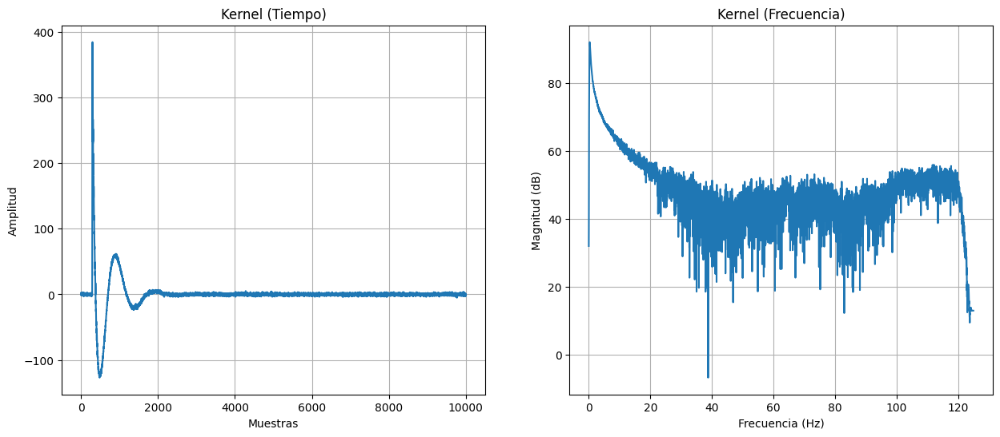

In [40]:
# FFT
fft_kernel = np.fft.fft(kernel)
n_kernel = len(kernel)
fs = 250
freqs_kernel = np.fft.fftfreq(n_kernel, 1/fs)
half_kernel = n_kernel // 2

# Figura con 1 fila y 2 columnas
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Kernel en el tiempo
axes[0].plot(kernel)
axes[0].set_title('Kernel (Tiempo)')
axes[0].set_xlabel('Muestras')
axes[0].set_ylabel('Amplitud')
axes[0].grid(True)

# Kernel en frecuencia
axes[1].plot(freqs_kernel[:half_kernel],
             20*np.log10(np.abs(fft_kernel[:half_kernel]) + 1e-12))
axes[1].set_title('Kernel (Frecuencia)')
axes[1].set_xlabel('Frecuencia (Hz)')
axes[1].set_ylabel('Magnitud (dB)')
axes[1].grid(True)

plt.show()

In [41]:
kernel[0]

np.float64(0.7780060172080994)

##  Importación de librerías

 Plot saved to Desktop: C:\Users\David\Desktop\funcion_transferencia_h4.png


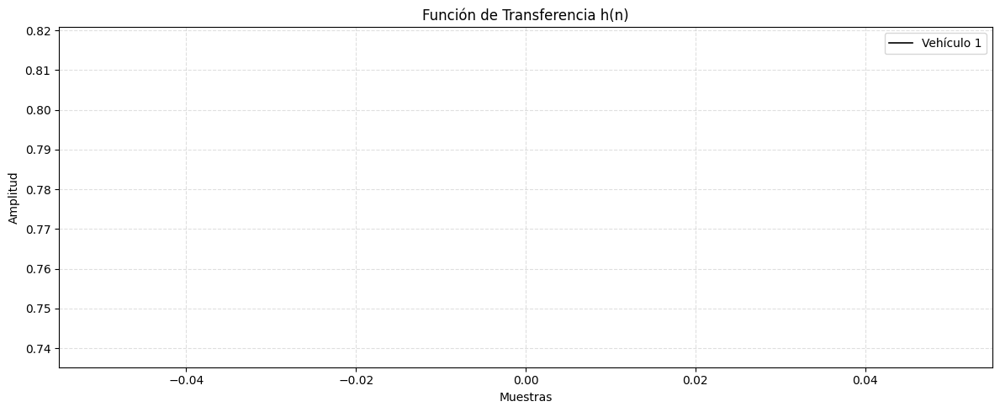

In [42]:
import matplotlib.pyplot as plt
import os

# Simple fix: Save to Desktop (most likely to work)
desktop_path = os.path.join(os.path.expanduser('~'), 'Desktop', 'funcion_transferencia_h4.png')

plt.figure(figsize=(12, 5))
plt.plot(kernel[0], color='black', label='Vehículo 1', linewidth=1.2)
plt.title('Función de Transferencia h(n)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.grid(True, which='both', linestyle='--', alpha=0.4)
plt.grid(which='minor', color='gray', linestyle=':', linewidth=0.5, alpha=0.5)
plt.legend()
plt.tight_layout()

try:
    plt.savefig(desktop_path, dpi=200, bbox_inches='tight')
    print(f" Plot saved to Desktop: {desktop_path}")
except Exception as e:
    print(f" Error: {e}")
    # Fallback: try saving to current notebook directory without subfolder
    try:
        plt.savefig('plot.png', dpi=200, bbox_inches='tight')
        print(" Plot saved as 'plot.png' in current directory")
    except Exception as e2:
        print(f" Still failed: {e2}")
        print("Showing plot without saving...")

plt.show()

In [ ]:
import matplotlib.pyplot as plt

plt.plot(kernel[0], label='Vehículo 1')

In [43]:
import numpy as np

# Función: remove_trend
def remove_trend(data, verbose=False):
    """
    Elimina la tendencia lineal de una traza (vector 1D).

    Parámetros:
        data (np.ndarray): Vector 1D con los datos (n_muestras,)
        verbose (bool): Imprime mensajes si es True

    Retorna:
        np.ndarray: Vector sin tendencia lineal
    """
    if verbose:
        print("Eliminando tendencia lineal...")

    if data.ndim != 1:
        raise ValueError("La entrada debe ser un vector 1D.")

    nsamp = len(data)
    xx = np.arange(nsamp)

    try:
        po = np.polyfit(xx, data, 1)
        mo = np.polyval(po, xx)
        detrended = data - mo
    except Exception as e:
        print(f"Error al ajustar polinomio: {e}")
        print(data)
        raise

    return detrended

import numpy as np

import numpy as np

# Función: remove_coherent_noise_vector
def remove_coherent_noise_vector(data, method='fit', reference=None, verbose=False):
    """
    Elimina el ruido coherente de un vector 1D usando una referencia.

    Parámetros:
        data (np.ndarray): Vector 1D (n_muestras,)
        method (str): 'simple' o 'fit'
        reference (np.ndarray or None): Vector 1D del mismo tamaño que data. Si None y método='simple',
                                        se usará la mediana del vector como referencia constante.
        verbose (bool): Muestra mensajes informativos

    Retorna:
        np.ndarray: Vector con ruido coherente eliminado
    """
    if data.ndim != 1:
        raise ValueError("Solo se admite un vector 1D como entrada.")

    if method not in ['simple', 'fit']:
        raise ValueError("Método inválido. Usa 'simple' o 'fit'.")

    if reference is None:
        if method == 'simple':
            reference = np.median(data) * np.ones_like(data)
        else:
            raise ValueError("El método 'fit' requiere una referencia explícita.")

    if verbose:
        print(f"Eliminando ruido coherente con método '{method}'")

    if reference.shape != data.shape:
        raise ValueError("La referencia debe tener la misma forma que el vector de datos.")

    if method == 'simple':
        return data - reference

    elif method == 'fit':
        den = np.sum(reference * reference)
        if den == 0:
            raise ZeroDivisionError("La referencia es un vector nulo.")
        am = np.sum(data * reference) / den
        return data - am * reference

In [44]:
from scipy.signal import butter, sosfilt
import numpy as np

# Función: bandpass_filter
def bandpass_filter(data, f1, f2, dt, verbose=False):
    """
    Aplica un filtro Butterworth paso banda a un vector 1D.

    Parámetros:
        data (np.ndarray): Vector 1D con los datos
        f1 (float): Frecuencia mínima del filtro (Hz)
        f2 (float): Frecuencia máxima del filtro (Hz)
        dt (float): Intervalo de muestreo (s)
        verbose (bool): Imprime mensajes si es True

    Retorna:
        np.ndarray: Vector filtrado
    """
    if data.ndim != 1:
        raise ValueError("La señal debe ser un vector 1D.")
    
    fs = 1.0 / dt  # frecuencia de muestreo
    sos = butter(4, [f1, f2], btype='bandpass', fs=fs, output='sos')
    
    if verbose:
        print(f"Aplicando filtro Butterworth paso banda: {f1}-{f2} Hz")

    filtered = sosfilt(sos, data)
    return filtered

In [45]:
vehiculo1

array([-0.27084103,  0.24893494,  0.66564971, ...,  0.53005564,
       -2.00291467, -0.97869456])

##  Asignaciones y ejemplos

In [62]:
import numpy as np

def remove_trend(data, verbose=False):
    """
    Elimina la tendencia lineal de una traza (vector 1D).

    Parámetros:
        data (np.ndarray): Vector 1D con los datos (n_muestras,)
        verbose (bool): Imprime mensajes si es True

    Retorna:
        np.ndarray: Vector sin tendencia lineal
    """
    if verbose:
        print("Eliminando tendencia lineal...")

    if data.ndim != 1:
        raise ValueError("La entrada debe ser un vector 1D.")

    nsamp = len(data)
    xx = np.arange(nsamp)

    try:
        po = np.polyfit(xx, data, 1)
        mo = np.polyval(po, xx)
        detrended = data - mo
    except Exception as e:
        print(f"Error al ajustar polinomio: {e}")
        print(data)
        raise

    return detrended

import numpy as np

import numpy as np

def remove_coherent_noise_vector(data, method='fit', reference=None, verbose=False):
    """
    Elimina el ruido coherente de un vector 1D usando una referencia.

    Parámetros:
        data (np.ndarray): Vector 1D (n_muestras,)
        method (str): 'simple' o 'fit'
        reference (np.ndarray or None): Vector 1D del mismo tamaño que data. Si None y método='simple',
                                        se usará la mediana del vector como referencia constante.
        verbose (bool): Muestra mensajes informativos

    Retorna:
        np.ndarray: Vector con ruido coherente eliminado
    """
    if data.ndim != 1:
        raise ValueError("Solo se admite un vector 1D como entrada.")

    if method not in ['simple', 'fit']:
        raise ValueError("Método inválido. Usa 'simple' o 'fit'.")

    if reference is None:
        if method == 'simple':
            reference = np.median(data) * np.ones_like(data)
        else:
            raise ValueError("El método 'fit' requiere una referencia explícita.")

    if verbose:
        print(f"Eliminando ruido coherente con método '{method}'")

    if reference.shape != data.shape:
        raise ValueError("La referencia debe tener la misma forma que el vector de datos.")

    if method == 'simple':
        return data - reference

    elif method == 'fit':
        den = np.sum(reference * reference)
        if den == 0:
            raise ZeroDivisionError("La referencia es un vector nulo.")
        am = np.sum(data * reference) / den
        return data - am * reference

In [63]:
vehiculo1 = remove_trend(vehiculo1, verbose=True)
vehiculo1 = remove_coherent_noise_vector(vehiculo1, method='simple', verbose=True)
dt = 1/250
vehiculo1 = bandpass_filter(vehiculo1, f1=0.1, f2=0.5, dt=dt, verbose=True)

Eliminando tendencia lineal...
Eliminando ruido coherente con método 'simple'
Aplicando filtro Butterworth paso banda: 0.1-0.5 Hz


ANÁLISIS DE VECTOR ÚNICO CON SPARSITY CONTROLADA
PROCESANDO VECTOR ÚNICO
Señal: (4000,)
Kernel: (10000,)
Modo: hard
Target sparsity: 95.0%
Rango señal: [-2.6478, 2.1435]
Rango kernel: [-126.9378, 384.5182]
Parámetros calculados:
  Delta: 0.000000
  Rho: 0.000008
  Factor de sparsity: 1.900
  Noise estimate: 0.000082
Iniciando FISTA con 1000 iteraciones máximas...
  Iteración 50/1000, Sparsity: 1.000
  Iteración 100/1000, Sparsity: 1.000
  Iteración 150/1000, Sparsity: 1.000
  Iteración 200/1000, Sparsity: 1.000
  Iteración 250/1000, Sparsity: 1.000
  Iteración 300/1000, Sparsity: 1.000
  Iteración 350/1000, Sparsity: 1.000
  Iteración 400/1000, Sparsity: 1.000
  Iteración 450/1000, Sparsity: 1.000
  Iteración 500/1000, Sparsity: 1.000
  Iteración 550/1000, Sparsity: 1.000
  Iteración 600/1000, Sparsity: 1.000
  Iteración 650/1000, Sparsity: 0.980
  Iteración 700/1000, Sparsity: 0.972
  Iteración 750/1000, Sparsity: 0.957
  Iteración 800/1000, Sparsity: 0.950
  Iteración 850/1000, Spars

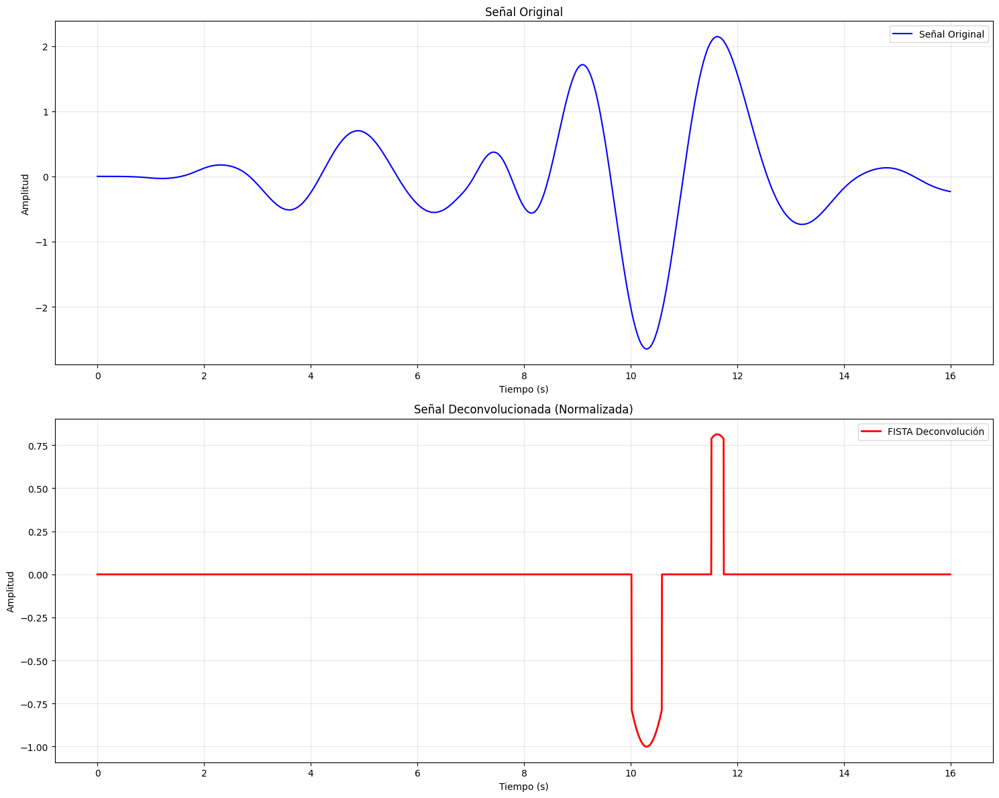


ANÁLISIS DE TIMING DE DELTAS
Delta 1 -> Delta 2: 1328.0 ms (332 muestras)

Estadísticas de intervalos:
  Promedio: 1328.0 ms
  Mediana: 1328.0 ms
  Mínimo: 1328.0 ms
  Máximo: 1328.0 ms
  Std: 0.0 ms

RESUMEN FINAL
Modo de threshold: hard
Sparsity objetivo: 95.0%
Sparsity lograda: 95.0%
Deltas detectados: 2
Longitud señal: 4000 muestras (16.00 segundos)
Intervalo promedio entre deltas: 1328.0 ms
ANÁLISIS DE VECTOR ÚNICO CON SPARSITY CONTROLADA
PROCESANDO VECTOR ÚNICO
Señal: (4000,)
Kernel: (800,)
Modo: hard
Target sparsity: 95.0%
Rango señal: [-2.6478, 2.1435]
Rango kernel: [-1.1675, 1.4950]
Parámetros calculados:
  Delta: 0.000005
  Rho: 0.000008
  Factor de sparsity: 1.900
  Noise estimate: 0.000082
Iniciando FISTA con 1000 iteraciones máximas...
  Iteración 50/1000, Sparsity: 0.950
  Iteración 100/1000, Sparsity: 0.950
  Iteración 150/1000, Sparsity: 0.950
  Iteración 200/1000, Sparsity: 0.950
  Iteración 250/1000, Sparsity: 0.950
  Iteración 300/1000, Sparsity: 0.950
  Iteración 3

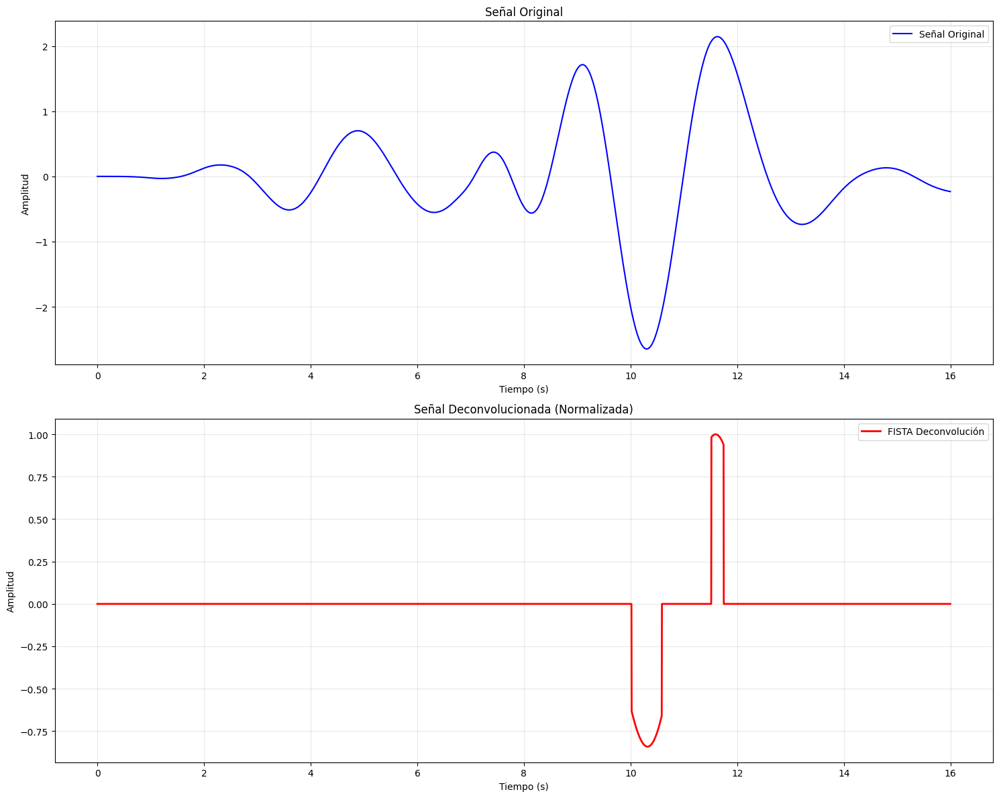


ANÁLISIS DE TIMING DE DELTAS
Delta 1 -> Delta 2: 1272.0 ms (318 muestras)

Estadísticas de intervalos:
  Promedio: 1272.0 ms
  Mediana: 1272.0 ms
  Mínimo: 1272.0 ms
  Máximo: 1272.0 ms
  Std: 0.0 ms

RESUMEN FINAL
Modo de threshold: hard
Sparsity objetivo: 95.0%
Sparsity lograda: 95.0%
Deltas detectados: 2
Longitud señal: 4000 muestras (16.00 segundos)
Intervalo promedio entre deltas: 1272.0 ms


In [64]:
results,vehiculo1, x_deconv, x_norm, peaks, sparsity_evo, fs = run_single_vector_analysis(vehiculo3, kernel, mode='hard', target_sparsity=0.95)
results,vehiculo1, x_deconv1, x_norm1, peaks1, sparsity_evo1, fs1= run_single_vector_analysis(vehiculo3, senal_promedio, mode='hard', target_sparsity=0.95)

##  Bucles y estructuras de control

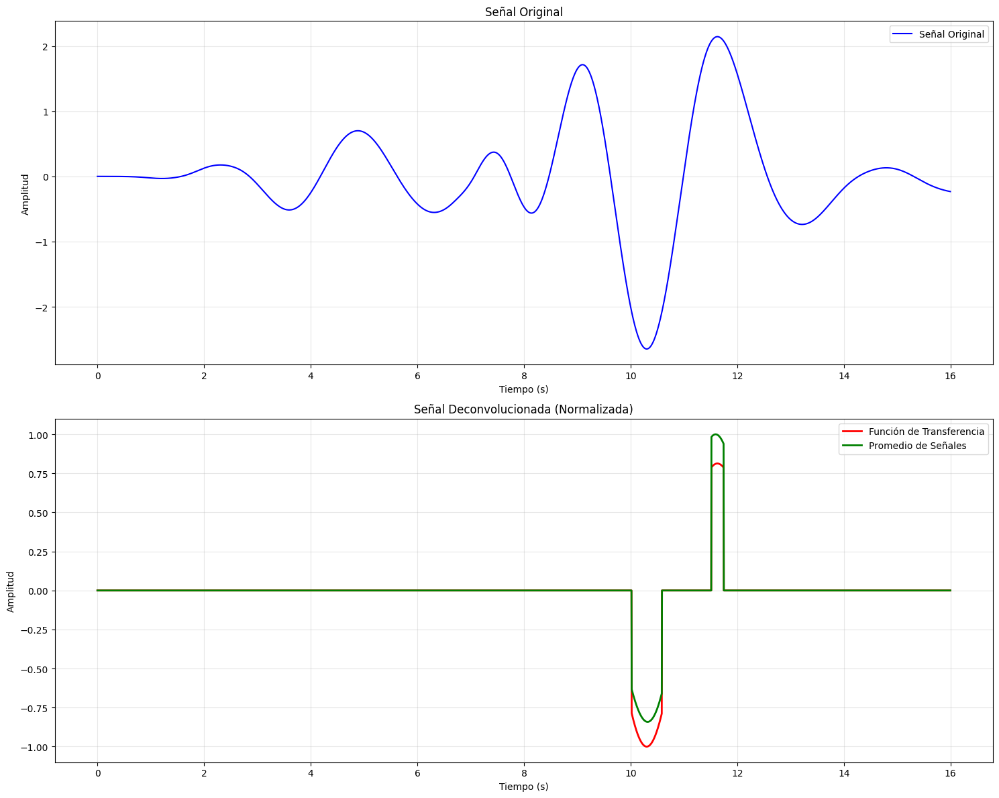

In [65]:
tiempo = np.arange(len(vehiculo1)) / fs
    
fig, axs = plt.subplots(2, 1, figsize=(15, 12))

# 1. Señal original
axs[0].plot(tiempo, vehiculo1, 'b-', linewidth=1.5, label='Señal Original')
axs[0].set_title('Señal Original')
axs[0].set_xlabel('Tiempo (s)')
axs[0].set_ylabel('Amplitud')
axs[0].legend()
axs[0].grid(True, alpha=0.3)

# 2. Señal deconvolucionada

axs[1].plot(tiempo, x_norm, 'r-', linewidth=2, label='Función de Transferencia')
axs[1].plot(tiempo, x_norm1, 'g-', linewidth=2, label='Promedio de Señales')


# Marcar picos detectados
if peaks:
    peak_positions = [p[0] for p in peaks]
    peak_values = [p[1] for p in peaks]
    

axs[1].set_title('Señal Deconvolucionada (Normalizada)')
axs[1].set_xlabel('Tiempo (s)')
axs[1].set_ylabel('Amplitud')
axs[1].legend()
axs[1].grid(True, alpha=0.3)



plt.tight_layout()
plt.show()

##  Asignaciones y ejemplos

ANÁLISIS DE VECTOR ÚNICO CON SPARSITY CONTROLADA
PROCESANDO VECTOR ÚNICO
Señal: (4000,)
Kernel: (800,)
Modo: hard
Target sparsity: 95.0%
Rango señal: [-2.6478, 2.1435]
Rango kernel: [-1.1675, 1.4950]
Parámetros calculados:
  Delta: 0.000005
  Rho: 0.000008
  Factor de sparsity: 1.900
  Noise estimate: 0.000082
Iniciando FISTA con 1000 iteraciones máximas...
  Iteración 50/1000, Sparsity: 0.950
  Iteración 100/1000, Sparsity: 0.950
  Iteración 150/1000, Sparsity: 0.950
  Iteración 200/1000, Sparsity: 0.950
  Iteración 250/1000, Sparsity: 0.950
  Iteración 300/1000, Sparsity: 0.950
  Iteración 350/1000, Sparsity: 0.950
  Iteración 400/1000, Sparsity: 0.950
  Iteración 450/1000, Sparsity: 0.950
  Iteración 500/1000, Sparsity: 0.950
  Iteración 550/1000, Sparsity: 0.950
  Iteración 600/1000, Sparsity: 0.950
  Iteración 650/1000, Sparsity: 0.950
  Iteración 700/1000, Sparsity: 0.950
  Iteración 750/1000, Sparsity: 0.950
  Iteración 800/1000, Sparsity: 0.950
  Iteración 850/1000, Sparsity: 0

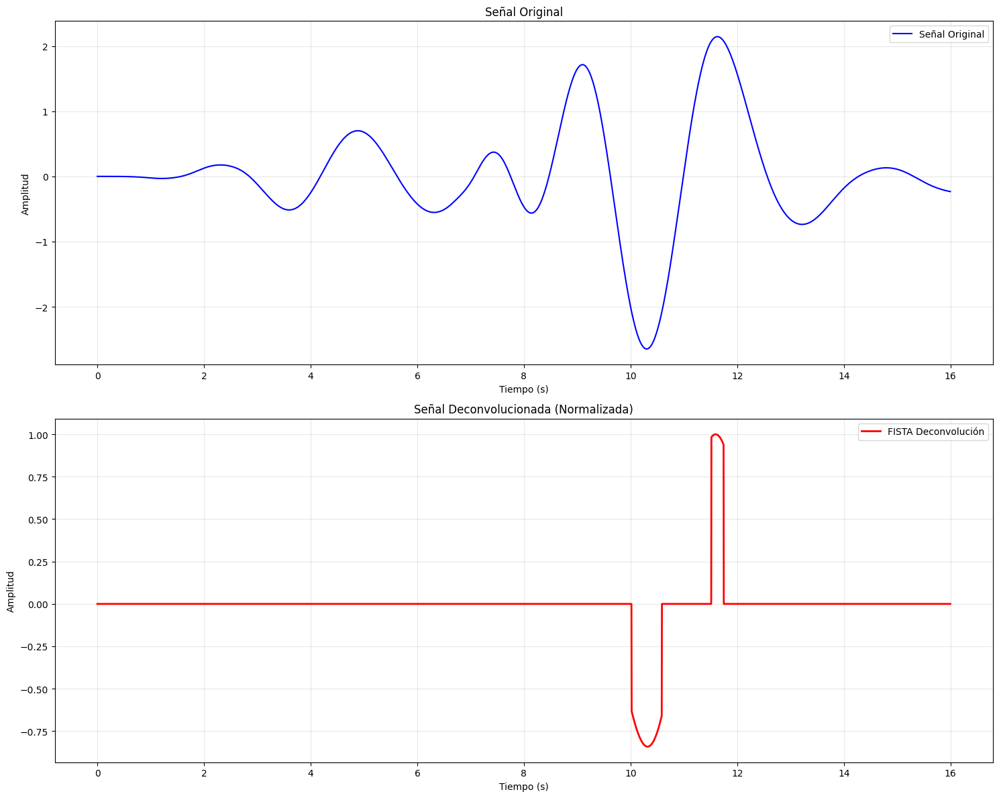


ANÁLISIS DE TIMING DE DELTAS
Delta 1 -> Delta 2: 1272.0 ms (318 muestras)

Estadísticas de intervalos:
  Promedio: 1272.0 ms
  Mediana: 1272.0 ms
  Mínimo: 1272.0 ms
  Máximo: 1272.0 ms
  Std: 0.0 ms

RESUMEN FINAL
Modo de threshold: hard
Sparsity objetivo: 95.0%
Sparsity lograda: 95.0%
Deltas detectados: 2
Longitud señal: 4000 muestras (16.00 segundos)
Intervalo promedio entre deltas: 1272.0 ms


In [66]:
results = run_single_vector_analysis(vehiculo1, senal_promedio, mode='hard', target_sparsity=0.95)

In [52]:
kernel_1d = kernel.flatten()  # o kernel[0, :] también sirve
deconvolved_1d = results["deconvolved"].flatten()
aux = np.convolve(kernel_1d, deconvolved_1d)
plt.figure(figsize=(12, 6))
plt.plot(vehiculo1, label='Original', alpha=0.7)
plt.plot(aux/np.max(np.abs(aux)), label='Convolucion H x Fista', alpha=0.7)
plt.xlim(0, 6000)  # Ajusta el rango del eje x

plt.legend()
plt.show()

TypeError: tuple indices must be integers or slices, not str

In [67]:
vehiculo2 = remove_trend(vehiculo2, verbose=True)
vehiculo2 = remove_coherent_noise_vector(vehiculo2, method='simple', verbose=True)
dt = 1/250
vehiculo2 = bandpass_filter(vehiculo2, f1=0.1, f2=0.5, dt=dt, verbose=True)

Eliminando tendencia lineal...
Eliminando ruido coherente con método 'simple'
Aplicando filtro Butterworth paso banda: 0.1-0.5 Hz


In [ ]:
results2 = run_single_vector_analysis(vehiculo2, kernel, mode='hard', target_sparsity=0.99)

In [58]:
vehiculo3 = remove_trend(vehiculo3, verbose=True)
vehiculo3 = remove_coherent_noise_vector(vehiculo3, method='simple', verbose=True)
dt = 1/250
vehiculo3 = bandpass_filter(vehiculo3, f1=0.1, f2=0.5, dt=dt, verbose=True)

Eliminando tendencia lineal...
Eliminando ruido coherente con método 'simple'
Aplicando filtro Butterworth paso banda: 0.1-0.5 Hz


ANÁLISIS DE VECTOR ÚNICO CON SPARSITY CONTROLADA
PROCESANDO VECTOR ÚNICO
Señal: (4000,)
Kernel: (10000,)
Modo: hard
Target sparsity: 95.0%
Rango señal: [-2.6478, 2.1435]
Rango kernel: [-126.9378, 384.5182]
Parámetros calculados:
  Delta: 0.000000
  Rho: 0.000008
  Factor de sparsity: 1.900
  Noise estimate: 0.000082
Iniciando FISTA con 1000 iteraciones máximas...
  Iteración 50/1000, Sparsity: 1.000
  Iteración 100/1000, Sparsity: 1.000
  Iteración 150/1000, Sparsity: 1.000
  Iteración 200/1000, Sparsity: 1.000
  Iteración 250/1000, Sparsity: 1.000
  Iteración 300/1000, Sparsity: 1.000
  Iteración 350/1000, Sparsity: 1.000
  Iteración 400/1000, Sparsity: 1.000
  Iteración 450/1000, Sparsity: 1.000
  Iteración 500/1000, Sparsity: 1.000
  Iteración 550/1000, Sparsity: 1.000
  Iteración 600/1000, Sparsity: 1.000
  Iteración 650/1000, Sparsity: 0.980
  Iteración 700/1000, Sparsity: 0.972
  Iteración 750/1000, Sparsity: 0.957
  Iteración 800/1000, Sparsity: 0.950
  Iteración 850/1000, Spars

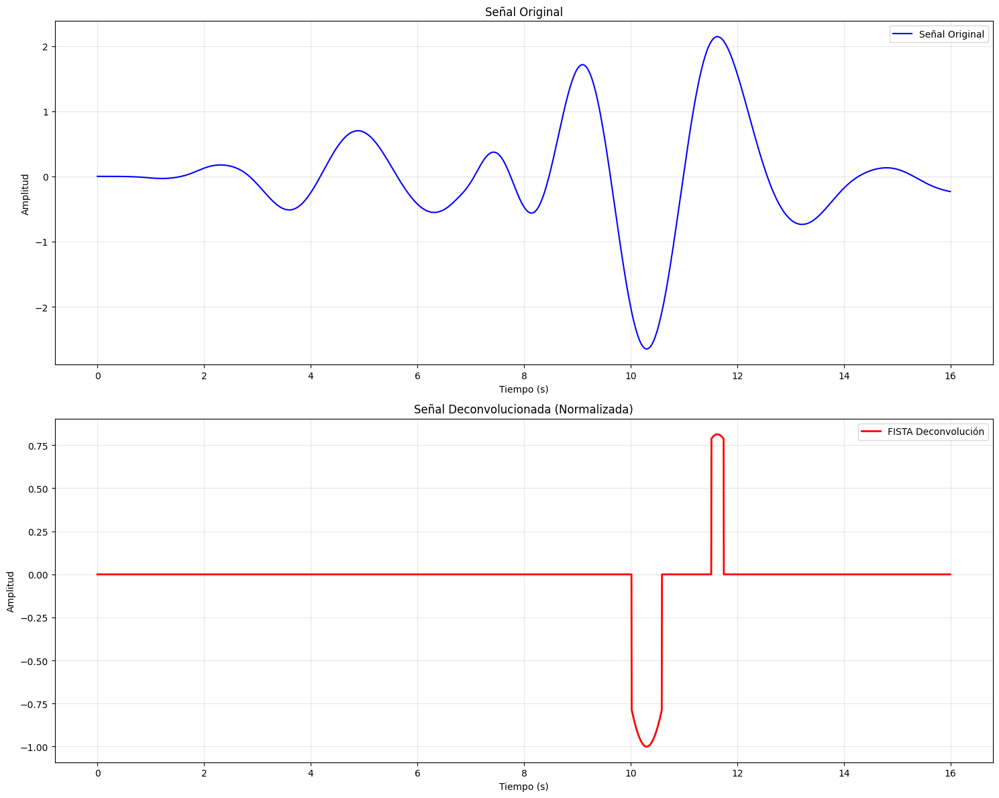


ANÁLISIS DE TIMING DE DELTAS
Delta 1 -> Delta 2: 1328.0 ms (332 muestras)

Estadísticas de intervalos:
  Promedio: 1328.0 ms
  Mediana: 1328.0 ms
  Mínimo: 1328.0 ms
  Máximo: 1328.0 ms
  Std: 0.0 ms

RESUMEN FINAL
Modo de threshold: hard
Sparsity objetivo: 95.0%
Sparsity lograda: 95.0%
Deltas detectados: 2
Longitud señal: 4000 muestras (16.00 segundos)
Intervalo promedio entre deltas: 1328.0 ms


In [59]:
results3 = run_single_vector_analysis(vehiculo3, kernel, mode='hard', target_sparsity=0.95)

ANÁLISIS DE VECTOR ÚNICO CON SPARSITY CONTROLADA
PROCESANDO VECTOR ÚNICO
Señal: (4000,)
Kernel: (800,)
Modo: hard
Target sparsity: 95.0%
Rango señal: [-2.6478, 2.1435]
Rango kernel: [-1.1675, 1.4950]
Parámetros calculados:
  Delta: 0.000005
  Rho: 0.000008
  Factor de sparsity: 1.900
  Noise estimate: 0.000082
Iniciando FISTA con 1000 iteraciones máximas...
  Iteración 50/1000, Sparsity: 0.950
  Iteración 100/1000, Sparsity: 0.950
  Iteración 150/1000, Sparsity: 0.950
  Iteración 200/1000, Sparsity: 0.950
  Iteración 250/1000, Sparsity: 0.950
  Iteración 300/1000, Sparsity: 0.950
  Iteración 350/1000, Sparsity: 0.950
  Iteración 400/1000, Sparsity: 0.950
  Iteración 450/1000, Sparsity: 0.950
  Iteración 500/1000, Sparsity: 0.950
  Iteración 550/1000, Sparsity: 0.950
  Iteración 600/1000, Sparsity: 0.950
  Iteración 650/1000, Sparsity: 0.950
  Iteración 700/1000, Sparsity: 0.950
  Iteración 750/1000, Sparsity: 0.950
  Iteración 800/1000, Sparsity: 0.950
  Iteración 850/1000, Sparsity: 0

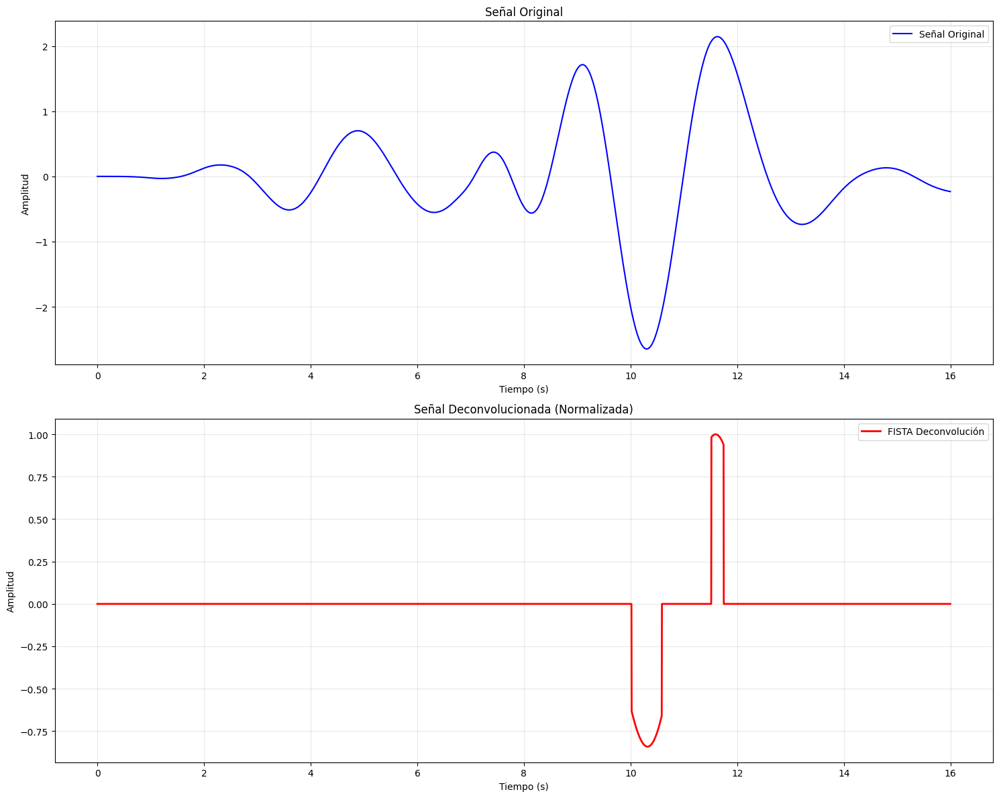


ANÁLISIS DE TIMING DE DELTAS
Delta 1 -> Delta 2: 1272.0 ms (318 muestras)

Estadísticas de intervalos:
  Promedio: 1272.0 ms
  Mediana: 1272.0 ms
  Mínimo: 1272.0 ms
  Máximo: 1272.0 ms
  Std: 0.0 ms

RESUMEN FINAL
Modo de threshold: hard
Sparsity objetivo: 95.0%
Sparsity lograda: 95.0%
Deltas detectados: 2
Longitud señal: 4000 muestras (16.00 segundos)
Intervalo promedio entre deltas: 1272.0 ms


In [60]:
results3 = run_single_vector_analysis(vehiculo3, senal_promedio, mode='hard', target_sparsity=0.95)

In [ ]:
kernel_1d = kernel.flatten()  # o kernel[0, :] también sirve
deconvolved_1d = results3["deconvolved"].flatten()
aux = np.convolve(kernel_1d, deconvolved_1d)
plt.figure(figsize=(12, 6))
plt.plot(vehiculo3, label='Original', alpha=0.7)
plt.plot(aux/np.max(np.abs(aux)), label='Convolucion H x Fista', alpha=0.7)
plt.xlim(0, 6000)  # Ajusta el rango del eje x

plt.legend()
plt.show()